<a href="https://colab.research.google.com/github/NataliaBlueCloud/traffic-latency-simulator/blob/main/simulation_MM1_Tokyo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
system('git clone https://github.com/NataliaBlueCloud/traffic-latency-simulator.git')


In [3]:
install.packages("igraph")
install.packages("simmer")
install.packages("SciViews")
install.packages("hrbrthemes")
install.packages("viridis")
install.packages("googledrive")
install.packages("readxl")
install.packages("openxlsx")


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘Rcpp’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘ellipse’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘triebeard’, ‘httpuv’, ‘xtable’, ‘sourcetools’, ‘later’, ‘promises’, ‘urltools’, ‘httpcode’, ‘shiny’, ‘crul’, ‘fontBitstreamVera’, ‘fontLiberation’, ‘extrafontdb’, ‘Rttf2pt1’, ‘gfonts’, ‘fontquiver’, ‘extrafont’, ‘gdtools’


Warning message in install.packages("hrbrthemes"):
“installation of package ‘gdtools’ had non-zero exit status”
Warning message in install.packages("hrbrthemes"):
“installation of package ‘hrbrthemes’ had non-zero exit status”
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing t

In [4]:
library(ggplot2)
library(igraph)
library(stringr)
library(simmer)
library(tidyverse)
library(readr)
library(SciViews)
library(dplyr)
library(viridis)
library(readxl)
library(openxlsx)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ lubridate::%--%()      masks igraph::%--%()
✖ dplyr::as_data_frame() masks tibble::as_data_frame(), igraph::as_data_frame()
✖ purrr::compose()       masks igraph::compose()
✖ tidyr::crossing()      masks igraph::crossing()
✖ dplyr::filter()        masks stats::filter()
✖ dplyr::lag()           masks stats::lag()
✖ lubridate::now()       masks simmer::now()
✖ lubridate::rollback()  masks simmer::rollback()
✖ dplyr::select()        masks simmer::select()
✖ tidyr::separate()      masks simmer::separate()
✖ purrr:

In [24]:
source("/content/traffic-latency-simulator/func/igraph_function_base.R")
source("/content/traffic-latency-simulator/func/igraph_functions.R")
source("/content/traffic-latency-simulator/func/igraph_functions_techno_economic.R")
source("/content/traffic-latency-simulator/func/simmer_function_base.R")
source("/content/traffic-latency-simulator/func/general_function_base.R")

#Input data

The **average packet size** is taken from: Amsterdam Internet Exchange Ethernet Frame Size Distribution, statistics available online at https://stats.ams-ix.net/sflow/size.html, accessed on July 2023

Packet sizes in Bytes: 64-127, 128-511, 512 - 1023, 1024 - 1513, 1514, more than 1515.


With their probabilities: 0.332, 0.054, 0.033, 0.037, 0.346, 0.146, 0.052

In [6]:
  PS_size=c((64+127)/2,(128+255)/2,(256+511)/2, (512+1023)/2, (1024+1513)/2, 1514, (1515+9100)/2)
  PS_weights=c(33.2/100, 5.4/100, 3.3/100, 3.7/100, 34.6/100, 14.6/100, 5.2/100)
  N = sum(PS_size*PS_weights)
  N

[1] 1019.035

Input excel file with topology information: links, nodes, traffic

In [7]:
#Milano
file_name_v2 <- "/content/traffic-latency-simulator/input_files/Metro_topology_full_Tokyo.xlsx"

In [8]:
nodes_info <- read_excel(file_name_v2, sheet = 1)
links_info <- read_excel(file_name_v2, sheet = 2)
traffic_file <- read_excel(file_name_v2, sheet = 3)

In [9]:
print(links_info)
print(nodes_info)
print(traffic_file)

# A tibble: 86 × 4
   sourceID destinationID distanceKm capacityGbps
   <chr>    <chr>              <dbl>        <dbl>
 1 Tokyo_01 Tokyo_02             1          1346.
 2 Tokyo_01 Tokyo_03             1           928.
 3 Tokyo_01 Tokyo_04             0.8           0 
 4 Tokyo_01 Tokyo_05             0.8           0 
 5 Tokyo_01 Tokyo_06             0.8        1750.
 6 Tokyo_02 Tokyo_01             1          8856.
 7 Tokyo_02 Tokyo_03             1             0 
 8 Tokyo_02 Tokyo_08             1           917.
 9 Tokyo_03 Tokyo_01             1          7263.
10 Tokyo_03 Tokyo_02             1             0 
# ℹ 76 more rows
# A tibble: 23 × 11
   node_name node_code `Node Type`  `Central office type` Reference Regional C…¹
   <chr>     <chr>     <chr>        <chr>                 <chr>                 
 1 Tokyo_01  HL2       Metro Core … National CO           Tokyo_07              
 2 Tokyo_02  HL4       Metro Aggre… Local CO              Tokyo_07              
 3 Tokyo_03  HL4    

Definition of national and regional Cental Offices (COs).


Prefix base - the common name for the nodes in the file.

In [59]:
prefix_base <- "Tokyo_"
national_nodes <- c(01, 04, 05)
regional_nodes <- c(07, 16, 13)

#Functions

##Calculation e2e delays theoretically

In [60]:
prop_queue_tr_delay_e2e <- function(g, traffic_file){
  ###################################################
  E(g)$Queue_Delay <- ifelse(E(g)$Traffic == 0, 0, E(g)$Ni/E(g)$Traffic) #MM1
  ###################################calc e2e delay as summing the delays of all links in the path
  latencyPropTransQueuing_theor_s <- rep(0, nrow(traffic_file))
  latencyPercentile99_theor_s <- rep(0, nrow(traffic_file))
  for (line in 1:nrow(traffic_file))
  {
    if(traffic_file$traffic_ps[line] != 0){
      vertex_sourse <- which(V(g)$name==traffic_file$sourceID[line])
      vertex_destination<- which(V(g)$name==traffic_file$destinationID[line])
      path <- shortest_paths(g, vertex_sourse, vertex_destination,
                             weights = NULL,
                             output = "both",
                             algorithm = c("automatic"))
      latencyPropTransQueuing_theor_s[line] = sum(E(g)[path[["epath"]][[1]]]$Queue_Delay) + sum(E(g)[path[["epath"]][[1]]]$Prop_Delay)
      latencyPercentile99_theor_s[line] <- func_bounds_hoeffding(sum(E(g)[path[["epath"]][[1]]]$Queue_Delay) + sum(E(g)[path[["epath"]][[1]]]$Prop_Delay), 0.99, E(g)[path[["epath"]][[1]]]$Queue_Delay, E(g)[path[["epath"]][[1]]]$Prop_Delay, 0.99)
    }
    else {
      latencyPropTransQueuing_theor_s[line] <- 0
      latencyPercentile99_theor_s[line] <- 0
    }
  }
  return(list(g, latencyPropTransQueuing_theor_s, latencyPercentile99_theor_s))
}

##Calculations delays and traffic values for given loads and capacities



**Arguments**:

*nodes_info, links_info, traffic_file* - input data from excel file;

*Capacity* - of the links Gbps;

*Load_local*, *Load_regional*,*Load_national* - difine the load in Loacal, Regional, and National COs;

*prefix_base* - the common name for the nodes in the file;

*national_nodes, regional_nodes* - difine nodes that are Regional or National CO (the rest are Local by default);

*N* - average packet size.


**Return values**:
*g* - the graph, with the edges (and attributes) added;
*data_av* - numeric vector of average delay of all traffic flows;
*data_99* - numeric vector of 99th hoeffdinf upper bound of all traffic flows;

In [61]:
simulation_igraph <- function(nodes_info, links_info, traffic_file, Capacity = 10, calc_dist =  FALSE, distance = 5, Load_local = 0.3, Load_regional = 0.5, Load_national = 0.4, prefix_base, national_nodes, regional_nodes, N){

  traffic_file$traffic_ps <- traffic_file$trafficGbps*10^9/(8*N)
  g = graph.data.frame(links_info, directed = TRUE)
  E(g)$capacityGbps <- Capacity
  for (NCO in national_nodes){
    a <- (filter(traffic_file, traffic_file$destinationID == paste0(prefix_base,NCO)))
    size <- length(a$destinationID)
    E(g)$capacityGbps[incident(g, NCO, mode = c("in"))] <- Capacity*size
    }


  #######################

  E(g)$Capacity <- E(g)$capacityGbps*10^9/(8*N) #p/s

  ############distance put original distance(calc_dist = 1) or custom distance (calc_dist = 1) with paramentr "distance" in km
  if( calc_dist == TRUE ) {
    E(g)$Distance = E(g)$distanceKm * distance
  }
  else {
    E(g)$Distance <- E(g)$distanceKm
  }
  ####Load of the links
  #for Local CO
  E(g)$Load <- Load_local
  #national COs
  for (NCO in national_nodes){
    E(g)$Load[incident(g, NCO, mode = c("in"))] <- Load_national
  }
  #regional COs
  for (RCO in regional_nodes){
    E(g)$Load[incident(g, RCO, mode = c("in"))] <- Load_regional
  }

  E(g)$Traffic <- E(g)$Capacity * E(g)$Load
  E(g)$Ni = E(g)$Load/(1-E(g)$Load) # average number of packets in each system
  E(g)$Prop_Delay <- 5*10^(-6)*E(g)$Distance

  c(g, traffic_file$latencyPropTransQueuing_theor_s_mm1, traffic_file$latencyPercentile99_theor_s_mm1) := prop_queue_tr_delay_e2e(g, traffic_file)

  data_av <- traffic_file$latencyPropTransQueuing_theor_s_mm1

  data_99 <- traffic_file$latencyPercentile99_theor_s_mm1
  #removing the local traffic
  data_av <- data_av[data_av != 0]
  data_99 <- data_99[data_99 != 0]
  return(list(g, data_av, data_99))

}



#Igraph calculations


##Building the graph:


In [62]:
g <- graph.data.frame(links_info, directed = TRUE, vertices = nodes_info)

##Calculations of the capacity in p/s



In [63]:
E(g)$Distance <- E(g)$distanceKm
E(g)$Definition <- paste0(get.edgelist(g)[,1],"->",get.edgelist(g)[,2])
E(g)$Capacity <- E(g)$capacityGbps*10^9/(8*N)

##Plot graph

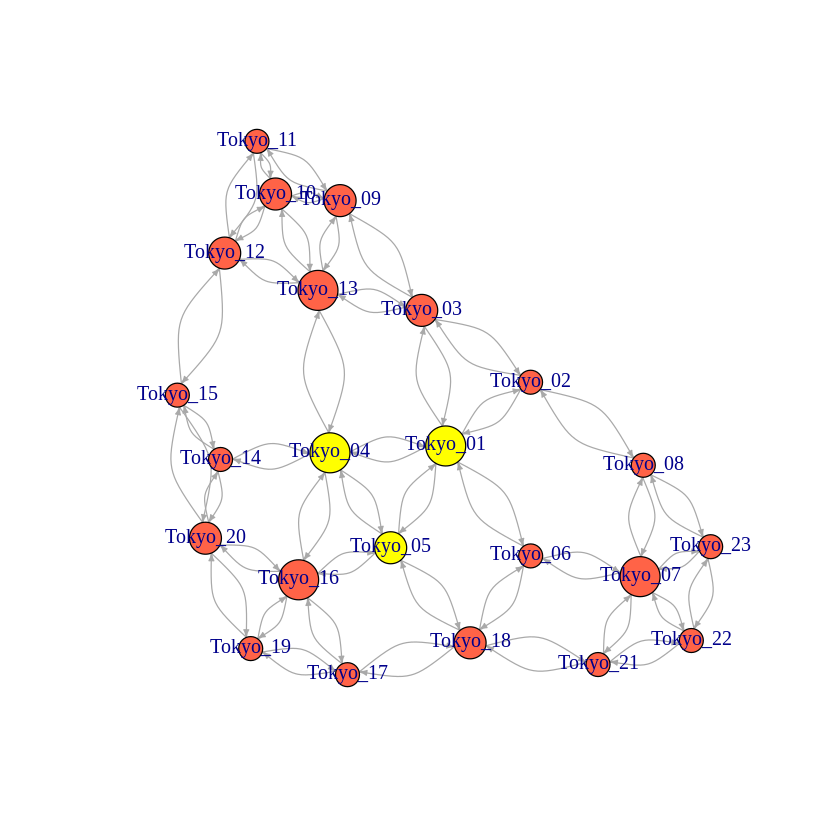

In [64]:
#plot graph
V(g)$color <- "tomato"
V(g)$color[1] <- "yellow"
V(g)$color[4] <- "yellow"
V(g)$color[5] <- "yellow"

deg <- degree(g, mode="all")
V(g)$size <- deg*1.5
l <- layout.auto(g)
plot(g, edge.arrow.size=.3, vertex.label = V(g)$name, edge.curved=.5, layout=l)

## Total traffic calculatons


In [65]:
traffic_file$traffic_ps <- traffic_file$trafficGbps*10^9/(8*N)
matrix_traffic <- matrix(0, nrow = length(V(g)), ncol = length(V(g)), dimnames = list(V(g), V(g)))
for (line in 1:nrow(traffic_file))
{

  vertex_sourse <- which(V(g)$name==traffic_file$sourceID[line])
  vertex_destination<- which(V(g)$name==traffic_file$destinationID[line])

  matrix_traffic[vertex_sourse, vertex_destination] <- matrix_traffic[vertex_sourse, vertex_destination] + traffic_file$traffic_ps[line]
}
g <- calc_full_traffic_for_matrix(g, matrix_traffic, N)
print("Total traffic for each link:")
print(paste("Link ",E(g)$Definition,"=",E(g)$Traffic))


[1] "Total traffic for each link:"
 [1] "Link  Tokyo_01->Tokyo_02 = 79834230.4238814"
 [2] "Link  Tokyo_01->Tokyo_03 = 54287389.5401041"
 [3] "Link  Tokyo_01->Tokyo_04 = 0"               
 [4] "Link  Tokyo_01->Tokyo_05 = 0"               
 [5] "Link  Tokyo_01->Tokyo_06 = 105745018.571492"
 [6] "Link  Tokyo_02->Tokyo_01 = 604245560.751103"
 [7] "Link  Tokyo_02->Tokyo_03 = 0"               
 [8] "Link  Tokyo_02->Tokyo_08 = 48980530.6000285"
 [9] "Link  Tokyo_03->Tokyo_01 = 488586505.860937"
[10] "Link  Tokyo_03->Tokyo_02 = 0"               
[11] "Link  Tokyo_03->Tokyo_09 = 42720073.4027781"
[12] "Link  Tokyo_03->Tokyo_13 = 0"               
[13] "Link  Tokyo_04->Tokyo_01 = 0"               
[14] "Link  Tokyo_04->Tokyo_05 = 0"               
[15] "Link  Tokyo_04->Tokyo_13 = 80974034.2579009"
[16] "Link  Tokyo_04->Tokyo_14 = 90064251.9638678"
[17] "Link  Tokyo_04->Tokyo_16 = 96062328.5755641"
[18] "Link  Tokyo_05->Tokyo_01 = 0"               
[19] "Link  Tokyo_05->Tokyo_04 = 0"            

## Calculations of the load, average number of packets, queueing and propagation delays:

In [66]:
E(g)$Load <- ifelse(E(g)$Traffic !=0, E(g)$Traffic/E(g)$Capacity, 0)

In [67]:
########################load and delays calc
E(g)$Ni = E(g)$Load/(1-E(g)$Load) # average number of packets in each system
#E(g)$Queue_Delay = E(g)$Ni/E(g)$Traffic
E(g)$Queue_Delay <- ifelse(E(g)$Traffic == 0, 0, E(g)$Ni/E(g)$Traffic)
E(g)$Prop_Delay <- 5*10^(-6)*E(g)$Distance

In [68]:
#av load except zero
load <- dplyr::filter(data_frame(E(g)$Load), data_frame(E(g)$Load) != 0)
prop_delay <- dplyr::filter(data_frame(E(g)$Prop_Delay), data_frame(E(g)$Load) != 0)
capacity <- dplyr::filter(data_frame(E(g)$Capacity), data_frame(E(g)$Load) != 0)
traffic <- dplyr::filter(data_frame(E(g)$Traffic), data_frame(E(g)$Load) != 0)
sourceID = dplyr::filter(data_frame(ends(g, E(g))[,1]), data_frame(E(g)$Load) != 0)
destination = dplyr::filter(data_frame(ends(g, E(g))[,2]), data_frame(E(g)$Load) != 0)
df <- data.frame(sourceID = sourceID$`ends(g, E(g))[, 1]`, destinationID = destination$`ends(g, E(g))[, 2]`,
traffic_ps = traffic$`E(g)$Traffic`, capacity_ps = capacity$`E(g)$Capacity`, load = load$`E(g)$Load`, prop_delay_s = prop_delay$`E(g)$Prop_Delay`)
#safe log file
links_info_df <- df[order(df$load, decreasing = TRUE),]



#Output table with links information: traffic, load, propagation delay

In [69]:
links_info_df

,sourceID,destinationID,traffic_ps,capacity_ps,load,prop_delay_s
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
31,Tokyo_16,Tokyo_17,25955929,39476037,0.6575110,2e-06
17,Tokyo_08,Tokyo_23,12695835,19863720,0.6391469,5e-06
36,Tokyo_19,Tokyo_16,398293729,631270562,0.6309398,2e-06
33,Tokyo_17,Tokyo_16,233603360,374818527,0.6232439,2e-06
37,Tokyo_20,Tokyo_14,341644914,551042097,0.6199978,3e-06
25,Tokyo_13,Tokyo_12,7625965,12464415,0.6118189,4e-06
20,Tokyo_10,Tokyo_13,348754582,588141071,0.5929778,4e-06
30,Tokyo_16,Tokyo_04,864560957,1543583821,0.5600998,3e-06
4,Tokyo_02,Tokyo_01,604245561,1086357385,0.5562125,5e-06


#Simmer simultion

Including queuing, transmission, propagation delay

In [70]:
simulation_simmer <- function(g, traffic_file){
  E(g)$Queue_Delay_sim <- 0
  E(g)$Queue_Delay_theor_hoeff99 <- 0
  E(g)$Queue_Delay_sim_99p <- 0

  #####################################simmer
  queue_delay_tr_flow <- c()
  prop_delay_tr_flow <- c()
  delay_tr_flow <- c()
  delay_tr_flow_p_99 <- c()
  exp_delay_igraph <- c()
  delay_tr_flow_hoeffd_p_99_100 <- c()
  digits = 10
  print("start simulation in simmer")
  for (line in 1:nrow(traffic_file))
  {
    print(line)
    #env <- simmer("SuperDuperSim") #creating the simmer environment

    if(traffic_file$sourceID[line] != traffic_file$destinationID[line] && traffic_file$traffic_ps[line] != 0)
    {
      env <- simmer()
      lambda_simmer <- traffic_file$traffic_ps[line]
      set.seed(42)
      env <- simmer_resources(g, env) # add resources for all nodes of igraph (func is in the file simmer_fictions)
      env <- simmer_crosstrajectory_simulation(env, g, traffic_file$sourceID[line], traffic_file$destinationID[line], lambda_simmer) #creating cross trajectories with theirs generator  (func is in the file simmer_fictions)



      c(env, traffic_traj_name, delay_queue, delay_prop) := simmer_simulation(env, traffic_file$sourceID[line], traffic_file$destinationID[line], g, traffic_val=lambda_simmer, log_info = "") #creation main trajectory with its generator


      env %>% #env execution
        run(10000/lambda_simmer) #10000 packets of the main lambda trajectory



      #########################delay results processing
      all_arrivals_res <- data.frame(env %>%
                                       get_mon_arrivals(per_resource = TRUE) %>%
                                       transform(waiting_time_in_queue = round(end_time - start_time - activity_time)) %>%
                                       transform(spending_time = end_time - start_time))


      ############################plots for each node (only with queuing delay)
      ##########computing the bounds and parameters (mean, variance, and etc)
      path <- shortest_paths(g, traffic_file$sourceID[line], traffic_file$destinationID[line] ,weights = NULL, output = "both", algorithm = c("automatic"))
      path_size <- length(path[["vpath"]][[1]])
      n=1
      for (node in path[["vpath"]][[1]][-path_size])
      {
        traffic <- dplyr::filter(all_arrivals_res, paste0("node_", node) == all_arrivals_res$resource)
        if (length(traffic$spending_time) != 0)
        {
          print(node)
          delay_nodes <- mean(traffic$spending_time)
          p_99_result <- unname(quantile(traffic$spending_time, probs = 0.99))
          ####################
          print(paste("Node - ", node, ":"))
          bounds_function_node(delay_queue[node], traffic$spending_time, digits, info = paste("Node - ", node, ";","For the traffic flow:from",traffic_file$sourceID[line],"to", traffic_file$destinationID[line]))#plot the results for each node
          E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]), multi=TRUE)]$Queue_Delay_sim <- delay_nodes
          E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]), multi=TRUE)]$Queue_Delay_sim_99p <- p_99_result
          E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]), multi=TRUE)]$Queue_Delay_theor_hoeff99 <- func_bounds_hoeffding(delay_queue[node], 0.99,delay_queue[node], 0, 0.99)

          print(E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]), multi=TRUE)])
          n=n+1

        }

      }

      ###########################plots for each traffic flow (prop + queuing delays)
      #########################delay results processing
      all_arrivals_res <- data.frame(env %>%
                                       get_mon_arrivals(per_resource = FALSE) %>%
                                       transform(waiting_time_in_queue = round(end_time - start_time - activity_time)) %>%
                                       transform(spending_time = end_time - start_time))
      traffic <- dplyr::filter(all_arrivals_res, grepl(traffic_traj_name , all_arrivals_res$name))
      exp_delay = sum(delay_prop,delay_queue)
      exp_delay_igraph <- append(exp_delay_igraph,exp_delay)

      bounds_function_1w_path(sum(delay_prop), sum(delay_queue), traffic$spending_time, digits, info = paste("For the traffic flow:from",traffic_file$sourceID[line],"to", traffic_file$destinationID[line]))#plot the results for tr flow
      queue_delay_tr_flow <- append(queue_delay_tr_flow, sum(delay_queue))
      prop_delay_tr_flow <- append(prop_delay_tr_flow, sum(delay_prop))
      delay_tr_flow <- append(delay_tr_flow, mean(traffic$spending_time))
      delay_tr_flow_p_99 <- append(delay_tr_flow_p_99, unname(quantile(traffic$spending_time, probs = 0.99)))
      hoeff <- func_bounds_hoeffding(sum(delay_queue, delay_prop), 0.99, delay_queue, delay_prop, 0.99)
      delay_tr_flow_hoeffd_p_99_100 <- append(delay_tr_flow_hoeffd_p_99_100, hoeff)

    } else{
      print("no info of traffic")
      exp_delay_igraph <- append(exp_delay_igraph,0)
      queue_delay_tr_flow <- append(queue_delay_tr_flow, 0)
      prop_delay_tr_flow <- append(prop_delay_tr_flow, NaN)
      delay_tr_flow <- append(delay_tr_flow, 0)
      delay_tr_flow_p_99 <- append(delay_tr_flow_p_99, 0)
      delay_tr_flow_hoeffd_p_99_100 <- append(delay_tr_flow_hoeffd_p_99_100, 0)
      print(delay_tr_flow)
    }
  }


  df <- data_frame(exp_delay_igraph, delay_tr_flow, delay_tr_flow_p_99, delay_tr_flow_hoeffd_p_99_100)

  return(list(delay_tr_flow, exp_delay_igraph, delay_tr_flow_p_99, delay_tr_flow_hoeffd_p_99_100, g))
}



##Simulation of all traffic flows, comparision of experimental with theretical

[1] "start simulation in simmer"
[1] 1
[1] "no info of traffic"
[1] 0
[1] 2
[1] "node_2"
[1] 1086357385
[1] 0.5562125
[1] 326562262
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_02->Tokyo_01
[1] "traffic_Tokyo_02_Tokyo_01_"
[1] 2
[1] "Node -  2 :"
[1] "variance= 5.51188926201186e-18"
[1] "sigma2= 2.34774131070948e-09"
[1] "igraph E(T) = 2.07420757853372e-09"
[1] "simmer E(T) = 2.21232887616451e-09"
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_02->Tokyo_01
[1] "variance= 6.19680167004261e-18"
[1] "sigma2= 2.48933759663944e-09"
[1] "igraph E(T) = 5.00207420757853e-06"
[1] "simmer E(T) = 5.00226018275702e-06"


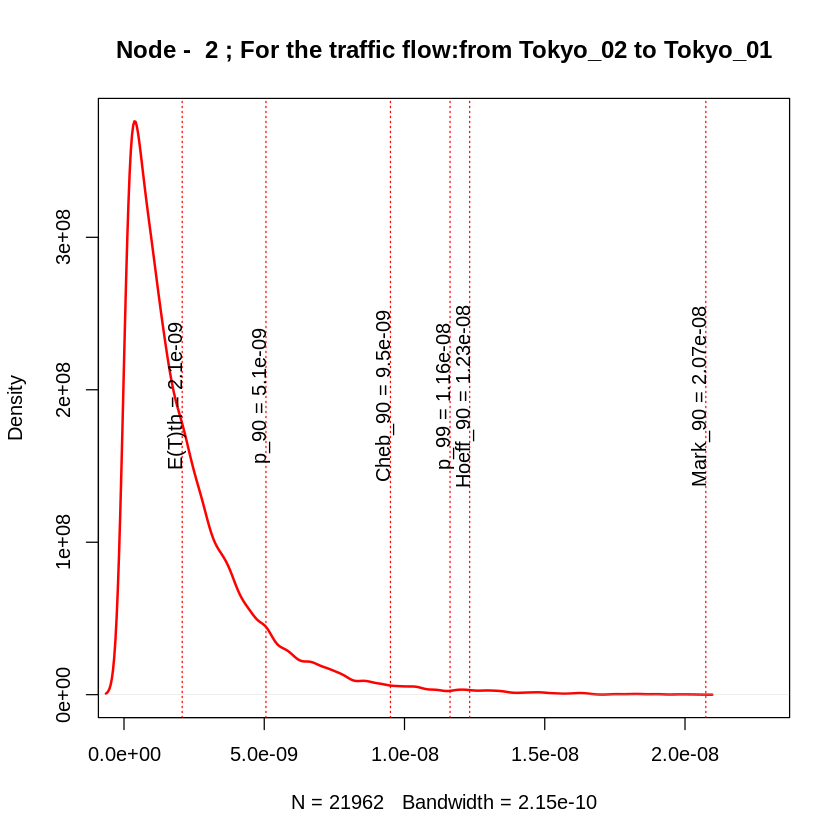

[1] 3
[1] "node_3"
[1] 890977033
[1] 0.5483716
[1] 384480661
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "traffic_Tokyo_03_Tokyo_01_"
[1] 3
[1] "Node -  3 :"
[1] "variance= 6.15126331594592e-18"
[1] "sigma2= 2.48017404952675e-09"
[1] "igraph E(T) = 2.4851479663032e-09"
[1] "simmer E(T) = 2.4754857278684e-09"


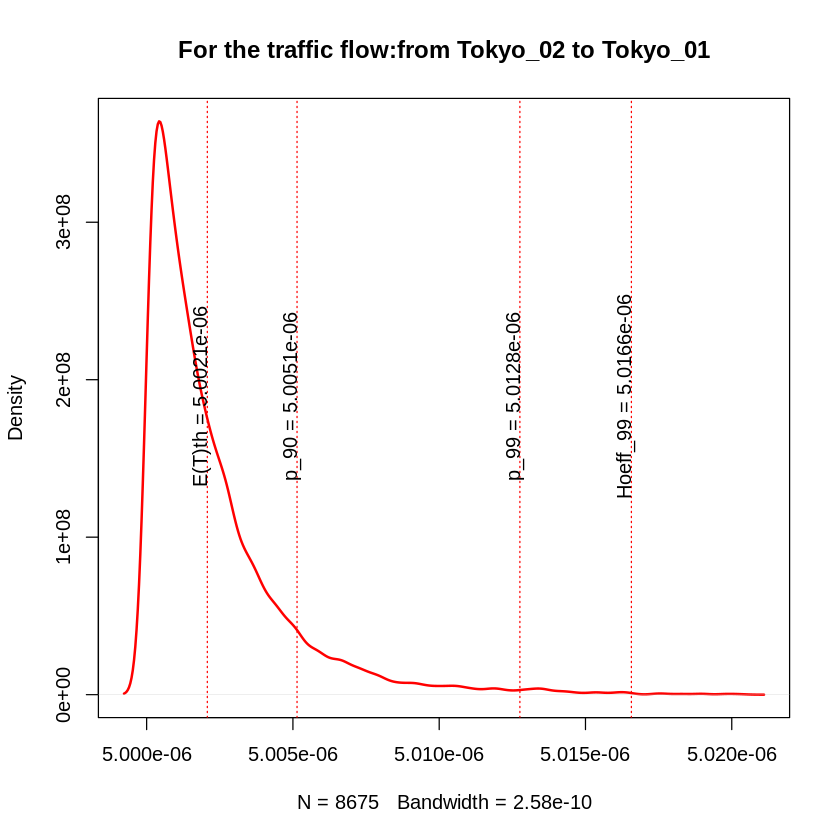

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "variance= 6.18291321367623e-18"
[1] "sigma2= 2.48654644309657e-09"
[1] "igraph E(T) = 5.0024851479663e-06"
[1] "simmer E(T) = 5.00246593551951e-06"


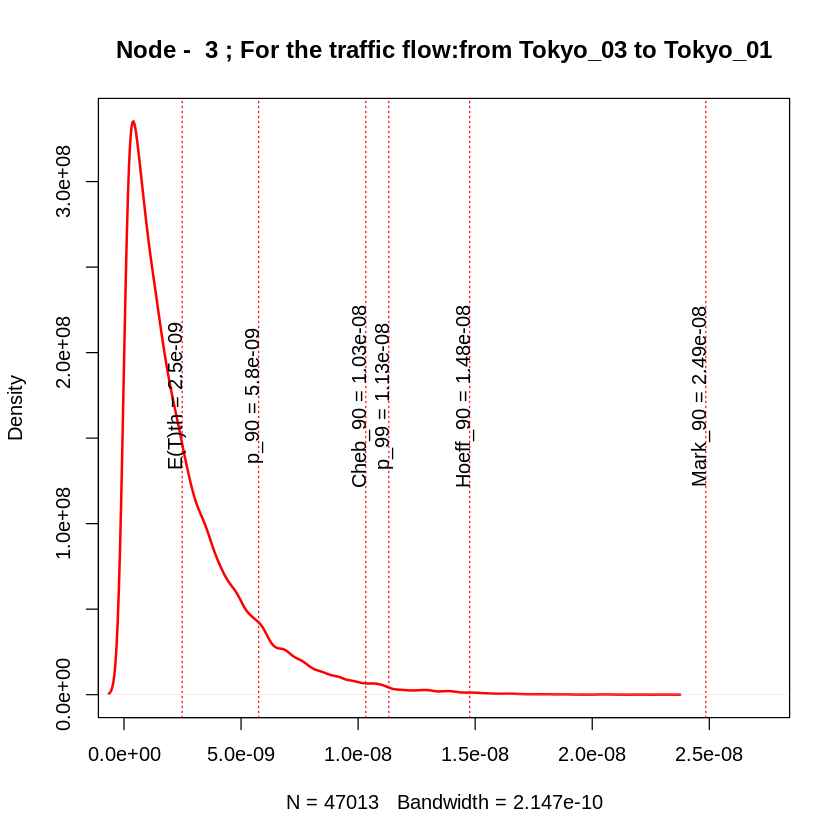

[1] 4
[1] "no info of traffic"
[1] 0.000000e+00 5.002260e-06 5.002466e-06 0.000000e+00
[1] 5
[1] "no info of traffic"
[1] 0.000000e+00 5.002260e-06 5.002466e-06 0.000000e+00 0.000000e+00
[1] 6
[1] "node_6"
[1] 2525132270
[1] 0.4221433
[1] 708859239
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "traffic_Tokyo_06_Tokyo_01_"
[1] 6
[1] "Node -  6 :"
[1] "variance= 4.98459807442846e-19"
[1] "sigma2= 7.06016860593886e-10"
[1] "igraph E(T) = 6.85323648411598e-10"
[1] "simmer E(T) = 7.02804329799435e-10"


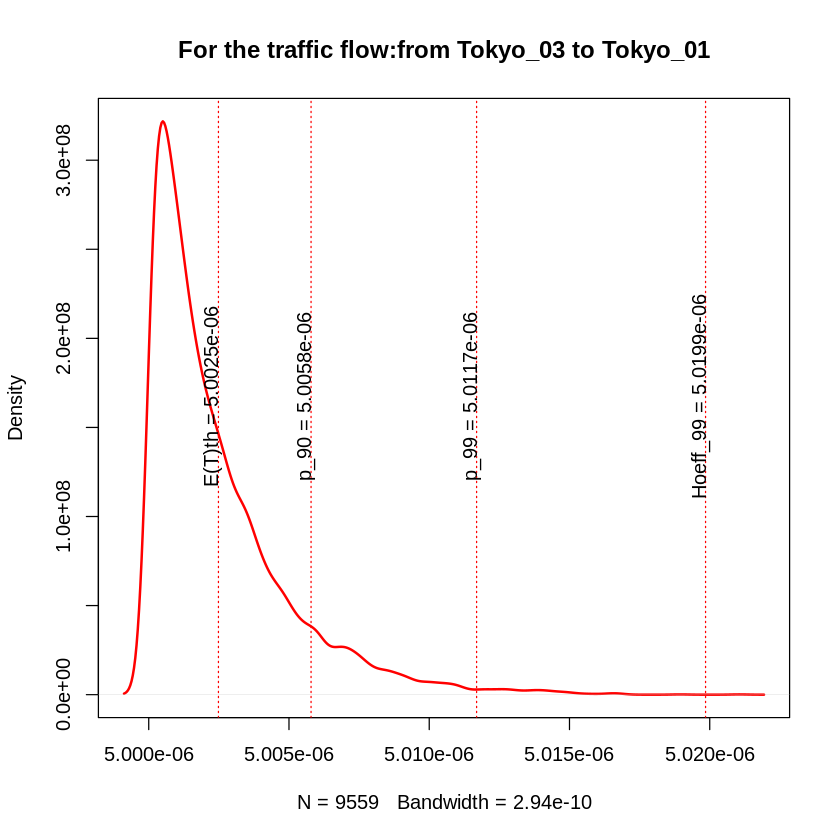

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "variance= 4.95275485495526e-19"
[1] "sigma2= 7.03758115758196e-10"
[1] "igraph E(T) = 4.00068532364841e-06"
[1] "simmer E(T) = 4.00070255955867e-06"


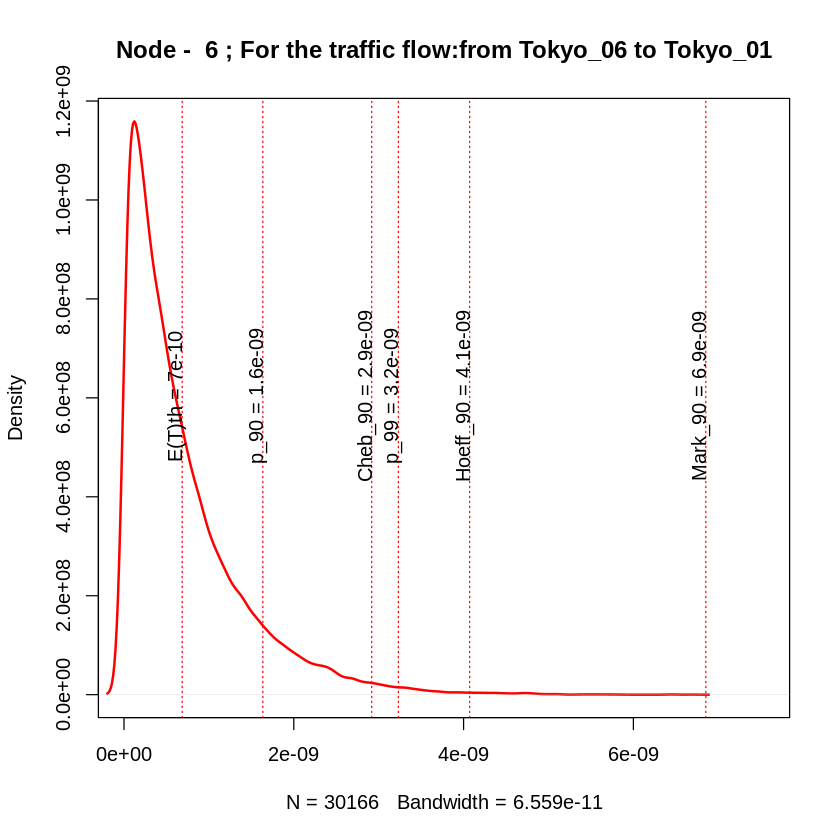

[1] 7
[1] "node_7"
[1] 1667311091
[1] 0.4251512
[1] 511108917
[1] "node_6"
[1] 2525132270
[1] 0.4221433
[1] 868217358
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_07->Tokyo_06
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "traffic_Tokyo_07_Tokyo_01_"
[1] 7
[1] "Node -  7 :"
[1] "variance= 1.09811186974572e-18"
[1] "sigma2= 1.04790833079316e-09"
[1] "igraph E(T) = 1.04334922898788e-09"
[1] "simmer E(T) = 1.0494533246145e-09"


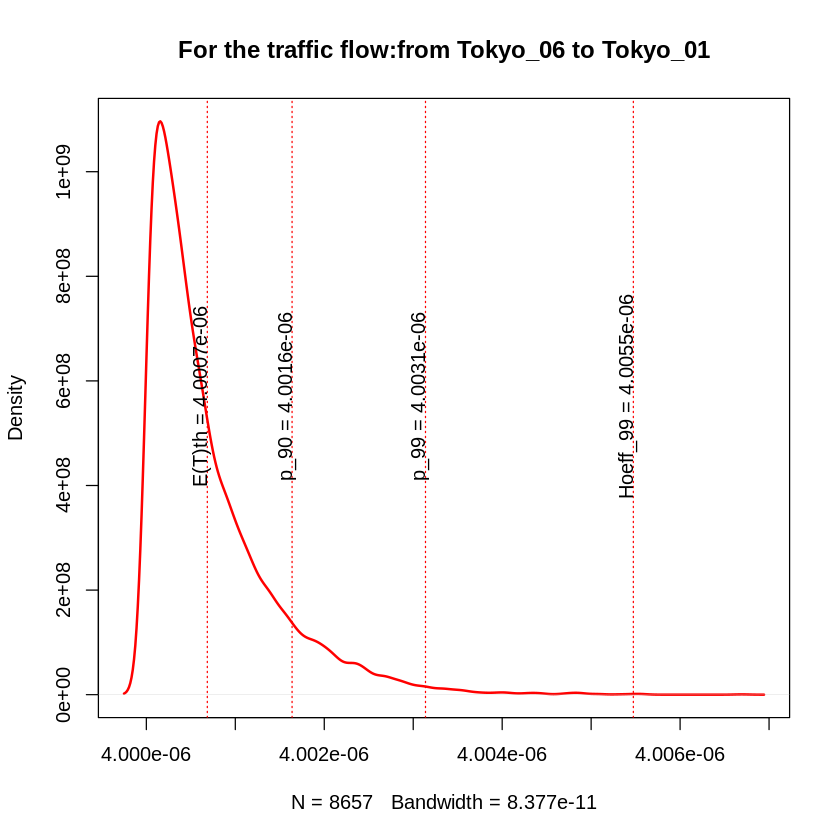

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_07->Tokyo_06
[1] 6
[1] "Node -  6 :"
[1] "variance= 4.96362682329053e-19"
[1] "sigma2= 7.04530114565057e-10"
[1] "igraph E(T) = 6.85323648411598e-10"
[1] "simmer E(T) = 6.93608189453636e-10"


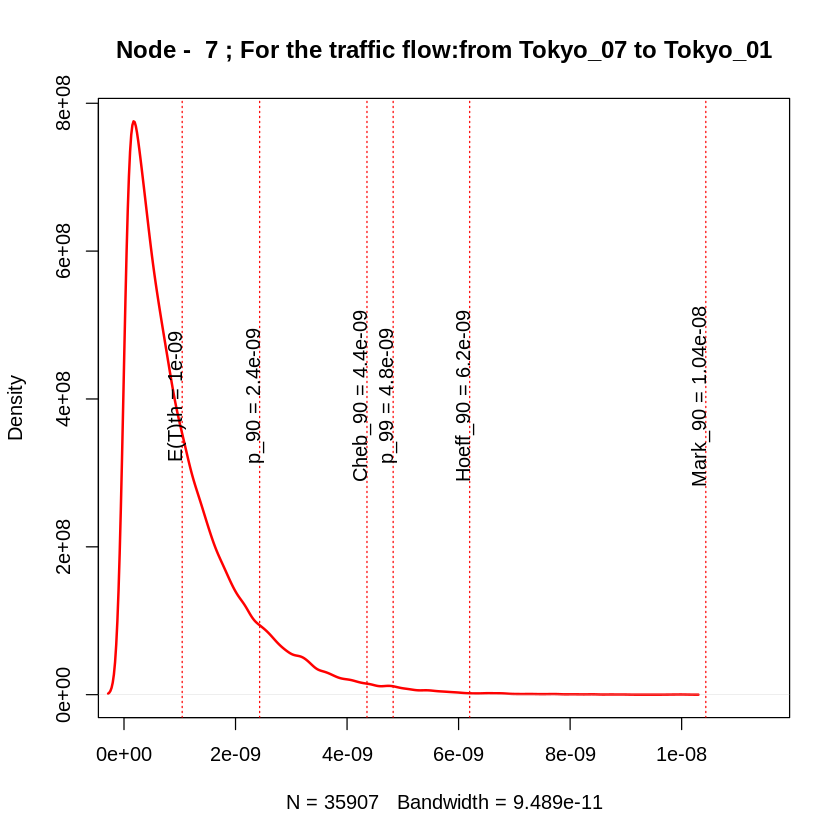

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "variance= 1.50297829538559e-18"
[1] "sigma2= 1.22596015244607e-09"
[1] "igraph E(T) = 8.0017286728774e-06"
[1] "simmer E(T) = 8.0017253842483e-06"


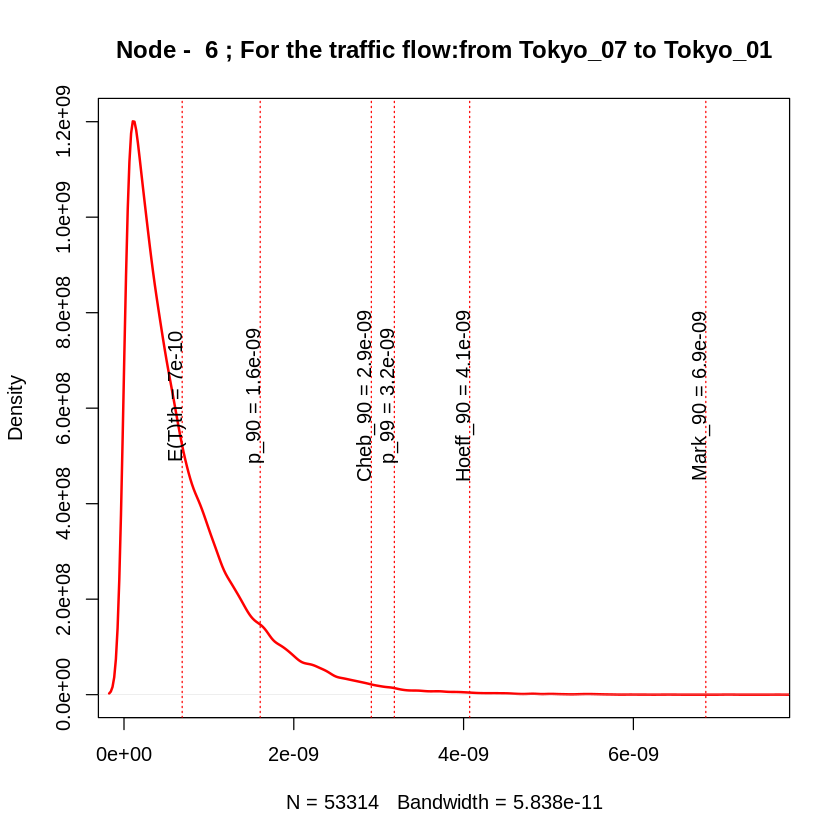

[1] 8
[1] "node_2"
[1] 1086357385
[1] 0.5562125
[1] 277683298
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_08->Tokyo_02
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_02->Tokyo_01
[1] "traffic_Tokyo_08_Tokyo_01_"
[1] 8
[1] "Node -  8 :"
[1] "variance= 7.19403182040976e-18"
[1] "sigma2= 2.68216923783899e-09"
[1] "igraph E(T) = 2.62710308807949e-09"
[1] "simmer E(T) = 2.66086429699179e-09"


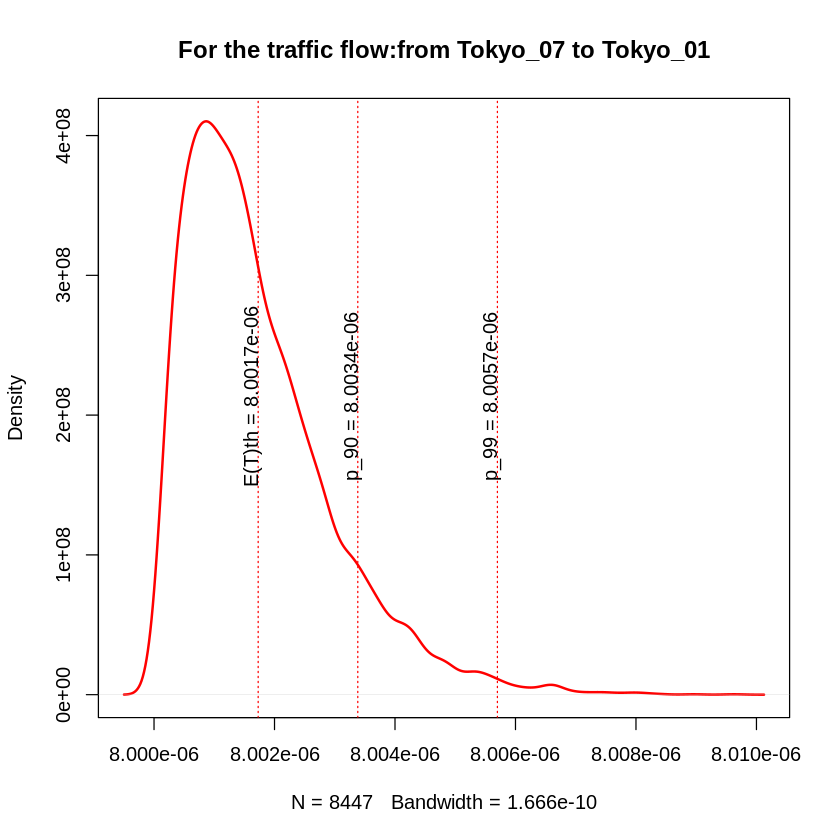

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_08->Tokyo_02
[1] 2
[1] "Node -  2 :"
[1] "variance= 4.27074398675428e-18"
[1] "sigma2= 2.06657784434903e-09"
[1] "igraph E(T) = 2.07420757853372e-09"
[1] "simmer E(T) = 2.04491172861316e-09"


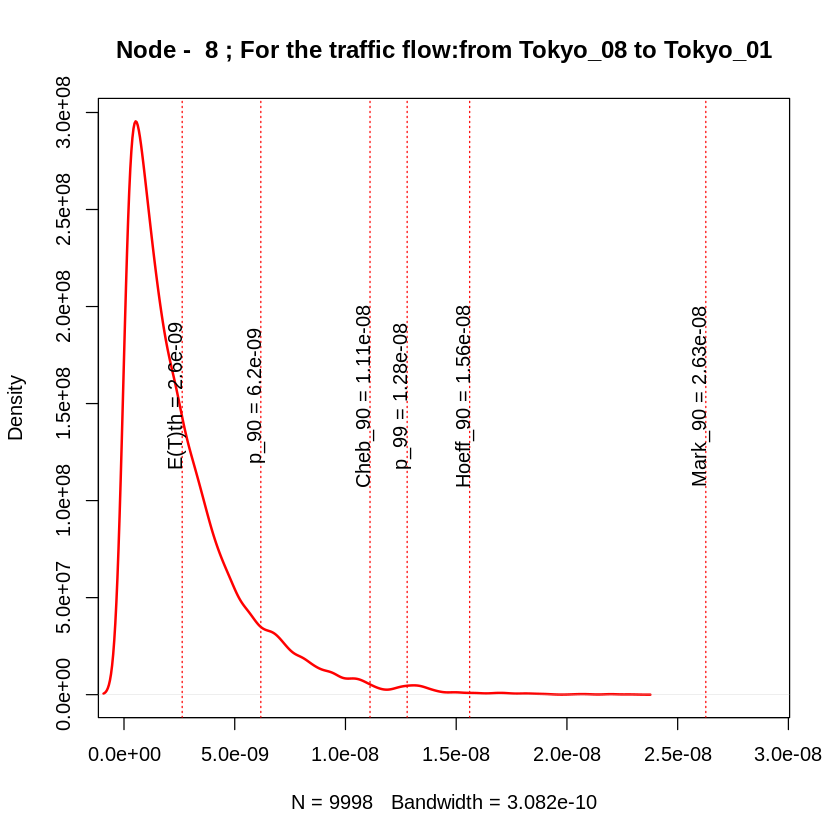

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_02->Tokyo_01
[1] "variance= 1.18209205208032e-17"
[1] "sigma2= 3.43815655850678e-09"
[1] "igraph E(T) = 1.00047013106666e-05"
[1] "simmer E(T) = 1.00047669035212e-05"


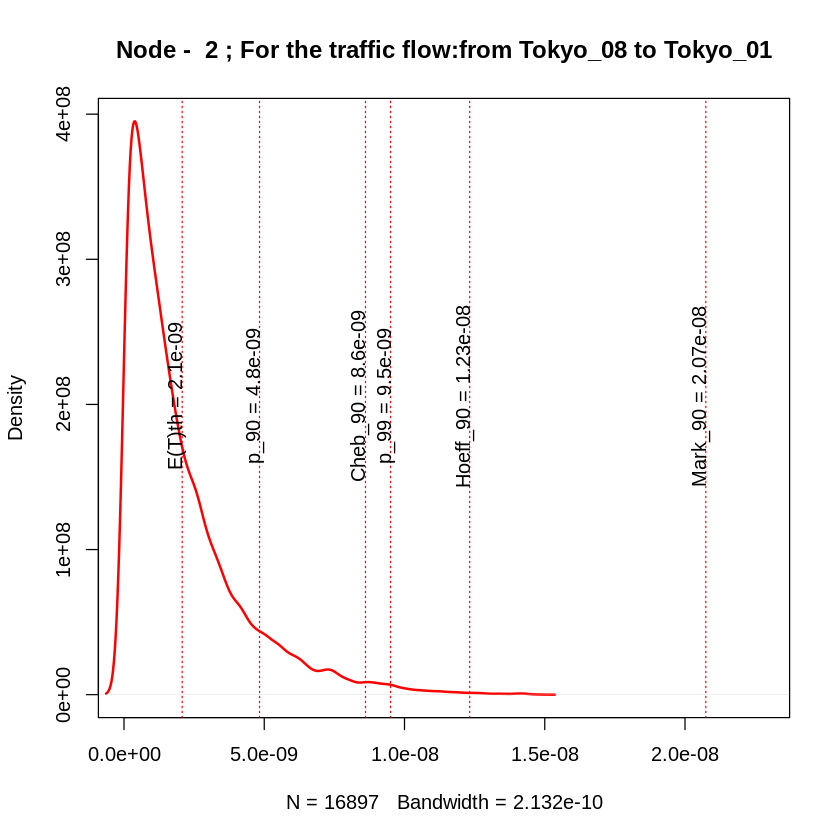

[1] 9
[1] "node_9"
[1] 833781710
[1] 0.4611287
[1] 330091704
[1] "node_3"
[1] 890977033
[1] 0.5483716
[1] 434197550
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_09->Tokyo_03
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "traffic_Tokyo_09_Tokyo_01_"
[1] 9
[1] "Node -  9 :"
[1] "variance= 4.98174100023931e-18"
[1] "sigma2= 2.2319814067862e-09"
[1] "igraph E(T) = 2.22567919971813e-09"
[1] "simmer E(T) = 2.23088669327471e-09"


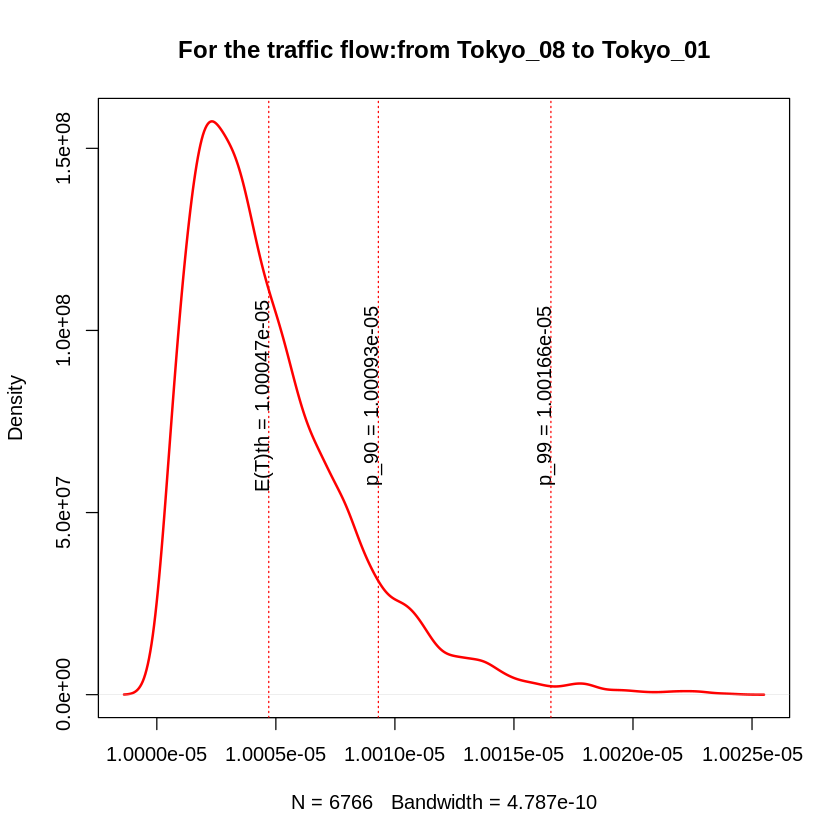

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_09->Tokyo_03
[1] 3
[1] "Node -  3 :"
[1] "variance= 6.27154160201362e-18"
[1] "sigma2= 2.50430461446159e-09"
[1] "igraph E(T) = 2.4851479663032e-09"
[1] "simmer E(T) = 2.49229505096132e-09"


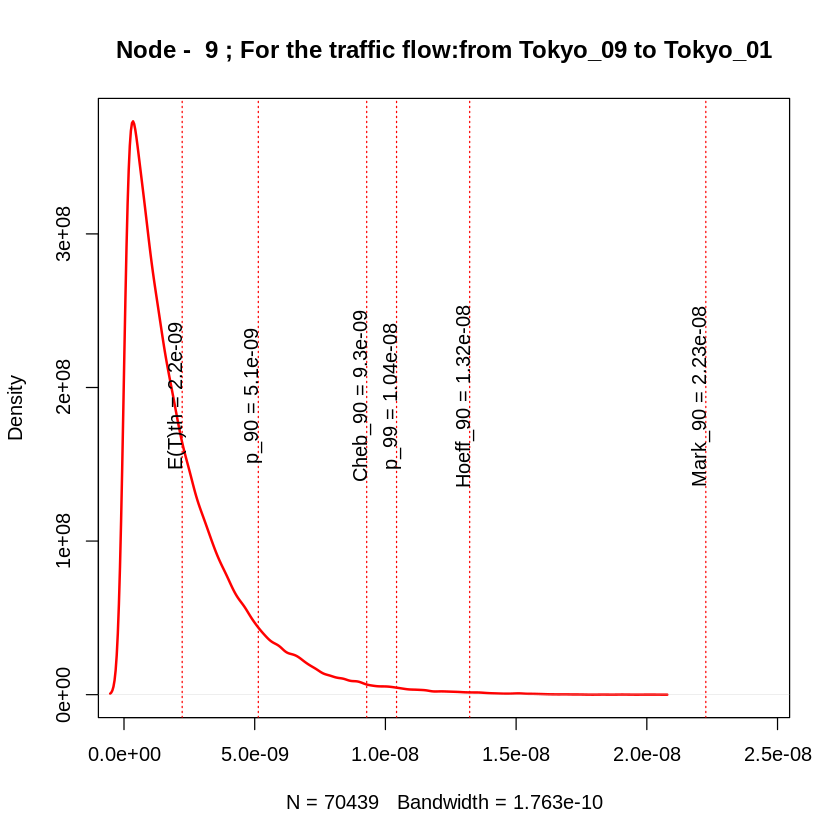

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "variance= 1.16621946149107e-17"
[1] "sigma2= 3.41499555122854e-09"
[1] "igraph E(T) = 1.0004710827166e-05"
[1] "simmer E(T) = 1.00047833499193e-05"


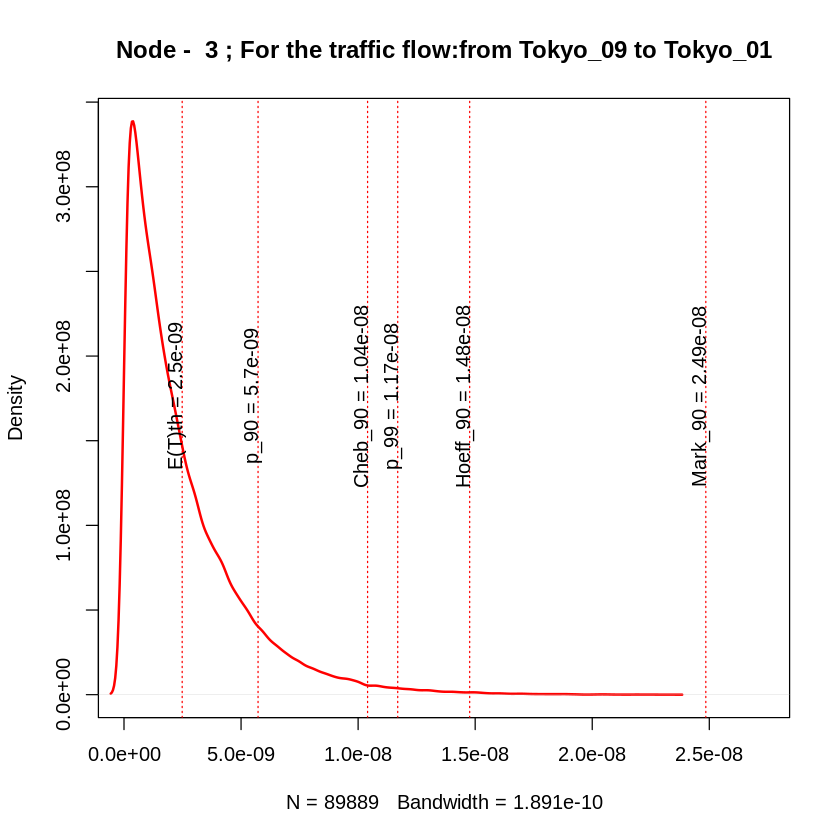

[1] 10
[1] "node_13"
[1] 1480814458
[1] 0.4921388
[1] 380011727
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_10->Tokyo_13
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "traffic_Tokyo_10_Tokyo_04_"
[1] 10
[1] "Node -  10 :"
[1] "variance= 1.57265010834779e-17"
[1] "sigma2= 3.9656652762781e-09"
[1] "igraph E(T) = 4.17734518883248e-09"
[1] "simmer E(T) = 4.08428342110628e-09"


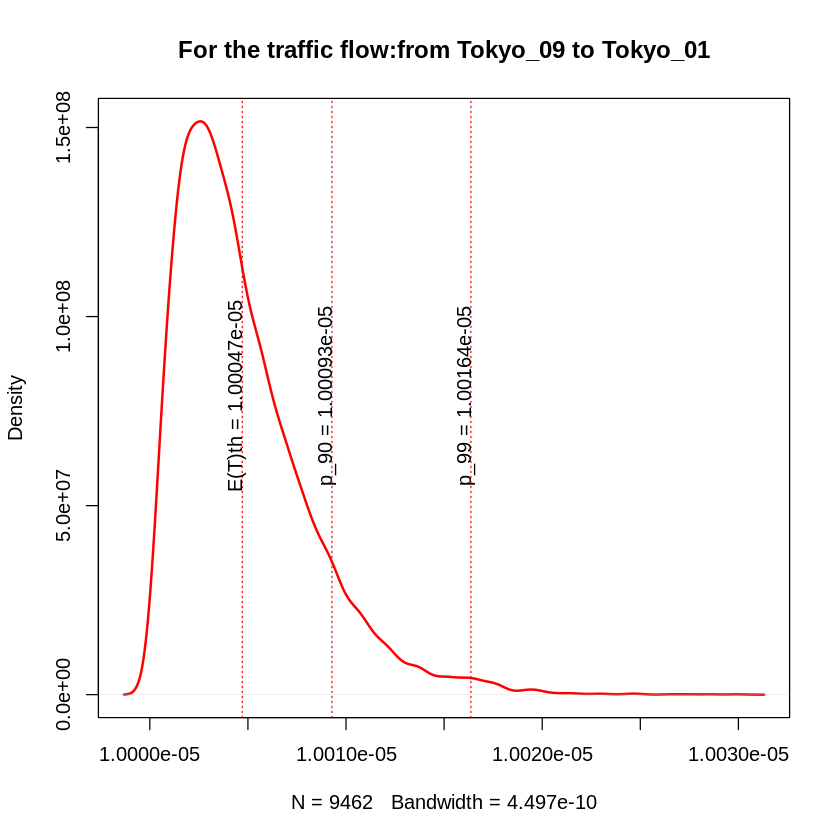

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_10->Tokyo_13
[1] 13
[1] "Node -  13 :"
[1] "variance= 1.79538457357664e-18"
[1] "sigma2= 1.33991961459508e-09"
[1] "igraph E(T) = 1.32970209501376e-09"
[1] "simmer E(T) = 1.28713642629901e-09"


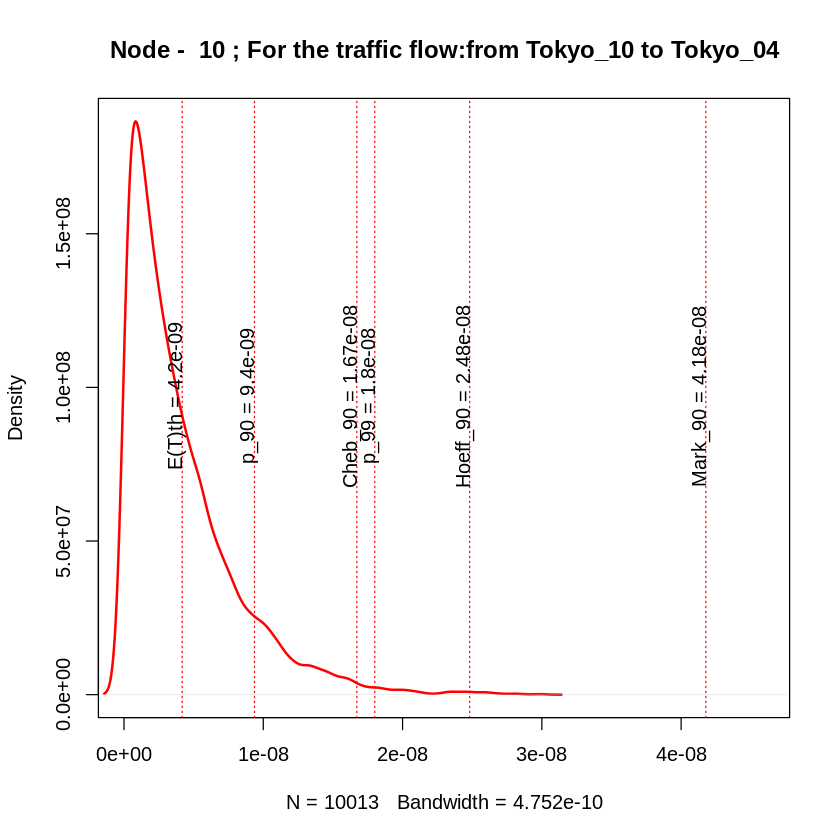

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "variance= 1.78210563660918e-17"
[1] "sigma2= 4.22149930310214e-09"
[1] "igraph E(T) = 8.00550704728385e-06"
[1] "simmer E(T) = 8.00539909899031e-06"


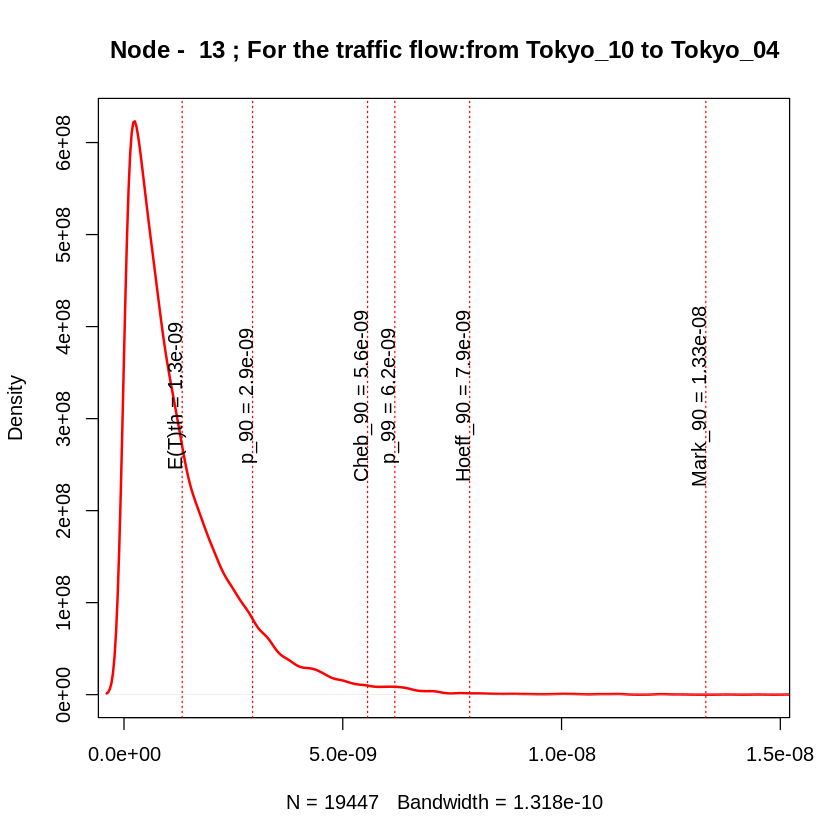

[1] 11
[1] "node_9"
[1] 833781710
[1] 0.4611287
[1] 54388956
[1] "node_3"
[1] 890977033
[1] 0.5483716
[1] 158494801
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_11->Tokyo_09
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_09->Tokyo_03
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "traffic_Tokyo_11_Tokyo_01_"
[1] 11
[1] "Node -  11 :"
[1] "variance= 7.33314219837496e-18"
[1] "sigma2= 2.70797751068486e-09"
[1] "igraph E(T) = 2.76804645222458e-09"
[1] "simmer E(T) = 2.73421151063849e-09"


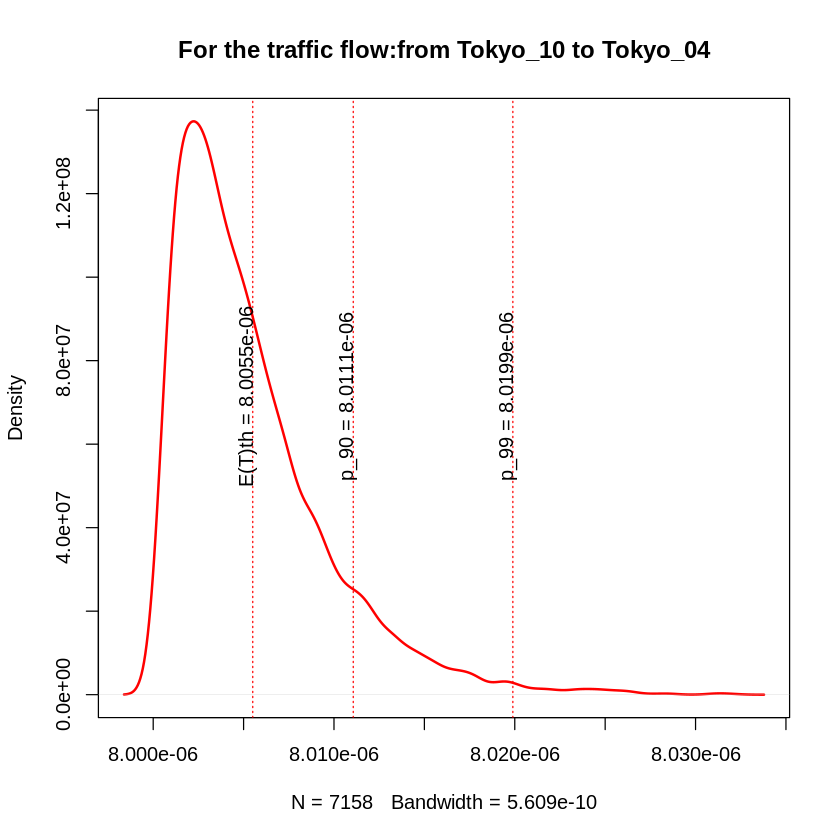

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_11->Tokyo_09
[1] 9
[1] "Node -  9 :"
[1] "variance= 4.37391644044446e-18"
[1] "sigma2= 2.09139103001913e-09"
[1] "igraph E(T) = 2.22567919971813e-09"
[1] "simmer E(T) = 2.11177910669342e-09"


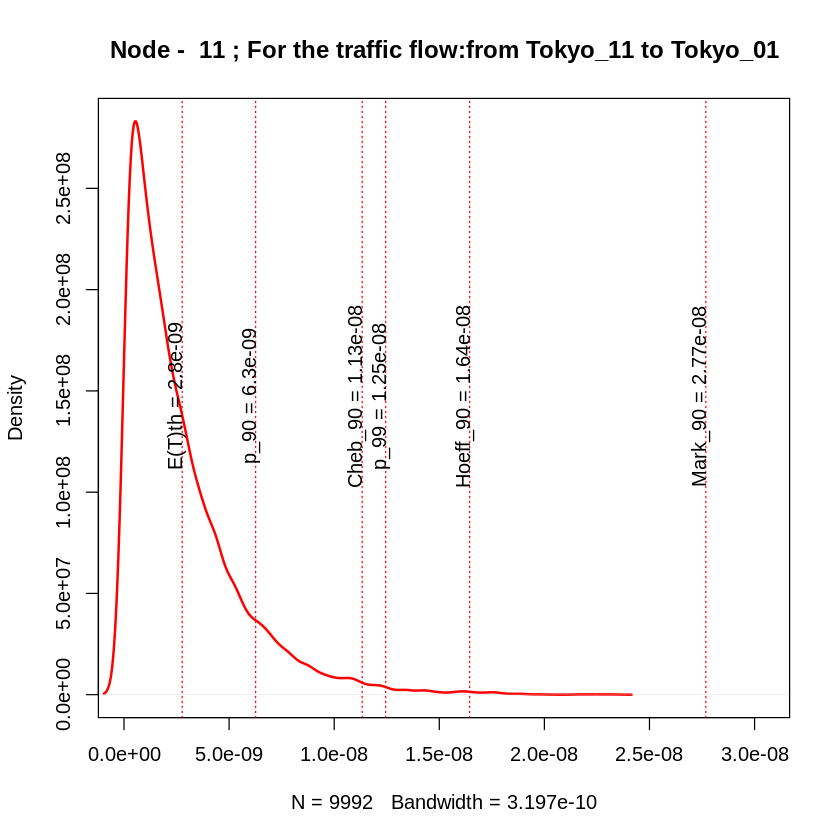

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_09->Tokyo_03
[1] 3
[1] "Node -  3 :"
[1] "variance= 5.85962765802086e-18"
[1] "sigma2= 2.42066677963343e-09"
[1] "igraph E(T) = 2.4851479663032e-09"
[1] "simmer E(T) = 2.36425983497876e-09"


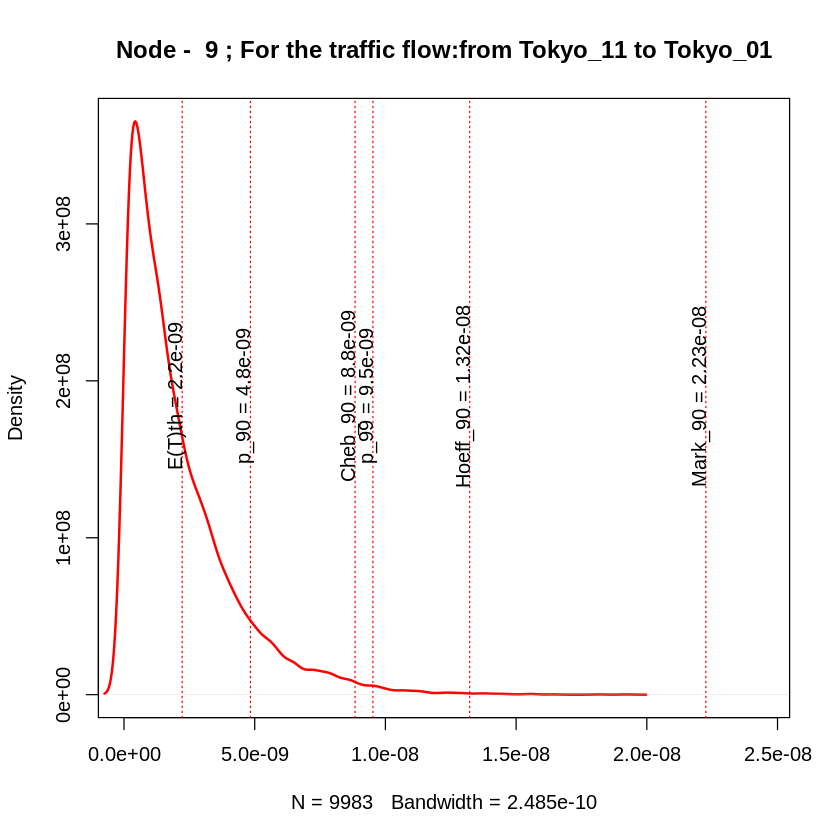

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "variance= 1.7723128212378e-17"
[1] "sigma2= 4.20988458421107e-09"
[1] "igraph E(T) = 1.50074788736182e-05"
[1] "simmer E(T) = 1.50073894734855e-05"


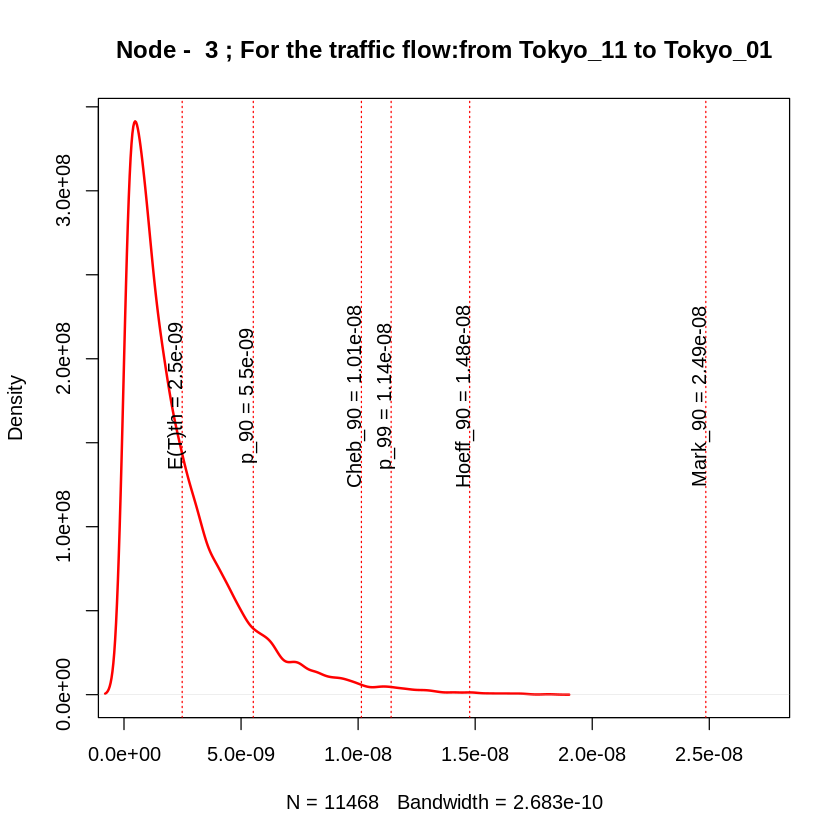

[1] 12
[1] "node_13"
[1] 1480814458
[1] 0.4921388
[1] 660132625
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_12->Tokyo_13
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "traffic_Tokyo_12_Tokyo_04_"
[1] 12
[1] "Node -  12 :"
[1] "variance= 1.08797264361113e-16"
[1] "sigma2= 1.04305927137969e-08"
[1] "igraph E(T) = 1.01179763380594e-08"
[1] "simmer E(T) = 1.02693726339491e-08"


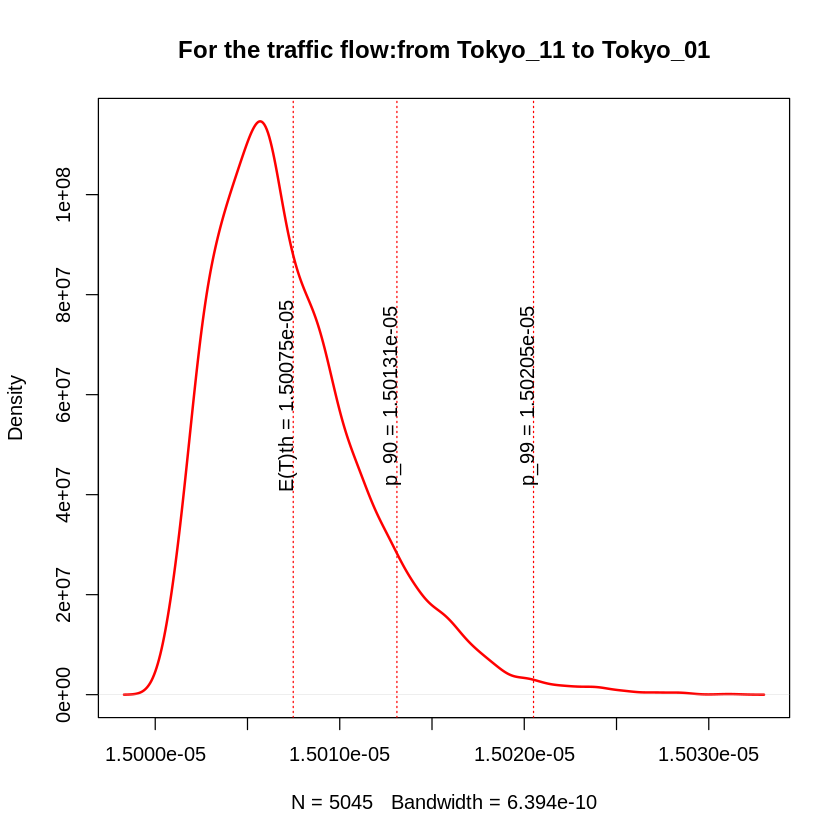

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_12->Tokyo_13
[1] 13
[1] "Node -  13 :"
[1] "variance= 1.80213674975973e-18"
[1] "sigma2= 1.34243686993457e-09"
[1] "igraph E(T) = 1.32970209501376e-09"
[1] "simmer E(T) = 1.33366813933006e-09"


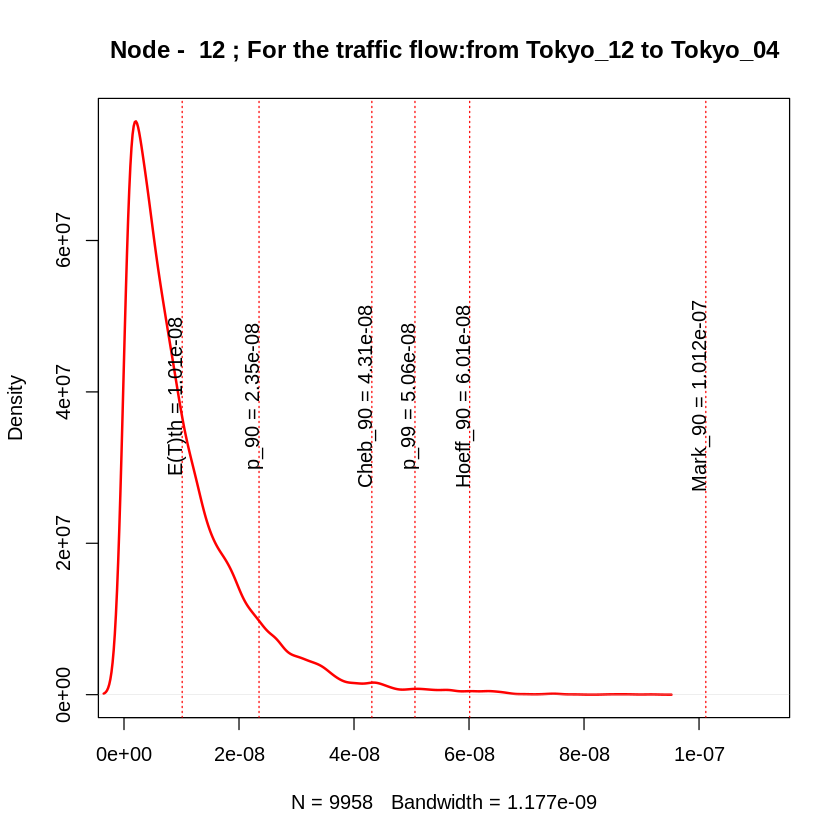

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "variance= 1.1110489872591e-16"
[1] "sigma2= 1.05406308504714e-08"
[1] "igraph E(T) = 8.01144767843307e-06"
[1] "simmer E(T) = 8.01161871646859e-06"


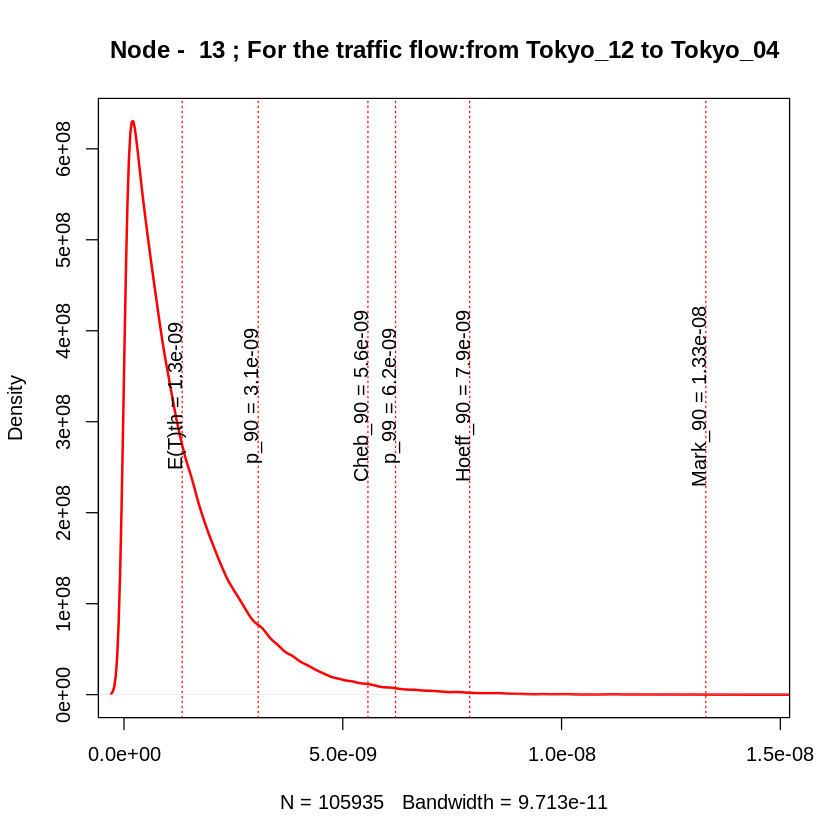

[1] 13
[1] "node_13"
[1] 1480814458
[1] 0.4921388
[1] 417388264
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "traffic_Tokyo_13_Tokyo_04_"
[1] 13
[1] "Node -  13 :"
[1] "variance= 1.82679072463177e-18"
[1] "sigma2= 1.3515882230294e-09"
[1] "igraph E(T) = 1.32970209501376e-09"
[1] "simmer E(T) = 1.33720316636263e-09"


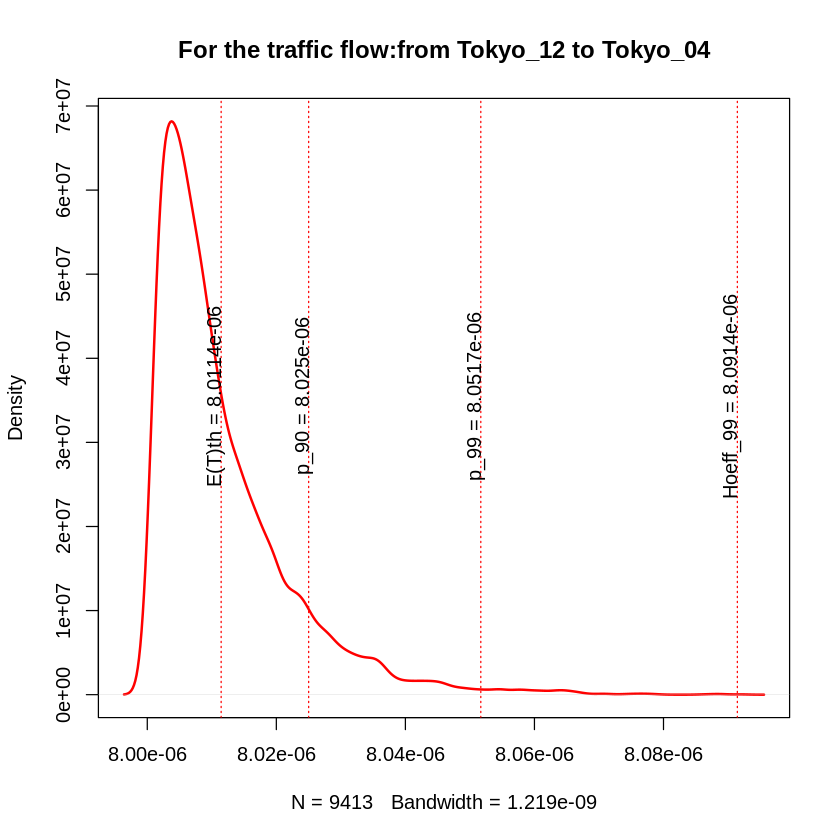

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "variance= 1.75113328304166e-18"
[1] "sigma2= 1.32330392693503e-09"
[1] "igraph E(T) = 4.00132970209501e-06"
[1] "simmer E(T) = 4.00133045043394e-06"


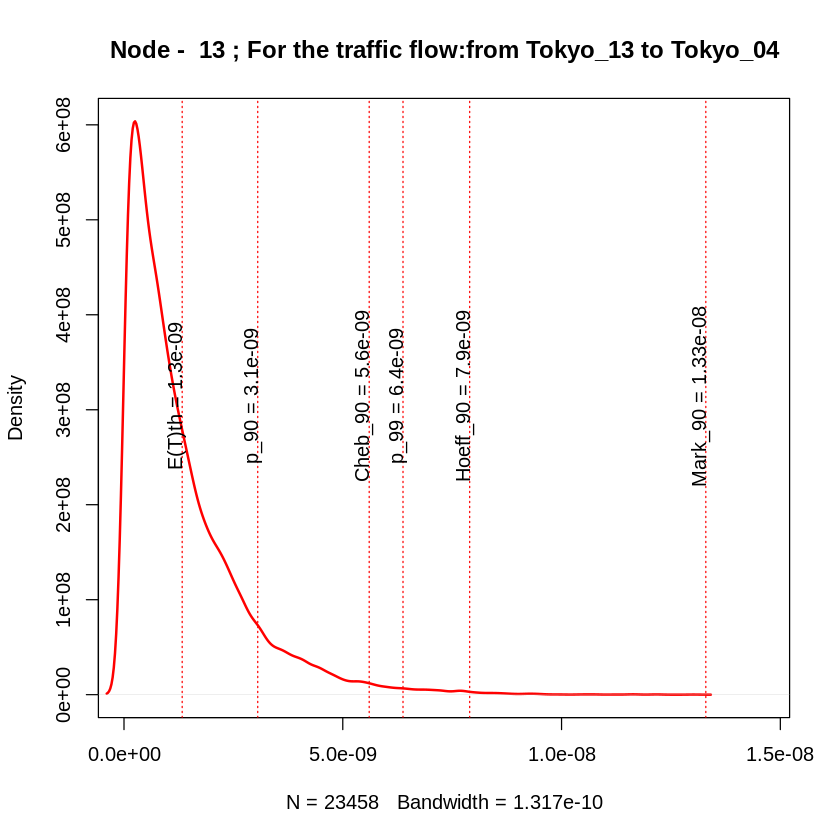

[1] 14
[1] "node_14"
[1] 1702777664
[1] 0.4760329
[1] 455907427
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "traffic_Tokyo_14_Tokyo_04_"
[1] 14
[1] "Node -  14 :"
[1] "variance= 1.28302534147133e-18"
[1] "sigma2= 1.13270708546885e-09"
[1] "igraph E(T) = 1.12082568595555e-09"
[1] "simmer E(T) = 1.12026052937391e-09"


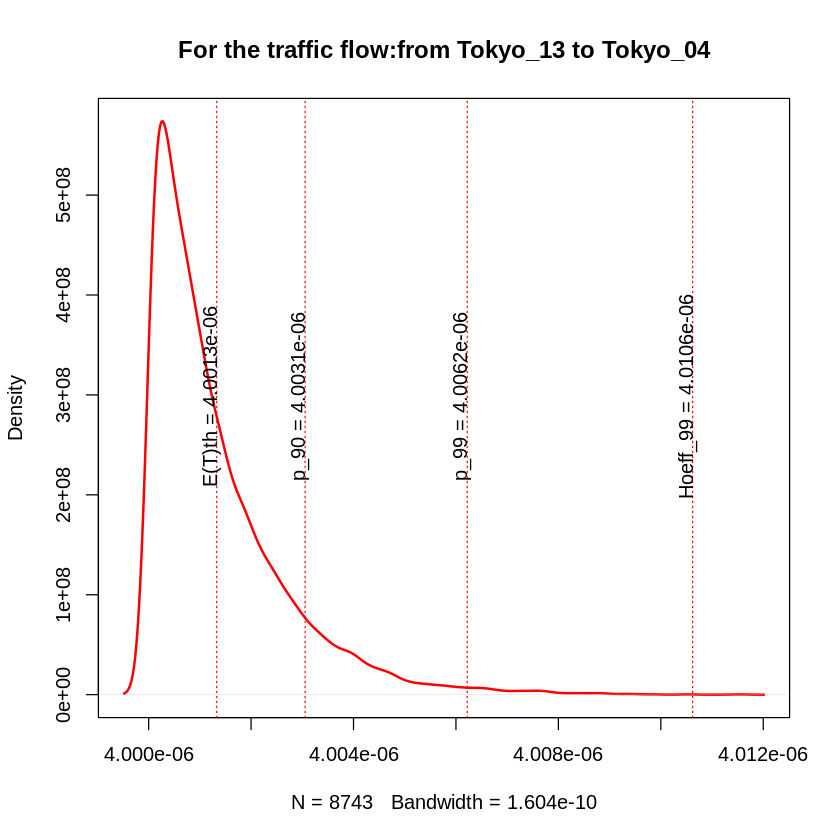

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "variance= 1.32208701944125e-18"
[1] "sigma2= 1.14982042921547e-09"
[1] "igraph E(T) = 3.00112082568596e-06"
[1] "simmer E(T) = 3.00113708939895e-06"


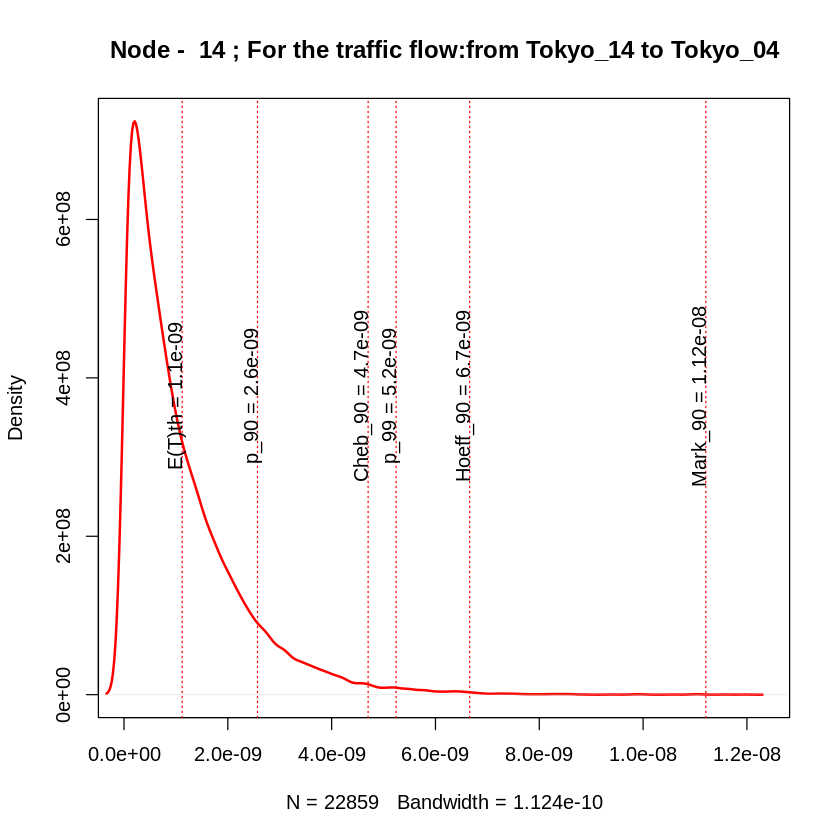

[1] 15
[1] "node_14"
[1] 1702777664
[1] 0.4760329
[1] 696315755
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_15->Tokyo_14
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "traffic_Tokyo_15_Tokyo_04_"
[1] 15
[1] "Node -  15 :"
[1] "variance= 1.01446439132484e-16"
[1] "sigma2= 1.00720623078138e-08"
[1] "igraph E(T) = 1.00313896951546e-08"
[1] "simmer E(T) = 1.00467651148896e-08"


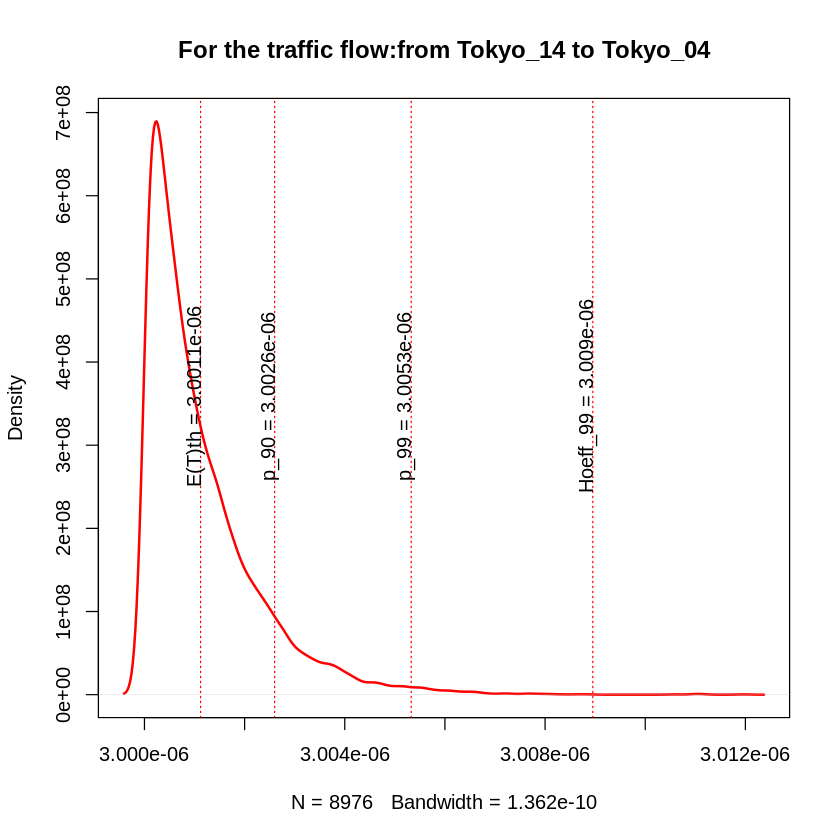

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_15->Tokyo_14
[1] 14
[1] "Node -  14 :"
[1] "variance= 1.22922329321949e-18"
[1] "sigma2= 1.10870342888416e-09"
[1] "igraph E(T) = 1.12082568595555e-09"
[1] "simmer E(T) = 1.11279831606872e-09"


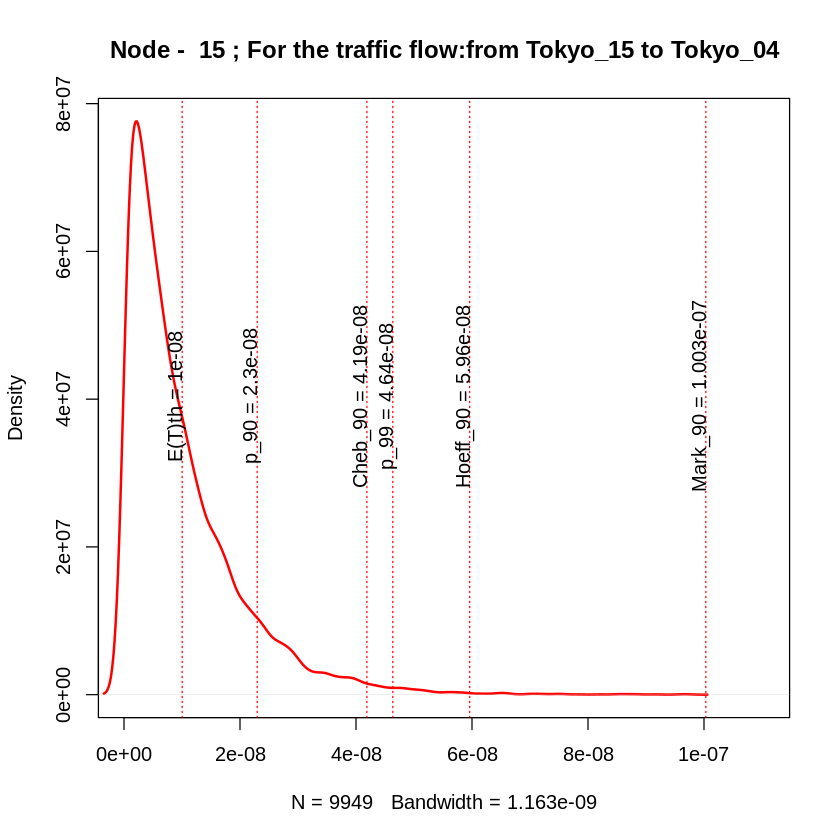

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "variance= 1.04869065845064e-16"
[1] "sigma2= 1.02405598404122e-08"
[1] "igraph E(T) = 6.01115221538111e-06"
[1] "simmer E(T) = 6.01125516474116e-06"


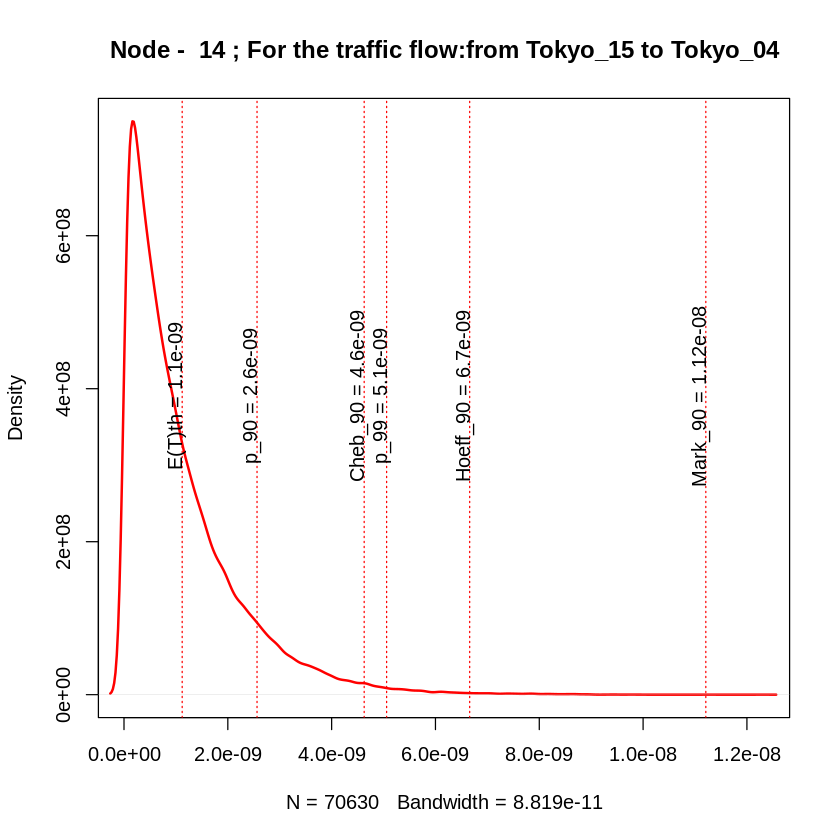

[1] 16
[1] "node_16"
[1] 1543583821
[1] 0.5600998
[1] 631897089
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "traffic_Tokyo_16_Tokyo_04_"
[1] 16
[1] "Node -  16 :"
[1] "variance= 2.26073911491463e-18"
[1] "sigma2= 1.50357544370565e-09"
[1] "igraph E(T) = 1.472704459217e-09"
[1] "simmer E(T) = 1.48721477703565e-09"


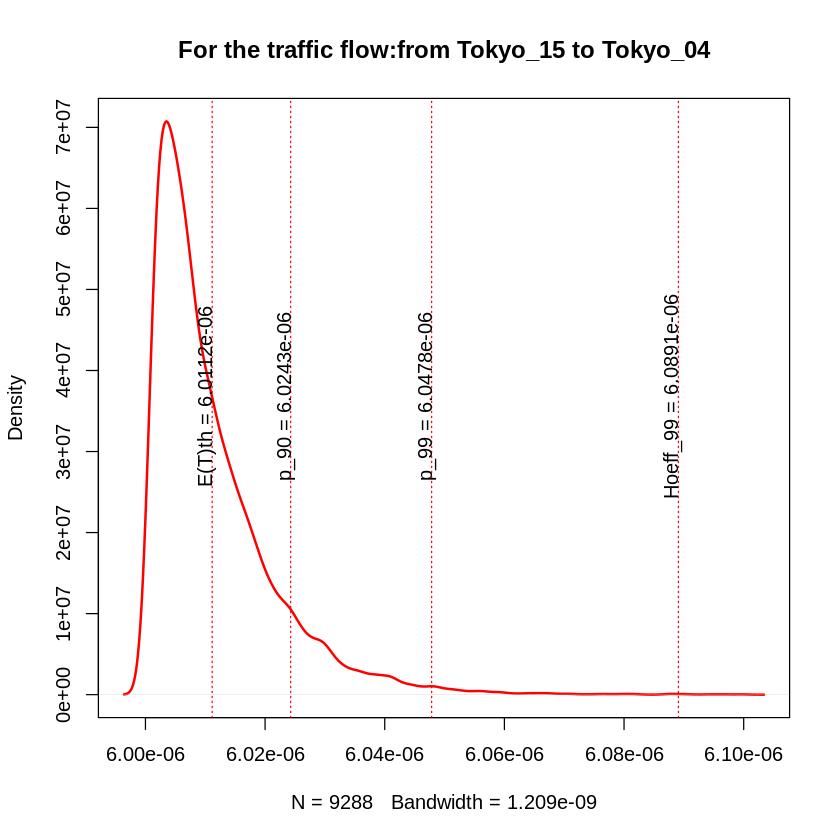

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "variance= 2.22468783973306e-18"
[1] "sigma2= 1.49153874898812e-09"
[1] "igraph E(T) = 3.00147270445922e-06"
[1] "simmer E(T) = 3.00148592596798e-06"


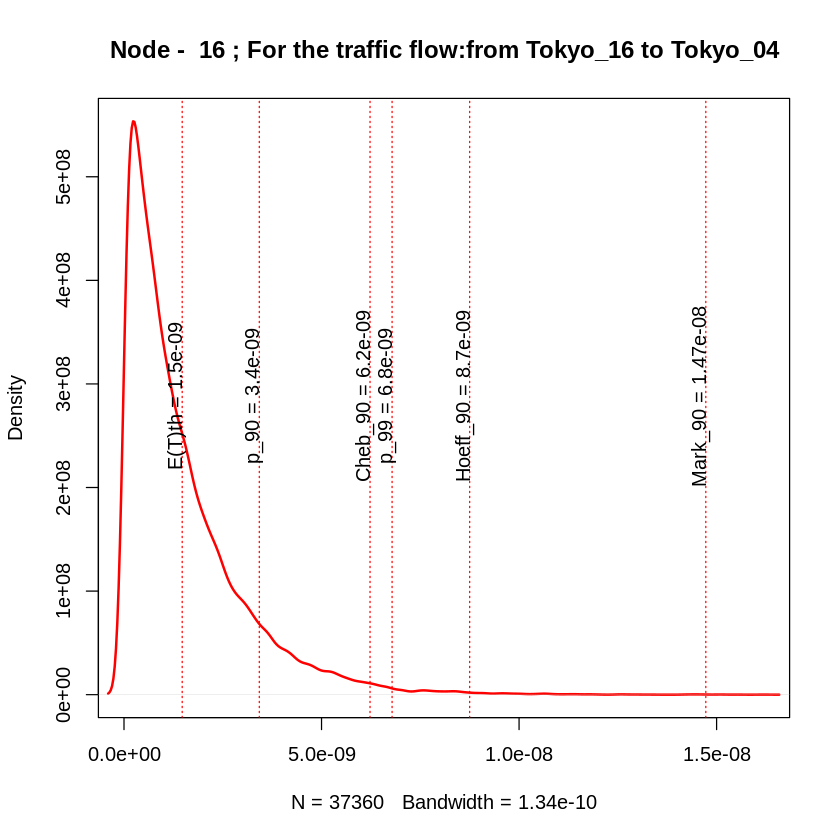

[1] 17
[1] "node_16"
[1] 1543583821
[1] 0.5600998
[1] 630957597
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_17->Tokyo_16
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "traffic_Tokyo_17_Tokyo_04_"
[1] 17
[1] "Node -  17 :"
[1] "variance= 3.95345314914407e-17"
[1] "sigma2= 6.28764912279945e-09"
[1] "igraph E(T) = 7.08139234172504e-09"
[1] "simmer E(T) = 6.59877787072774e-09"


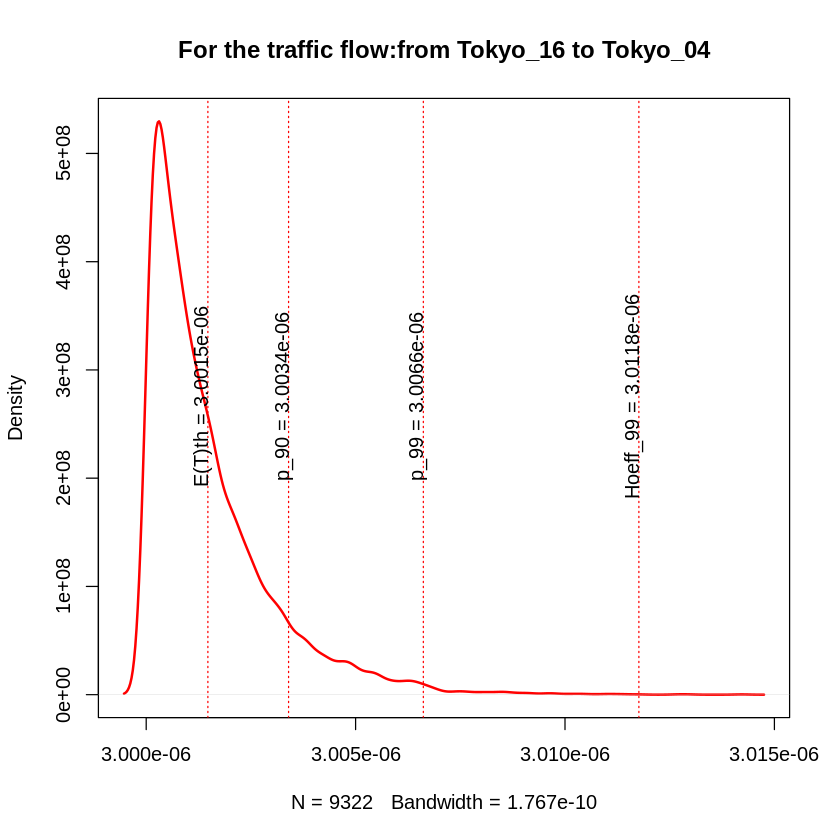

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_17->Tokyo_16
[1] 16
[1] "Node -  16 :"
[1] "variance= 2.21024768553125e-18"
[1] "sigma2= 1.48669017805703e-09"
[1] "igraph E(T) = 1.472704459217e-09"
[1] "simmer E(T) = 1.4872133354312e-09"


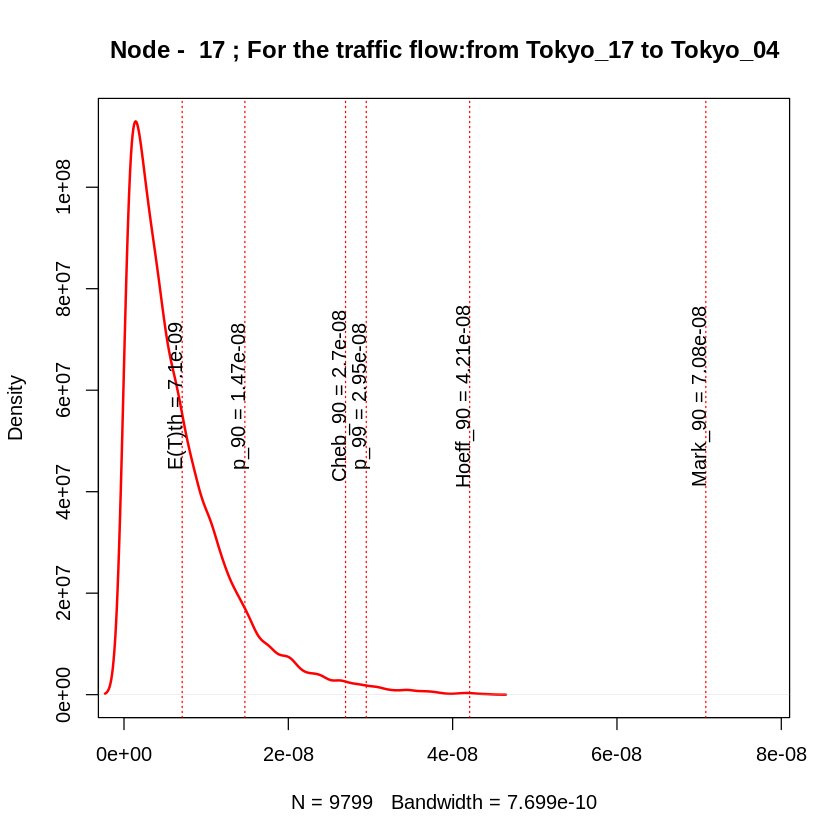

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "variance= 4.20819826452301e-17"
[1] "sigma2= 6.48706271321852e-09"
[1] "igraph E(T) = 5.00855409680094e-06"
[1] "simmer E(T) = 5.00805803519722e-06"


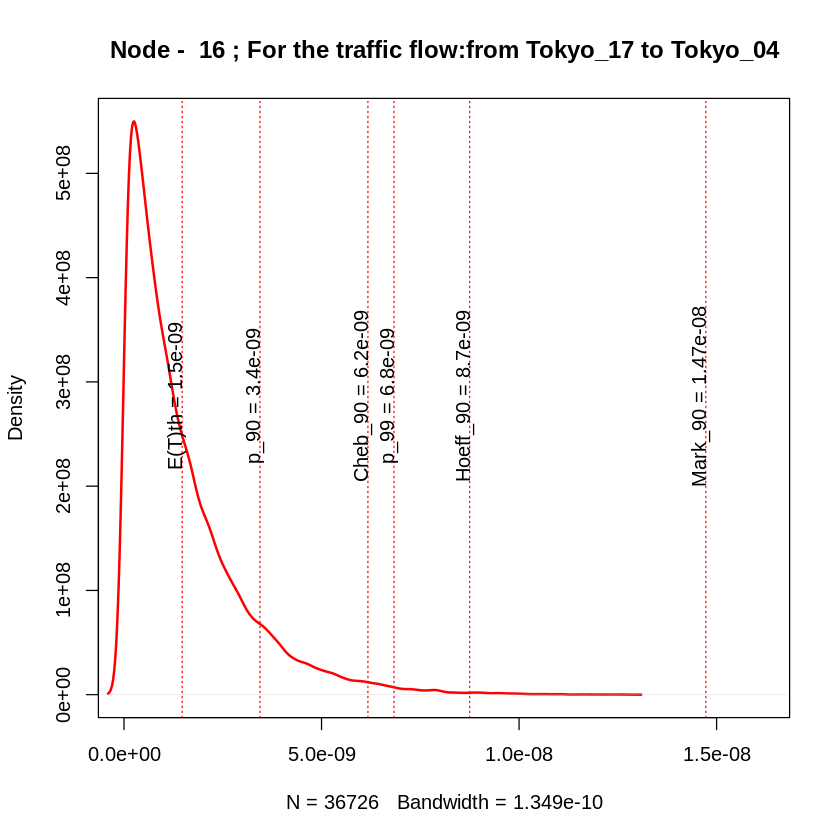

[1] 18
[1] "node_18"
[1] 1113211205
[1] 0.4499837
[1] 104105845
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_18->Tokyo_05
[1] "traffic_Tokyo_18_Tokyo_05_"
[1] 18
[1] "Node -  18 :"
[1] "variance= 3.01537711747001e-18"
[1] "sigma2= 1.73648412531471e-09"
[1] "igraph E(T) = 1.63322809658204e-09"
[1] "simmer E(T) = 1.7040364348374e-09"


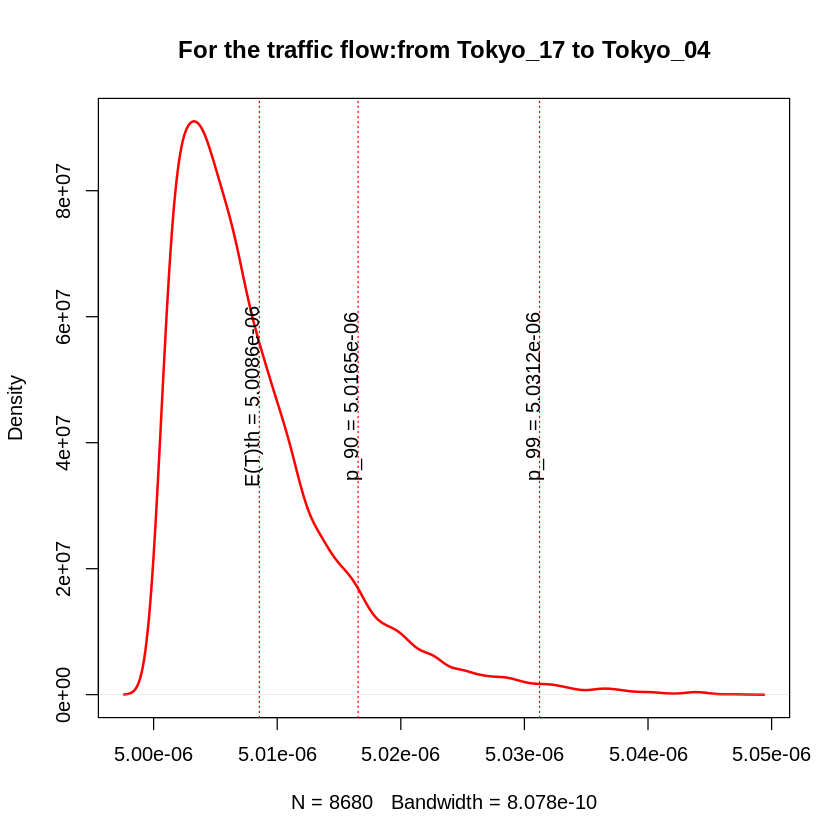

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_18->Tokyo_05
[1] "variance= 2.99527654606442e-18"
[1] "sigma2= 1.73068672672567e-09"
[1] "igraph E(T) = 3.00163322809658e-06"
[1] "simmer E(T) = 3.00171069055814e-06"


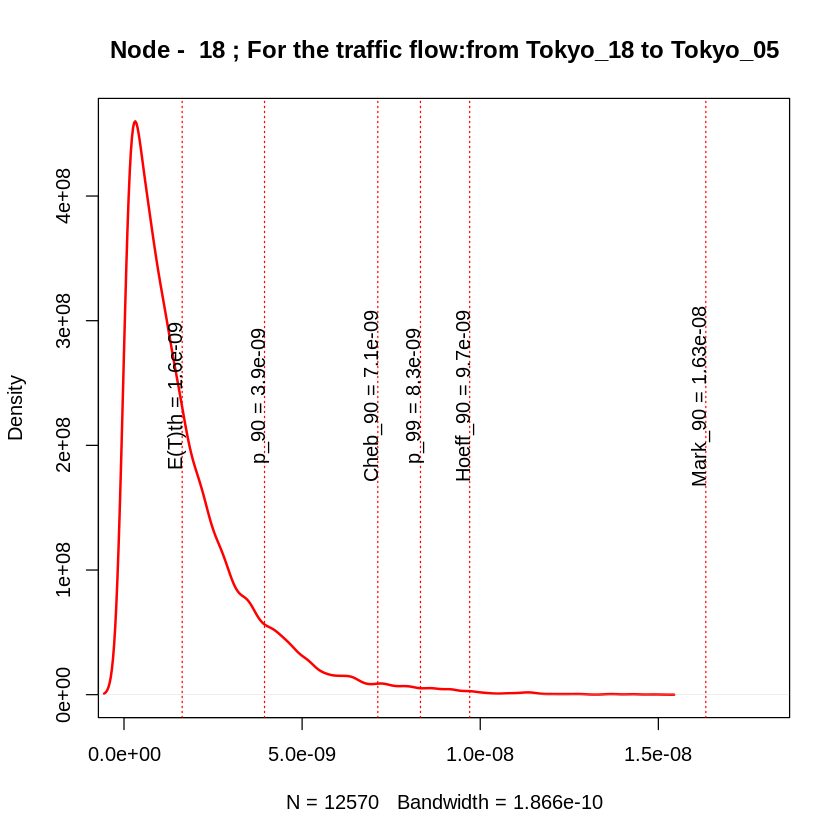

[1] 19
[1] "node_16"
[1] 1543583821
[1] 0.5600998
[1] 466267228
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_19->Tokyo_16
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "traffic_Tokyo_19_Tokyo_04_"
[1] 19
[1] "Node -  19 :"
[1] "variance= 1.62458412313398e-17"
[1] "sigma2= 4.0306130093746e-09"
[1] "igraph E(T) = 4.29227227258381e-09"
[1] "simmer E(T) = 4.0782577799658e-09"


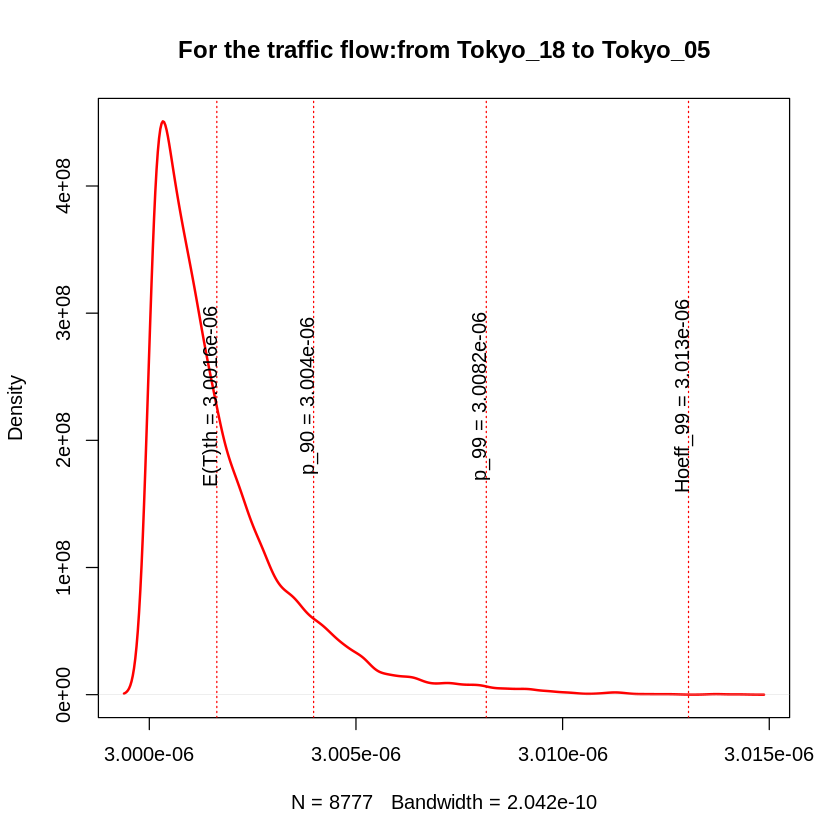

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_19->Tokyo_16
[1] 16
[1] "Node -  16 :"
[1] "variance= 2.30590352769989e-18"
[1] "sigma2= 1.51852017691564e-09"
[1] "igraph E(T) = 1.472704459217e-09"
[1] "simmer E(T) = 1.46545314442308e-09"


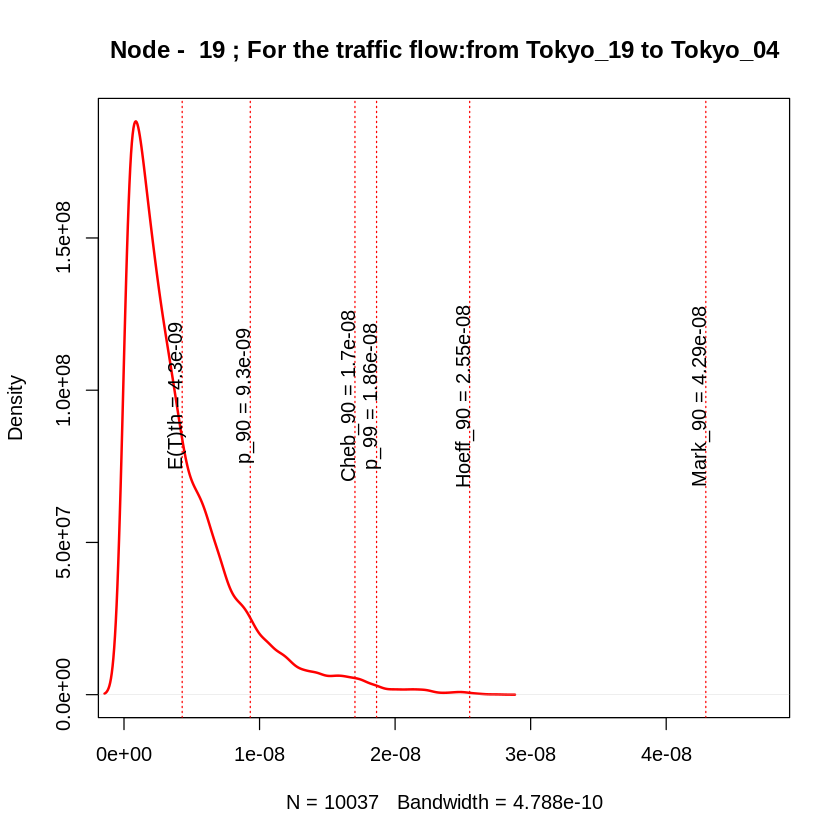

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "variance= 1.87166553414027e-17"
[1] "sigma2= 4.32627499604483e-09"
[1] "igraph E(T) = 5.0057649767318e-06"
[1] "simmer E(T) = 5.00556465288055e-06"


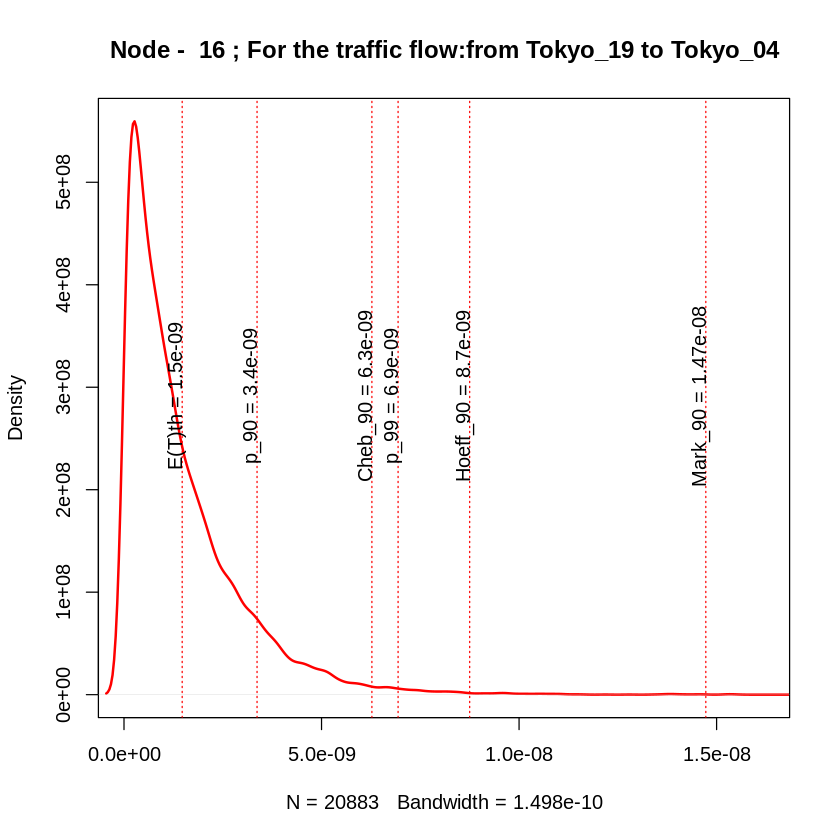

[1] 20
[1] "node_14"
[1] 1702777664
[1] 0.4760329
[1] 468933354
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_20->Tokyo_14
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "traffic_Tokyo_20_Tokyo_04_"
[1] 20
[1] "Node -  20 :"
[1] "variance= 1.98641441160285e-17"
[1] "sigma2= 4.45692092324157e-09"
[1] "igraph E(T) = 4.77561344179696e-09"
[1] "simmer E(T) = 4.6320849448631e-09"


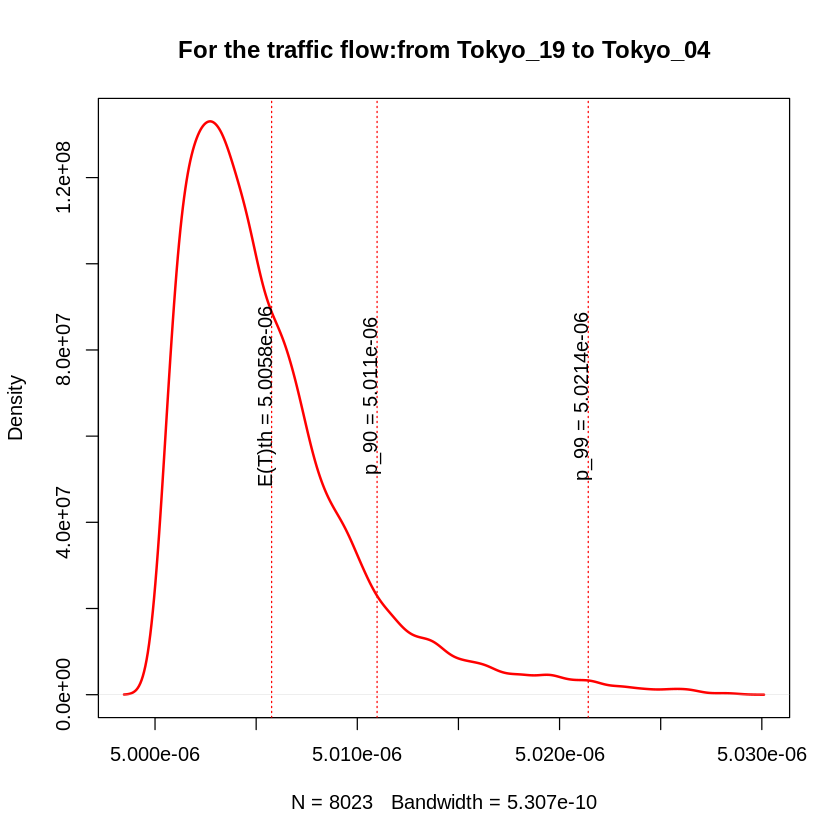

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_20->Tokyo_14
[1] 14
[1] "Node -  14 :"
[1] "variance= 1.27419756552589e-18"
[1] "sigma2= 1.12880359918185e-09"
[1] "igraph E(T) = 1.12082568595555e-09"
[1] "simmer E(T) = 1.10747494810205e-09"


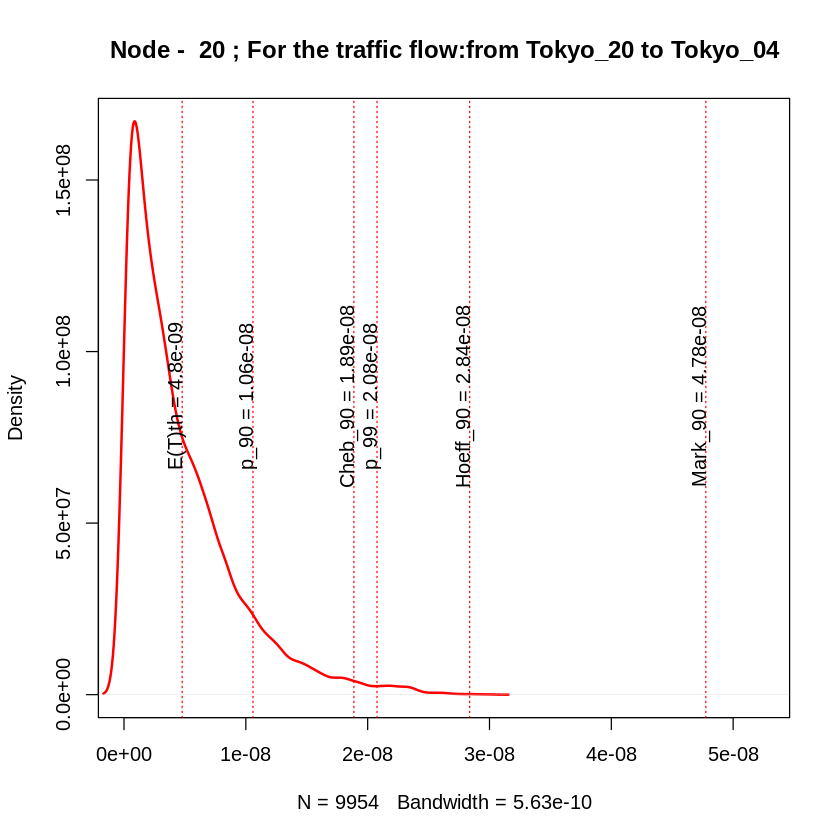

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "variance= 2.05772069636141e-17"
[1] "sigma2= 4.53621063924661e-09"
[1] "igraph E(T) = 6.00589643912775e-06"
[1] "simmer E(T) = 6.00576942638027e-06"


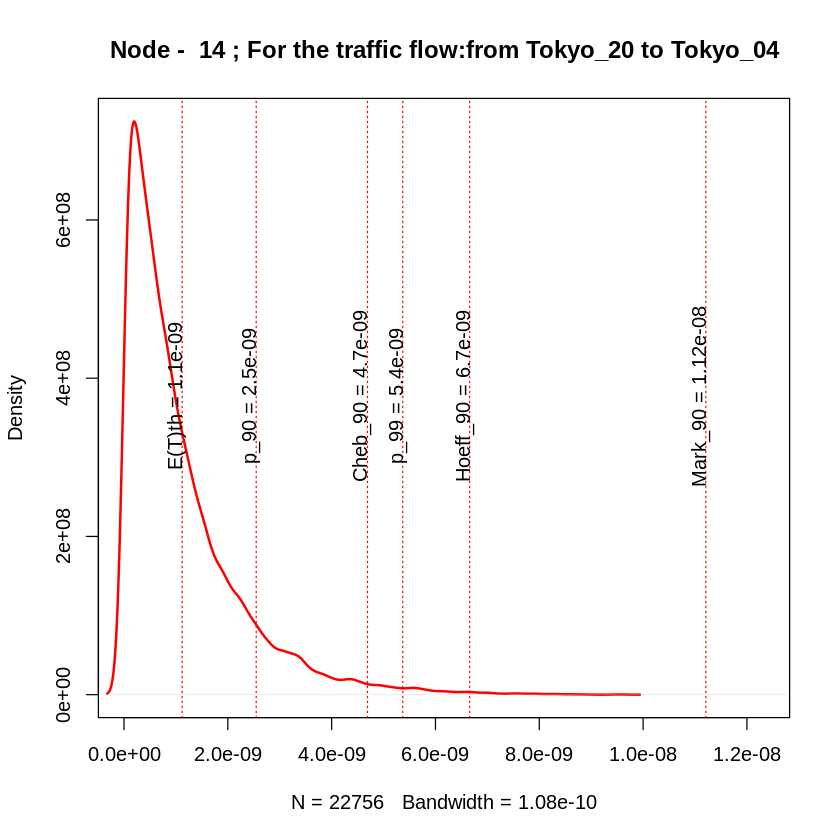

[1] 21
[1] "node_18"
[1] 1113211205
[1] 0.4499837
[1] 396821012
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_21->Tokyo_18
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_18->Tokyo_05
[1] "traffic_Tokyo_21_Tokyo_05_"
[1] 21
[1] "Node -  21 :"
[1] "variance= 6.93680228159428e-17"
[1] "sigma2= 8.32874677343133e-09"
[1] "igraph E(T) = 8.25707496713516e-09"
[1] "simmer E(T) = 8.38734136388941e-09"


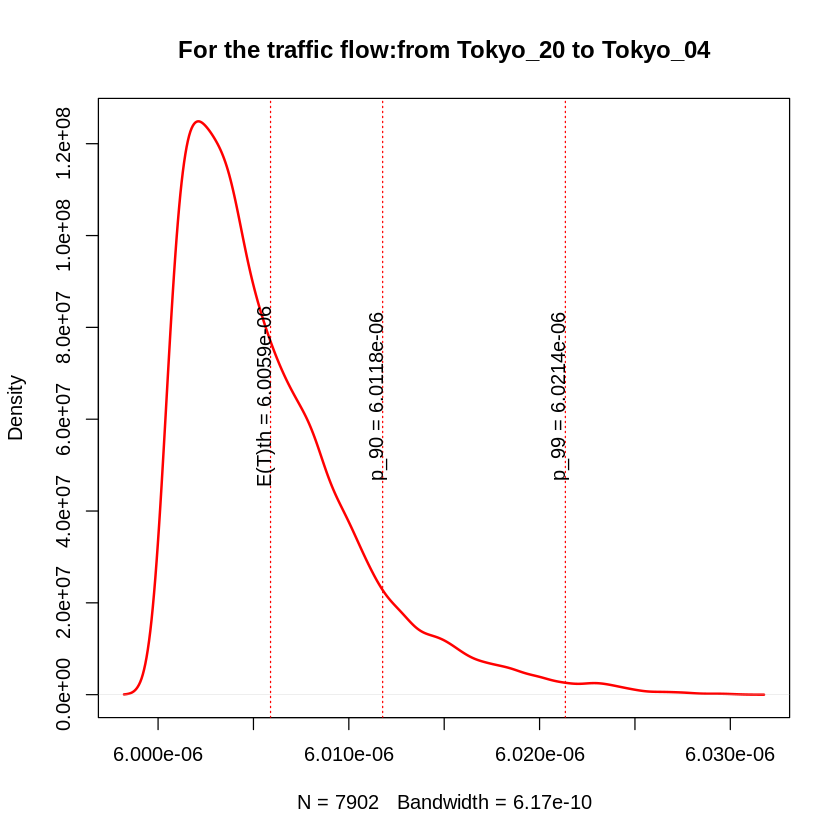

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_21->Tokyo_18
[1] 18
[1] "Node -  18 :"
[1] "variance= 2.77834198828578e-18"
[1] "sigma2= 1.66683592122493e-09"
[1] "igraph E(T) = 1.63322809658204e-09"
[1] "simmer E(T) = 1.64191496591038e-09"


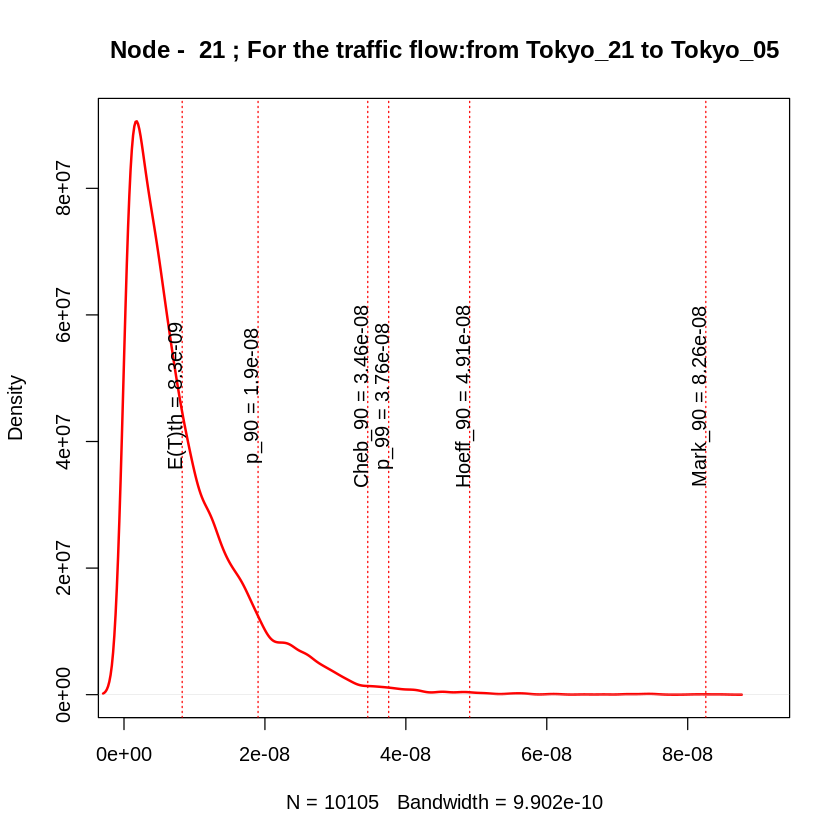

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_18->Tokyo_05
[1] "variance= 7.10026466702265e-17"
[1] "sigma2= 8.42630682269679e-09"
[1] "igraph E(T) = 6.00989030306372e-06"
[1] "simmer E(T) = 6.01001479965214e-06"


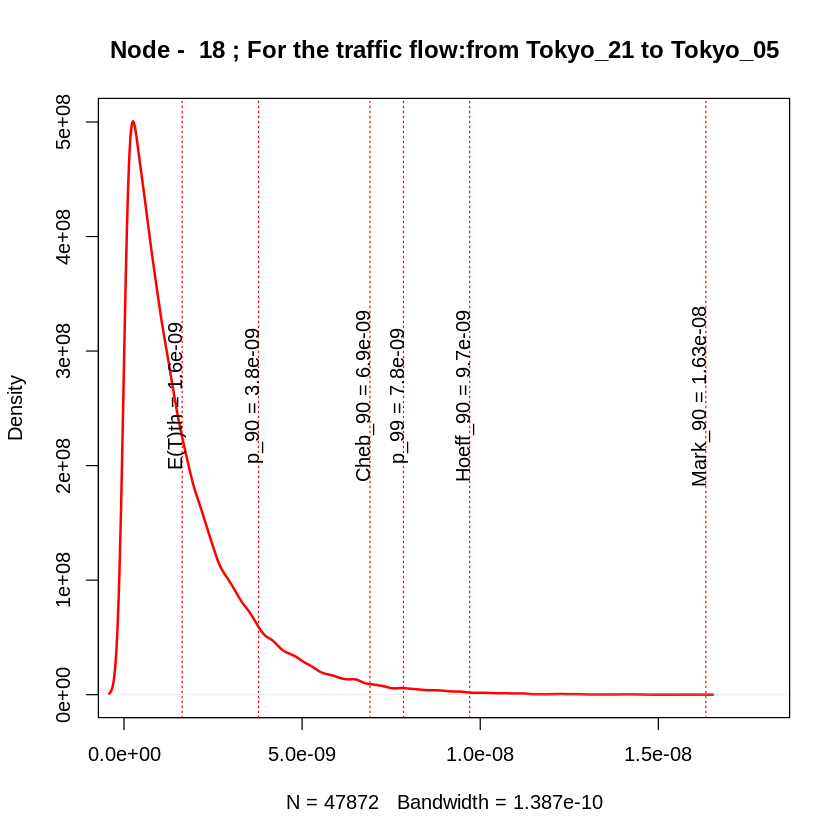

[1] 22
[1] "node_7"
[1] 1667311091
[1] 0.4251512
[1] 312012836
[1] "node_6"
[1] 2525132270
[1] 0.4221433
[1] 669121277
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_22->Tokyo_07
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_07->Tokyo_06
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "traffic_Tokyo_22_Tokyo_01_"
[1] 22
[1] "Node -  22 :"
[1] "variance= 9.59371730626577e-18"
[1] "sigma2= 3.09737264568953e-09"
[1] "igraph E(T) = 3.01291852118708e-09"
[1] "simmer E(T) = 3.05364623777473e-09"


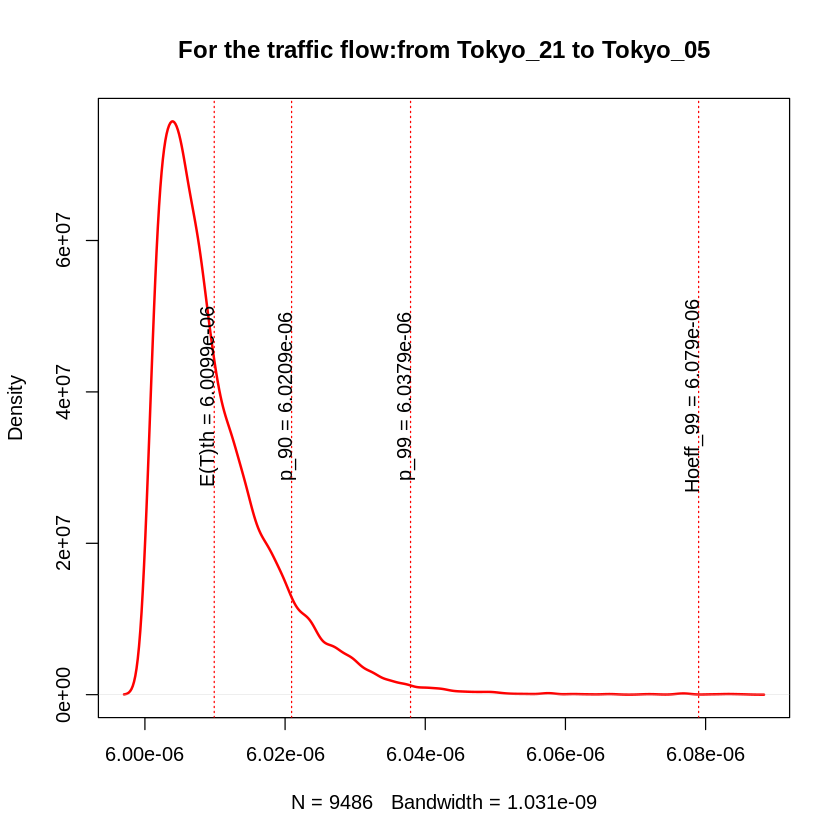

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_22->Tokyo_07
[1] 7
[1] "Node -  7 :"
[1] "variance= 1.05841013300616e-18"
[1] "sigma2= 1.02879061669815e-09"
[1] "igraph E(T) = 1.04334922898788e-09"
[1] "simmer E(T) = 9.9623684979558e-10"


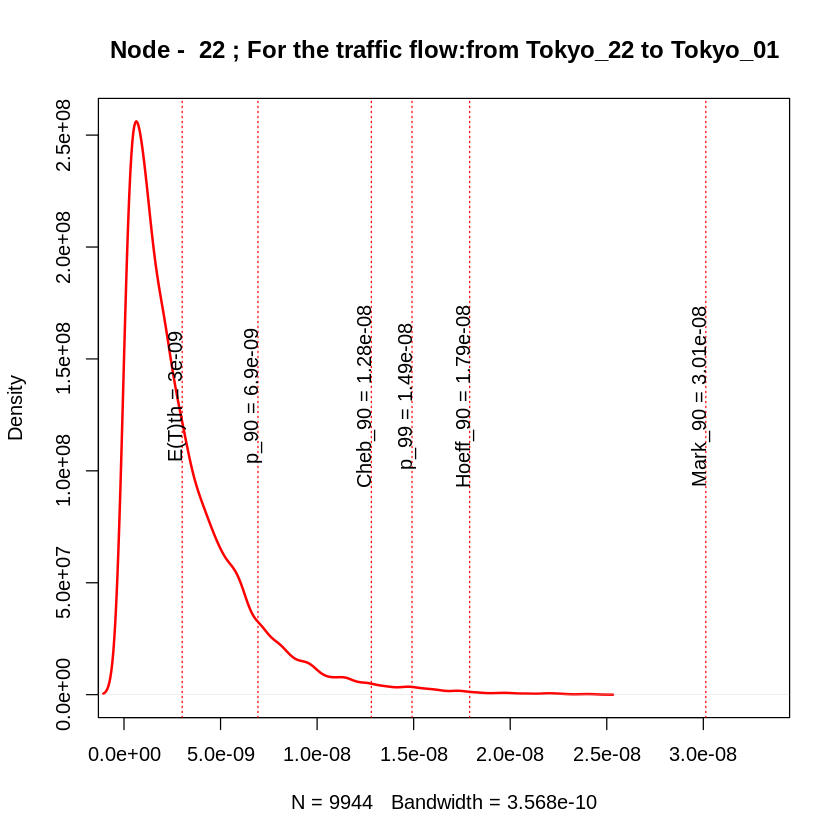

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_07->Tokyo_06
[1] 6
[1] "Node -  6 :"
[1] "variance= 4.31685222848224e-19"
[1] "sigma2= 6.57027566277264e-10"
[1] "igraph E(T) = 6.85323648411598e-10"
[1] "simmer E(T) = 6.53673173516137e-10"


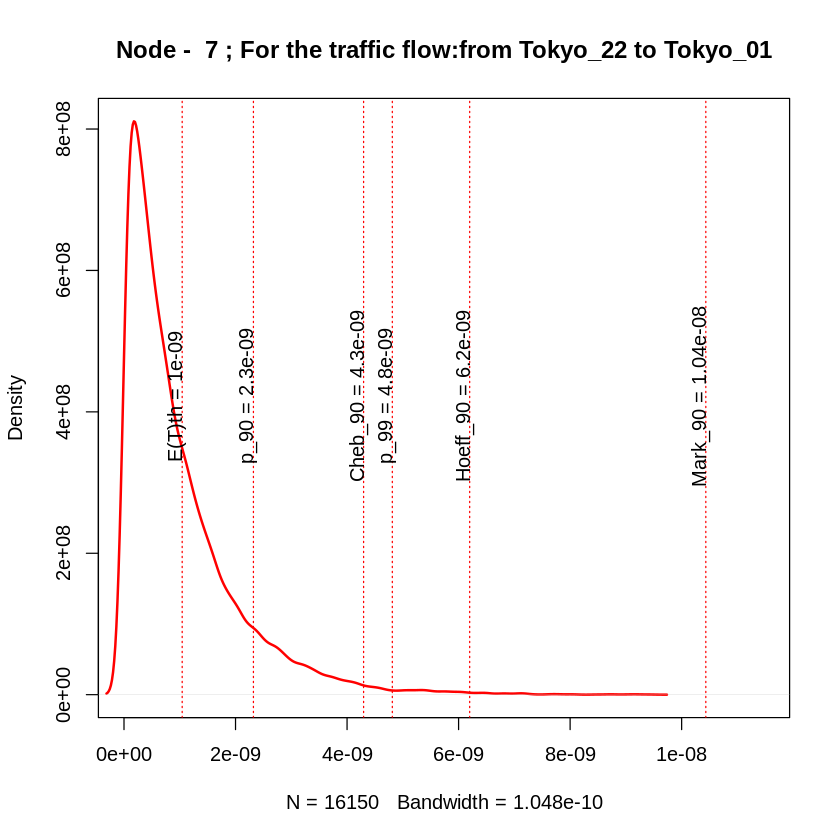

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "variance= 9.62087542715329e-18"
[1] "sigma2= 3.10175360516487e-09"
[1] "igraph E(T) = 1.20047415913986e-05"
[1] "simmer E(T) = 1.20045886976308e-05"


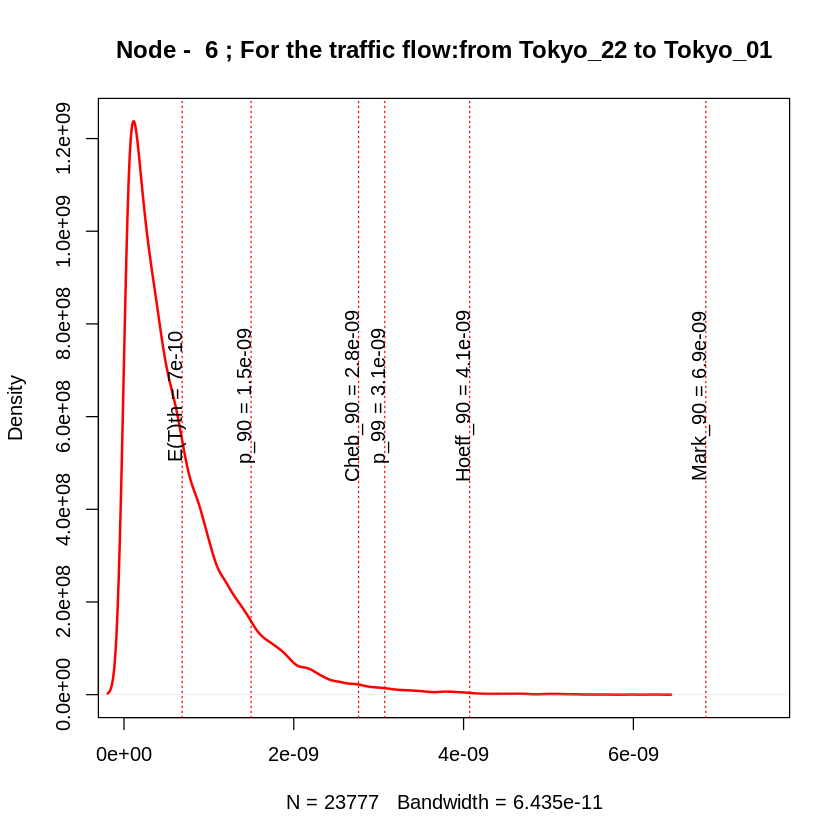

[1] 23
[1] "node_7"
[1] 1667311091
[1] 0.4251512
[1] 594596726
[1] "node_6"
[1] 2525132270
[1] 0.4221433
[1] 951705167
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_23->Tokyo_07
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_07->Tokyo_06
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "traffic_Tokyo_23_Tokyo_01_"
[1] 23
[1] "Node -  23 :"
[1] "variance= 1.39631710675843e-16"
[1] "sigma2= 1.18165862530531e-08"
[1] "igraph E(T) = 1.05878478732633e-08"
[1] "simmer E(T) = 1.1171143554521e-08"


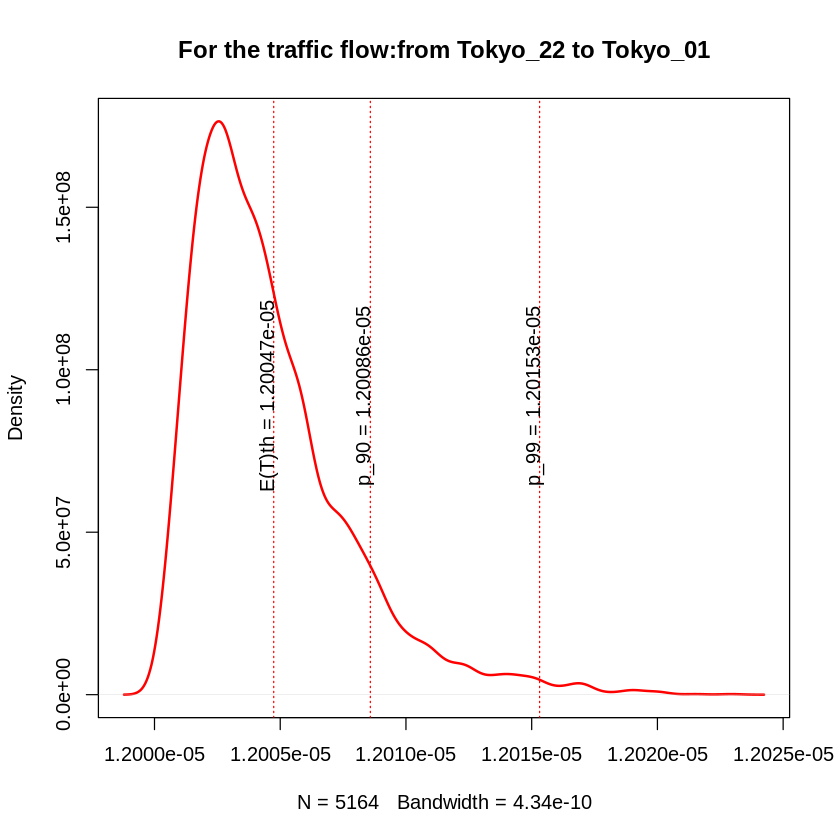

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_23->Tokyo_07
[1] 7
[1] "Node -  7 :"
[1] "variance= 1.07794439223534e-18"
[1] "sigma2= 1.03824100874283e-09"
[1] "igraph E(T) = 1.04334922898788e-09"
[1] "simmer E(T) = 1.04413368011528e-09"


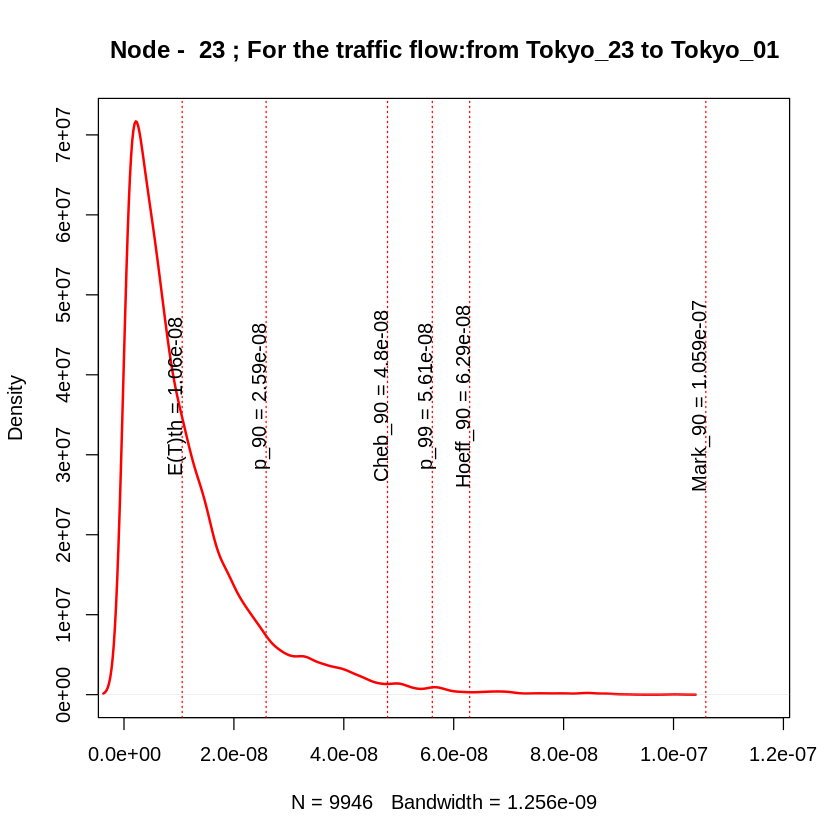

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_07->Tokyo_06
[1] 6
[1] "Node -  6 :"
[1] "variance= 4.65312306557191e-19"
[1] "sigma2= 6.82138040690585e-10"
[1] "igraph E(T) = 6.85323648411598e-10"
[1] "simmer E(T) = 6.82440622203461e-10"


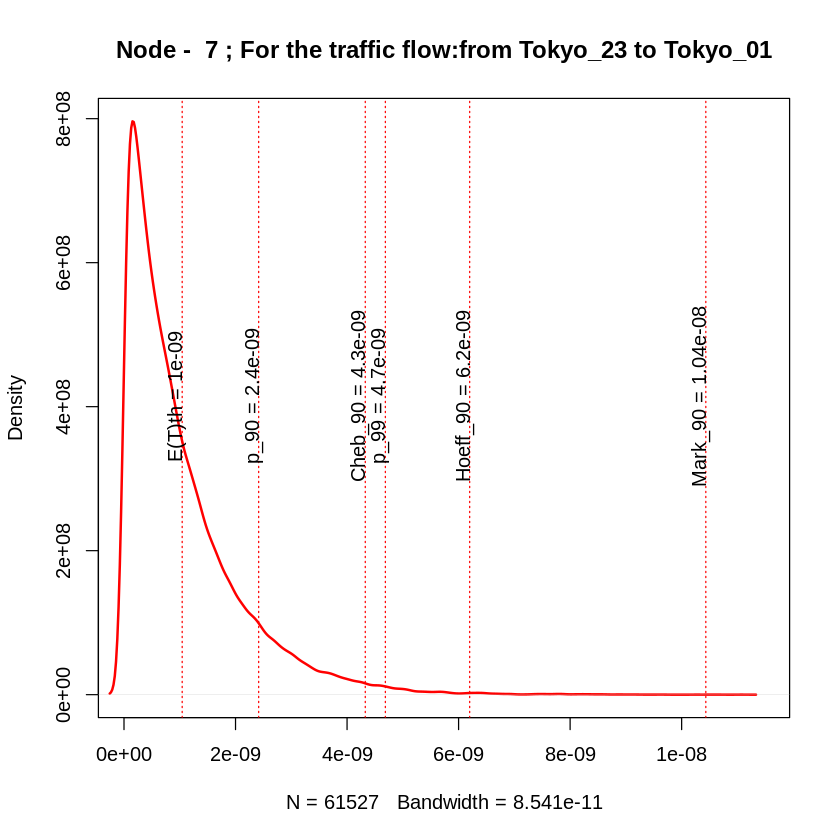

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "variance= 1.35752533807235e-16"
[1] "sigma2= 1.16512889332998e-08"
[1] "igraph E(T) = 1.30123165207507e-05"
[1] "simmer E(T) = 1.30127388397049e-05"


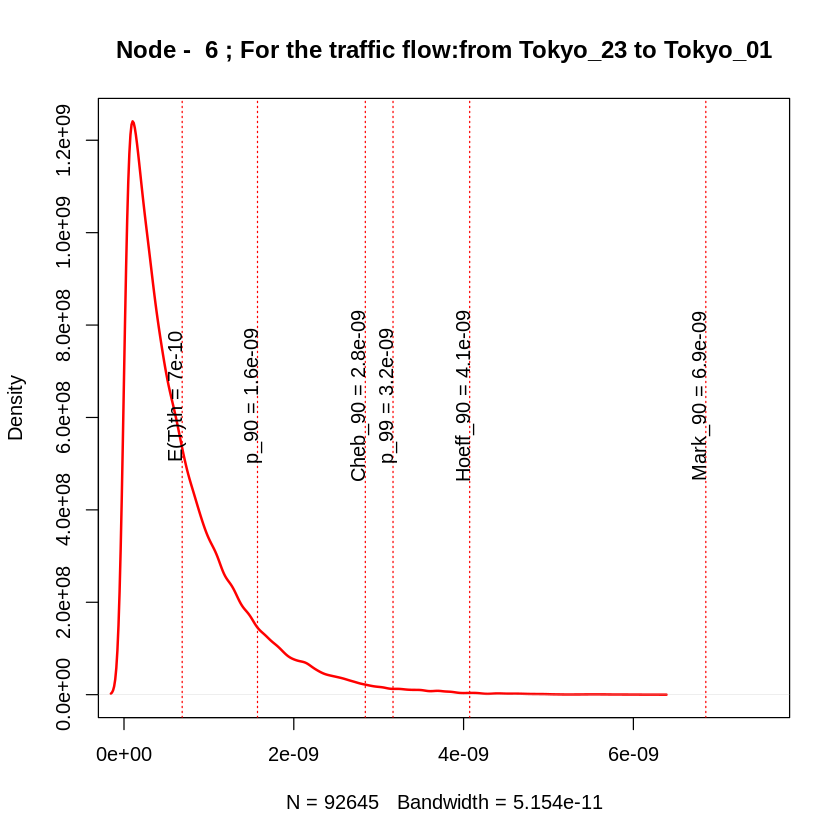

[1] 24
[1] "no info of traffic"
 [1] 0.000000e+00 5.002260e-06 5.002466e-06 0.000000e+00 0.000000e+00
 [6] 4.000703e-06 8.001725e-06 1.000477e-05 1.000478e-05 8.005399e-06
[11] 1.500739e-05 8.011619e-06 4.001330e-06 3.001137e-06 6.011255e-06
[16] 3.001486e-06 5.008058e-06 3.001711e-06 5.005565e-06 6.005769e-06
[21] 6.010015e-06 1.200459e-05 1.301274e-05 0.000000e+00
[1] 25
[1] "node_1"
[1] 165147444
[1] 0.4834118
[1] 48980531
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_02
[1] "traffic_Tokyo_01_Tokyo_02_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.43491310219548e-16"
[1] "sigma2= 1.19787858407916e-08"
[1] "igraph E(T) = 1.1721513636851e-08"
[1] "simmer E(T) = 1.20283721280341e-08"


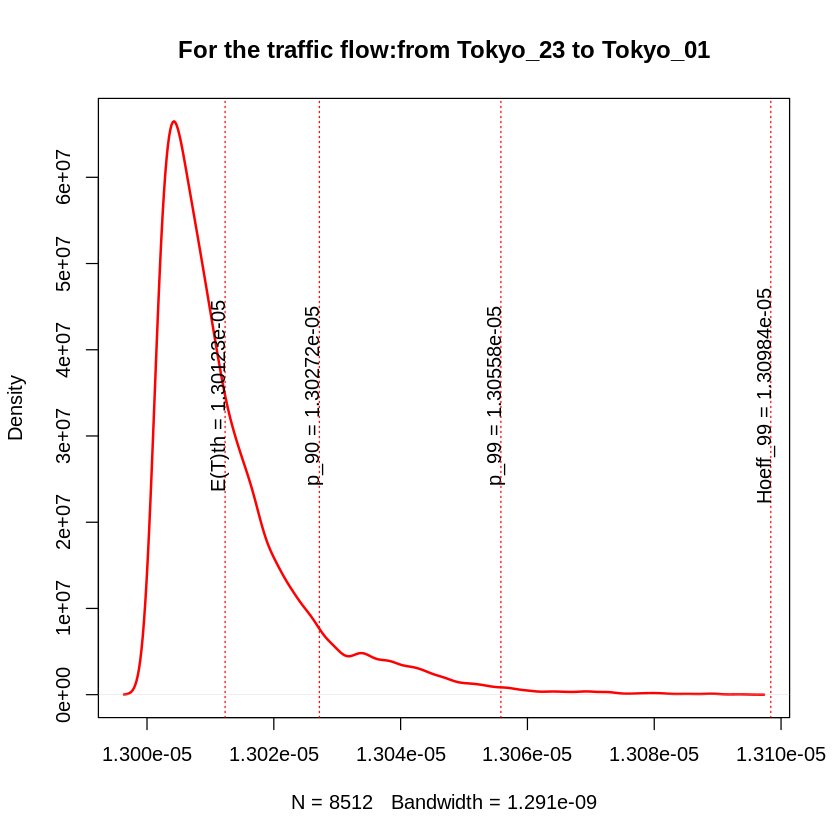

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_02
[1] "variance= 1.49461883086377e-16"
[1] "sigma2= 1.22254604447594e-08"
[1] "igraph E(T) = 5.01172151363685e-06"
[1] "simmer E(T) = 5.01224633827888e-06"


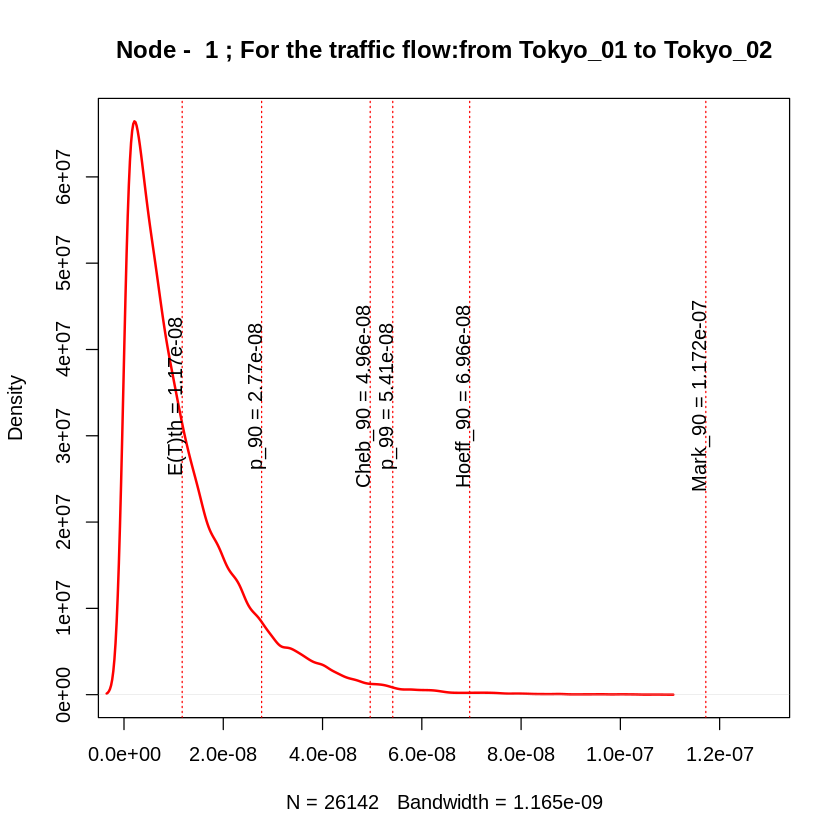

[1] 26
[1] "node_1"
[1] 113880872
[1] 0.4767033
[1] 42720073
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_03
[1] "traffic_Tokyo_01_Tokyo_03_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 3.03630257903129e-16"
[1] "sigma2= 1.74249894663707e-08"
[1] "igraph E(T) = 1.67803585342803e-08"
[1] "simmer E(T) = 1.70845460298716e-08"


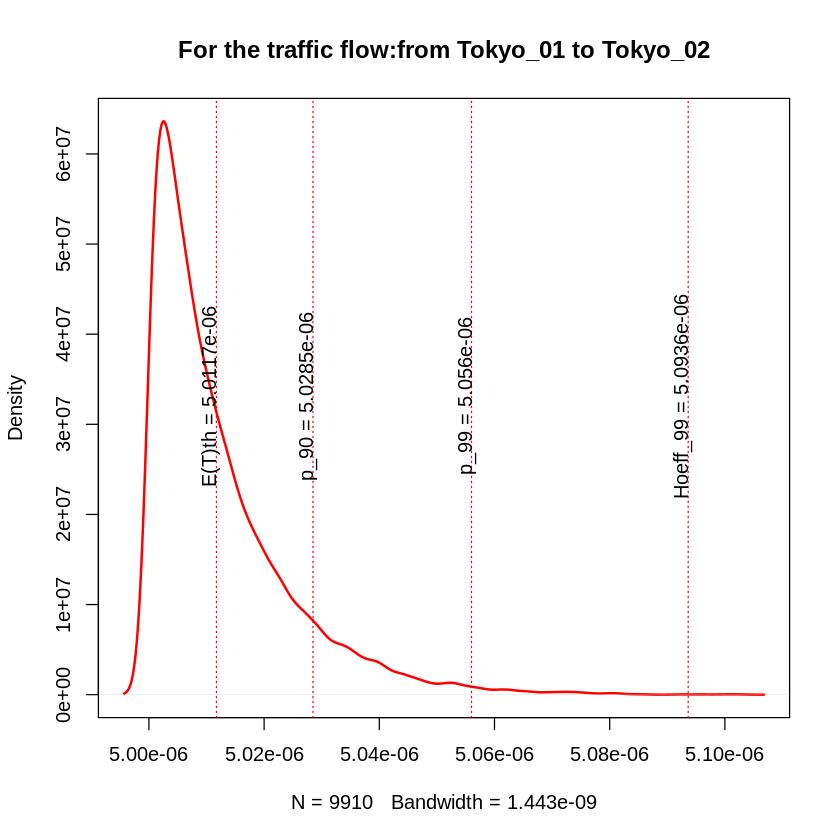

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_03
[1] "variance= 3.17629888330493e-16"
[1] "sigma2= 1.78221740629614e-08"
[1] "igraph E(T) = 5.01678035853428e-06"
[1] "simmer E(T) = 5.01726107109254e-06"


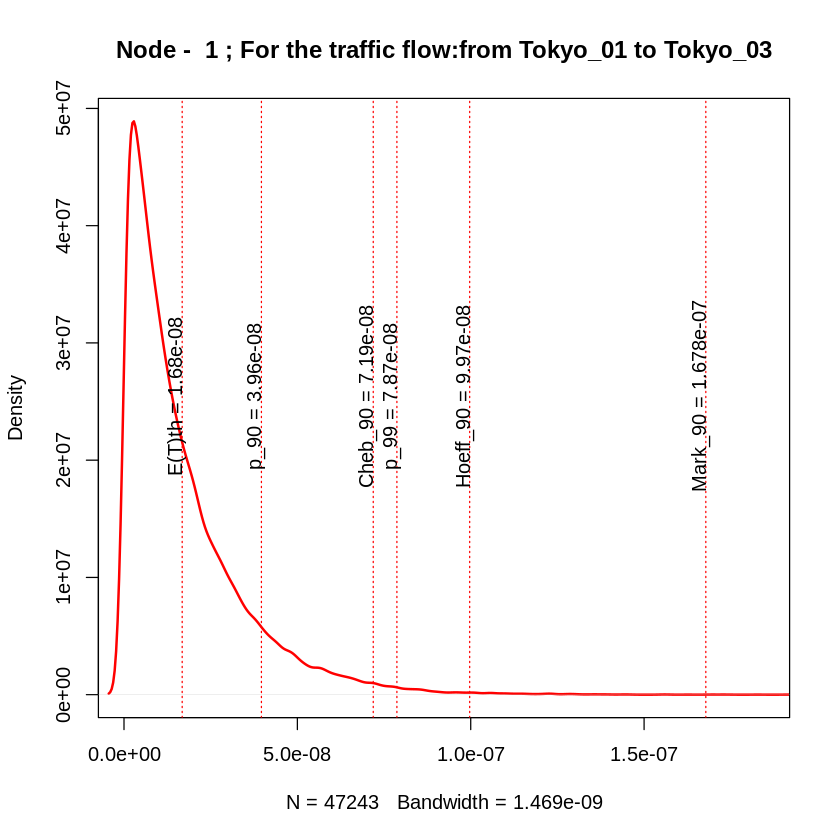

[1] 27
[1] "no info of traffic"
 [1] 0.000000e+00 5.002260e-06 5.002466e-06 0.000000e+00 0.000000e+00
 [6] 4.000703e-06 8.001725e-06 1.000477e-05 1.000478e-05 8.005399e-06
[11] 1.500739e-05 8.011619e-06 4.001330e-06 3.001137e-06 6.011255e-06
[16] 3.001486e-06 5.008058e-06 3.001711e-06 5.005565e-06 6.005769e-06
[21] 6.010015e-06 1.200459e-05 1.301274e-05 0.000000e+00 5.012246e-06
[26] 5.017261e-06 0.000000e+00
[1] 28
[1] "no info of traffic"
 [1] 0.000000e+00 5.002260e-06 5.002466e-06 0.000000e+00 0.000000e+00
 [6] 4.000703e-06 8.001725e-06 1.000477e-05 1.000478e-05 8.005399e-06
[11] 1.500739e-05 8.011619e-06 4.001330e-06 3.001137e-06 6.011255e-06
[16] 3.001486e-06 5.008058e-06 3.001711e-06 5.005565e-06 6.005769e-06
[21] 6.010015e-06 1.200459e-05 1.301274e-05 0.000000e+00 5.012246e-06
[26] 5.017261e-06 0.000000e+00 0.000000e+00
[1] 29
[1] "node_1"
[1] 214710133
[1] 0.4925013
[1] 66066303
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_06
[1] "traffic_Tokyo_01_Tokyo_06_"
[1]

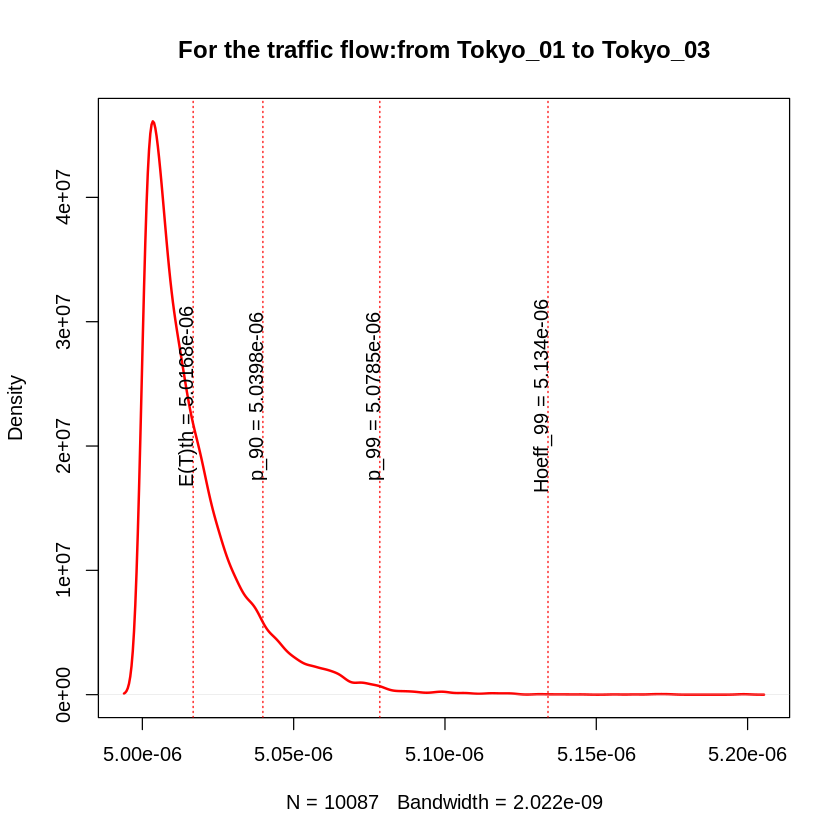

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_06
[1] "variance= 8.53475994114854e-17"
[1] "sigma2= 9.23837644889433e-09"
[1] "igraph E(T) = 4.00917724912672e-06"
[1] "simmer E(T) = 4.00919473716943e-06"


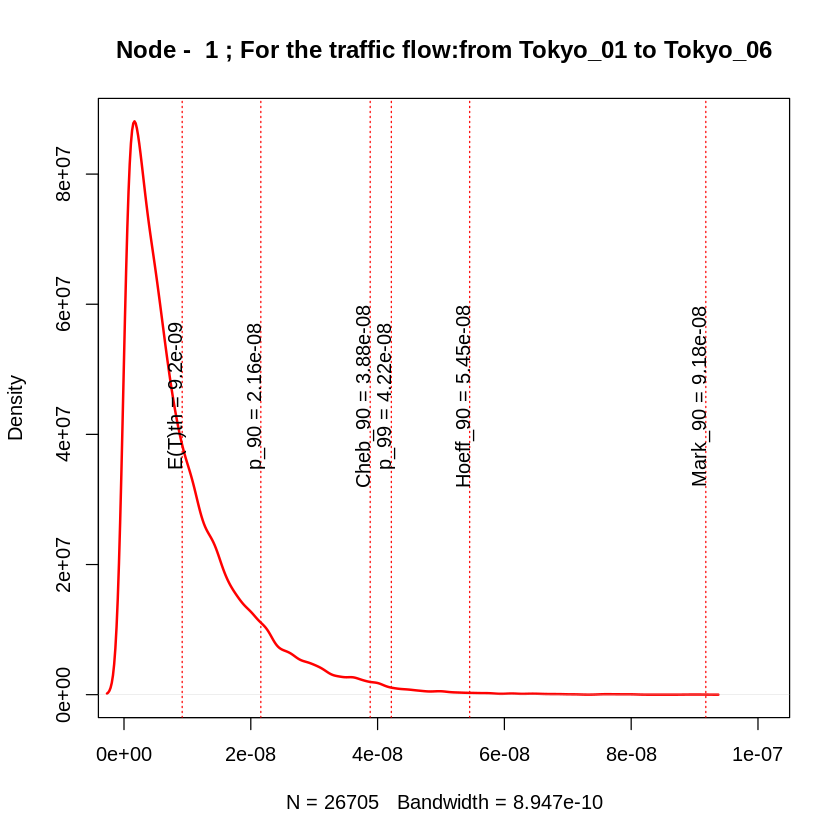

[1] 30
[1] "node_1"
[1] 214710133
[1] 0.4925013
[1] 83772761
[1] "node_6"
[1] 139109649
[1] 0.4749225
[1] 44094045
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_06
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_07
[1] "traffic_Tokyo_01_Tokyo_07_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 8.43634180963873e-17"
[1] "sigma2= 9.18495607482079e-09"
[1] "igraph E(T) = 9.17724912671743e-09"
[1] "simmer E(T) = 9.17311128833961e-09"


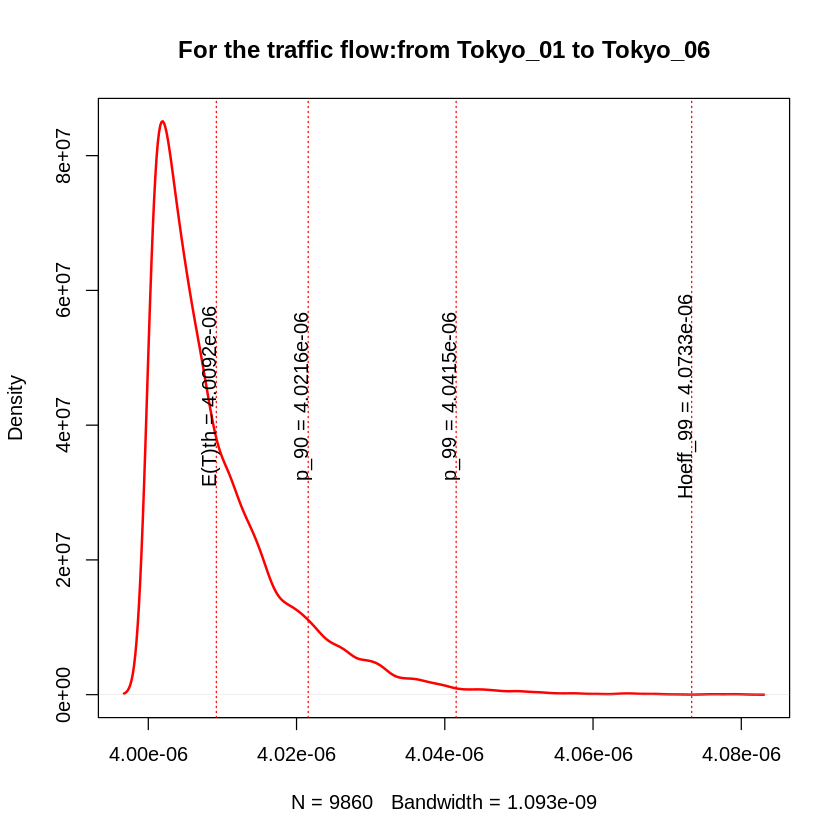

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_06
[1] 6
[1] "Node -  6 :"
[1] "variance= 1.94449362878764e-16"
[1] "sigma2= 1.39445101340551e-08"
[1] "igraph E(T) = 1.36905009844813e-08"
[1] "simmer E(T) = 1.38644549416397e-08"


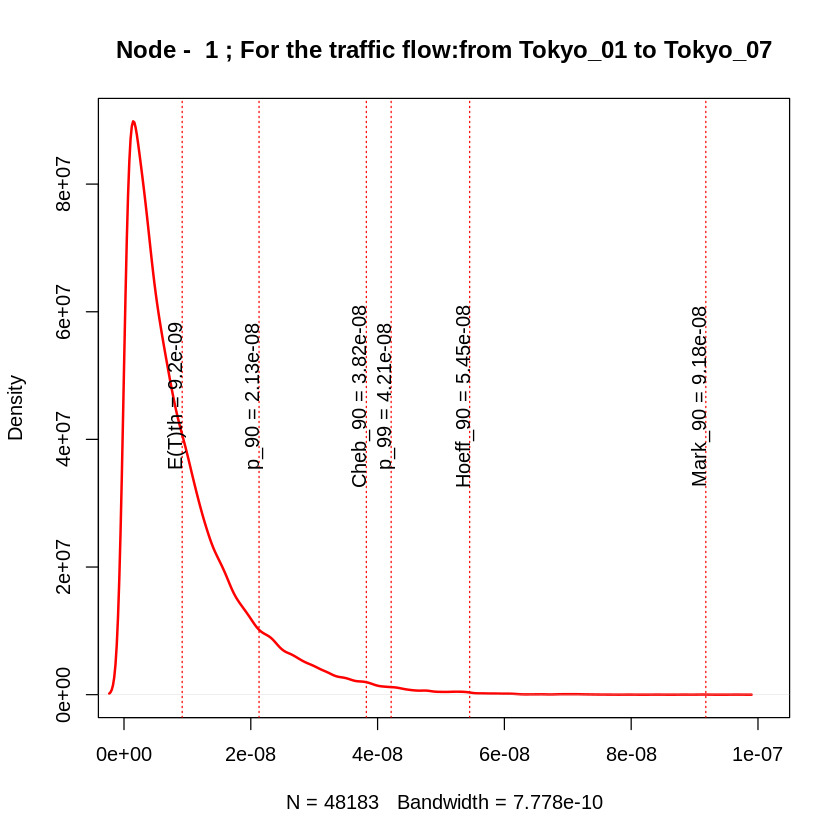

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_07
[1] "variance= 2.73832505410974e-16"
[1] "sigma2= 1.65478852247341e-08"
[1] "igraph E(T) = 8.0228677501112e-06"
[1] "simmer E(T) = 8.02305373513112e-06"


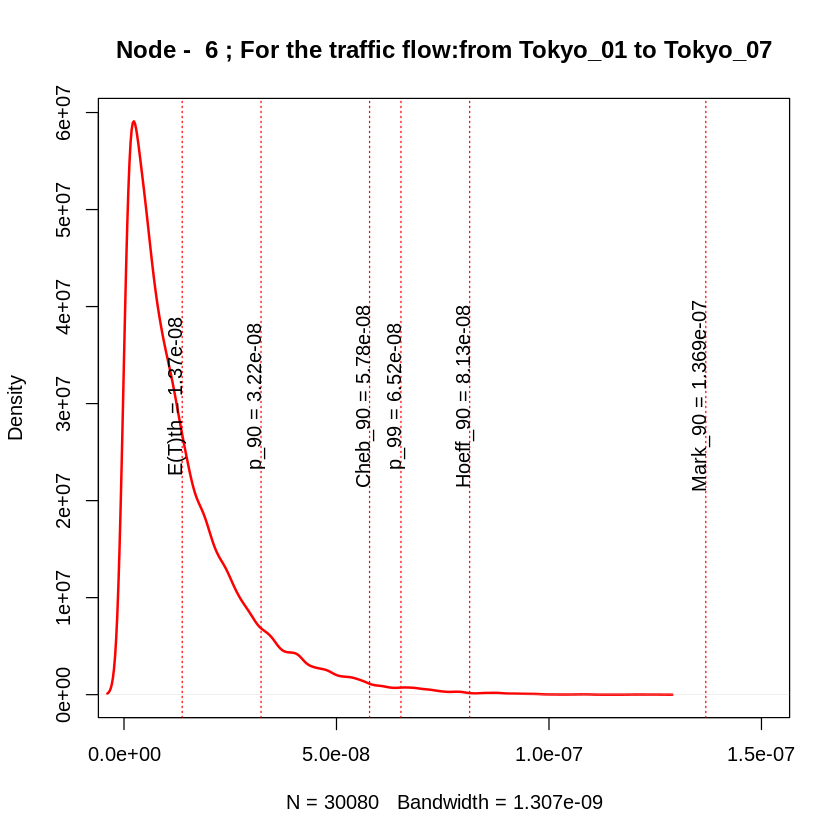

[1] 31
[1] "node_1"
[1] 165147444
[1] 0.4834118
[1] 43549535
[1] "node_2"
[1] 112529308
[1] 0.4352691
[1] 12695835
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_02
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_02->Tokyo_08
[1] "traffic_Tokyo_01_Tokyo_08_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.29089449127818e-16"
[1] "sigma2= 1.13617537875021e-08"
[1] "igraph E(T) = 1.1721513636851e-08"
[1] "simmer E(T) = 1.16157118094099e-08"


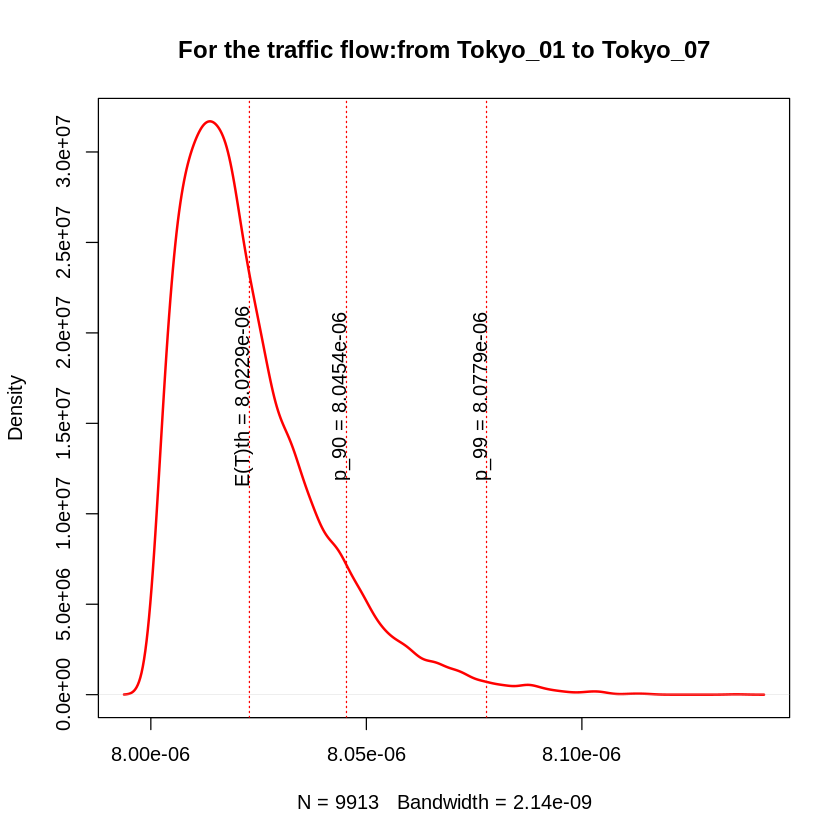

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_02
[1] 2
[1] "Node -  2 :"
[1] "variance= 2.84234642309316e-16"
[1] "sigma2= 1.68592598387152e-08"
[1] "igraph E(T) = 1.57359439796034e-08"
[1] "simmer E(T) = 1.64644100248162e-08"


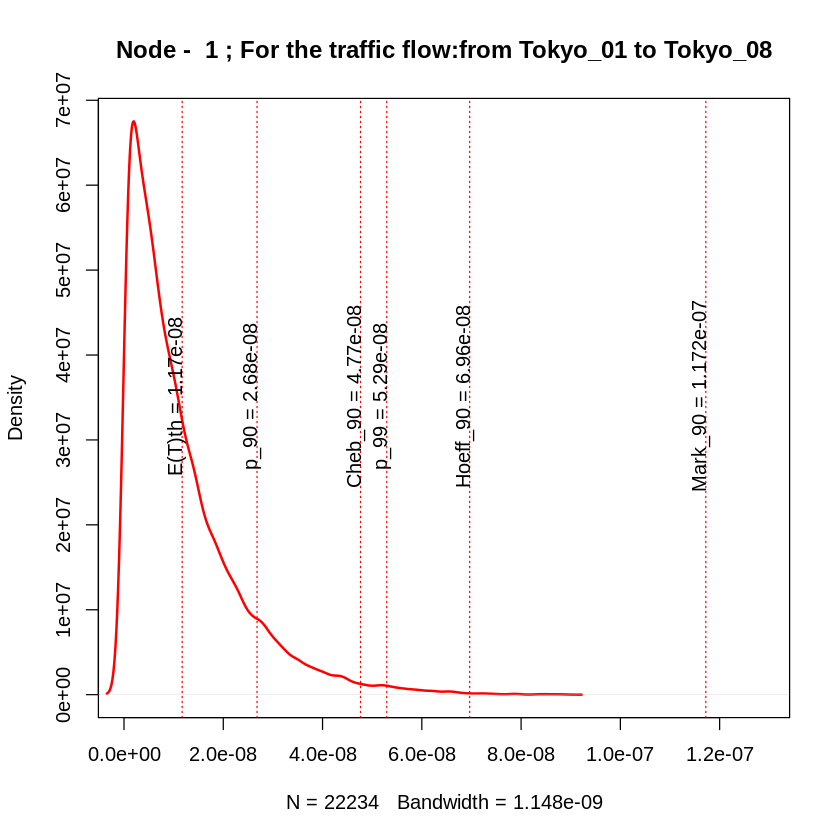

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_02->Tokyo_08
[1] "variance= 4.24602541165854e-16"
[1] "sigma2= 2.06058860805803e-08"
[1] "igraph E(T) = 1.00274574576165e-05"
[1] "simmer E(T) = 1.0028209038279e-05"


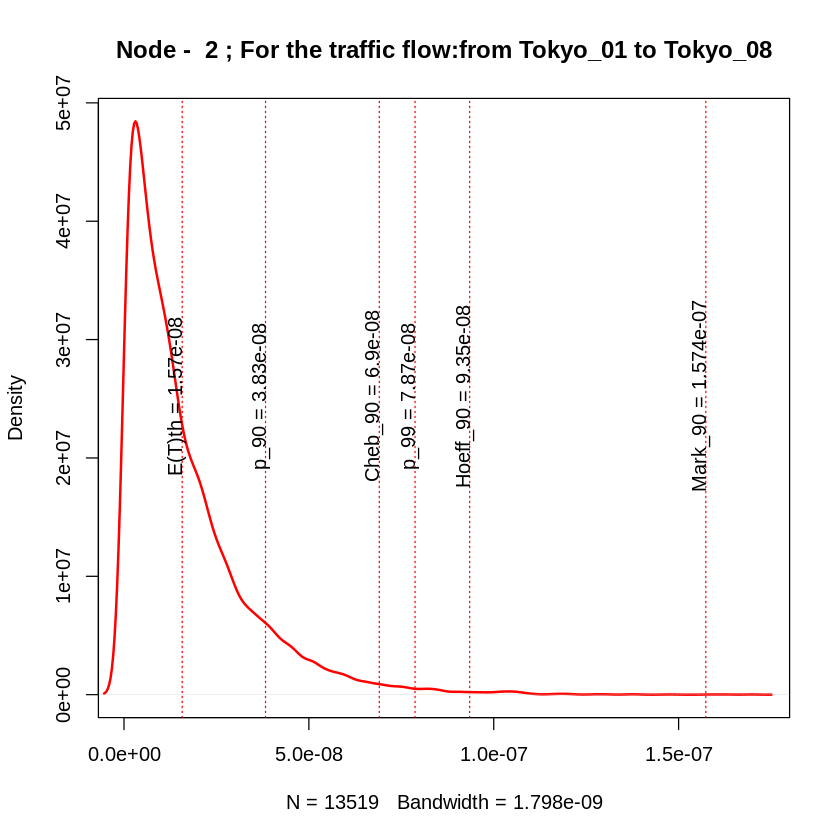

[1] 32
[1] "node_1"
[1] 113880872
[1] 0.4767033
[1] 48244172
[1] "node_3"
[1] 87430957
[1] 0.488615
[1] 36676856
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_03
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_03->Tokyo_09
[1] "traffic_Tokyo_01_Tokyo_09_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 3.13481568529851e-16"
[1] "sigma2= 1.77054107133907e-08"
[1] "igraph E(T) = 1.67803585342803e-08"
[1] "simmer E(T) = 1.72864208426327e-08"


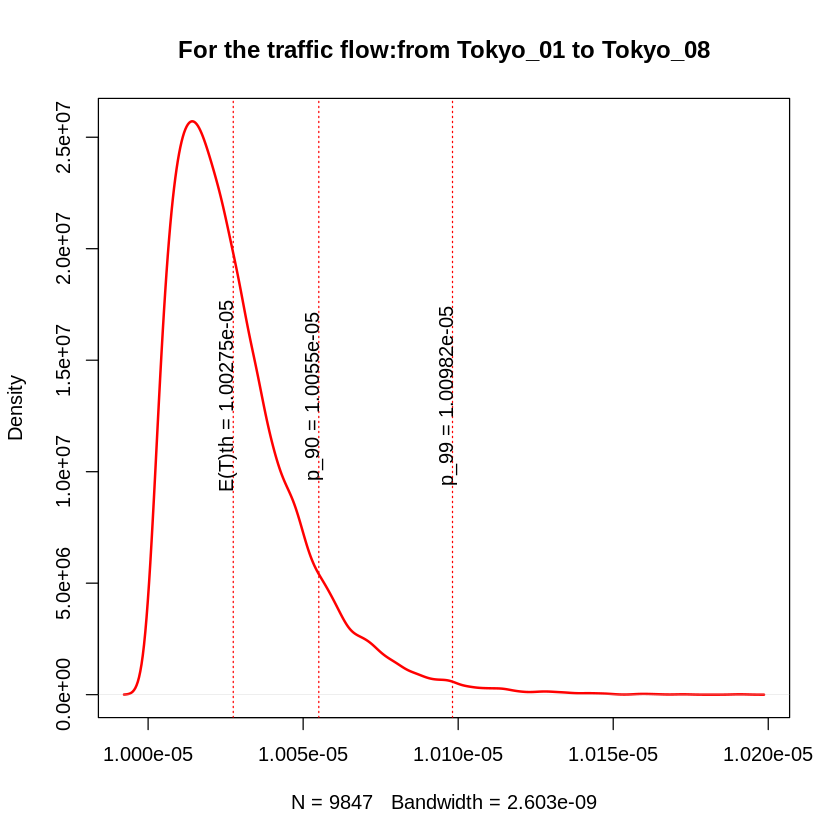

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_03
[1] 3
[1] "Node -  3 :"
[1] "variance= 5.02929716053955e-16"
[1] "sigma2= 2.24260945341349e-08"
[1] "igraph E(T) = 2.23659190076199e-08"
[1] "simmer E(T) = 2.25830083974178e-08"


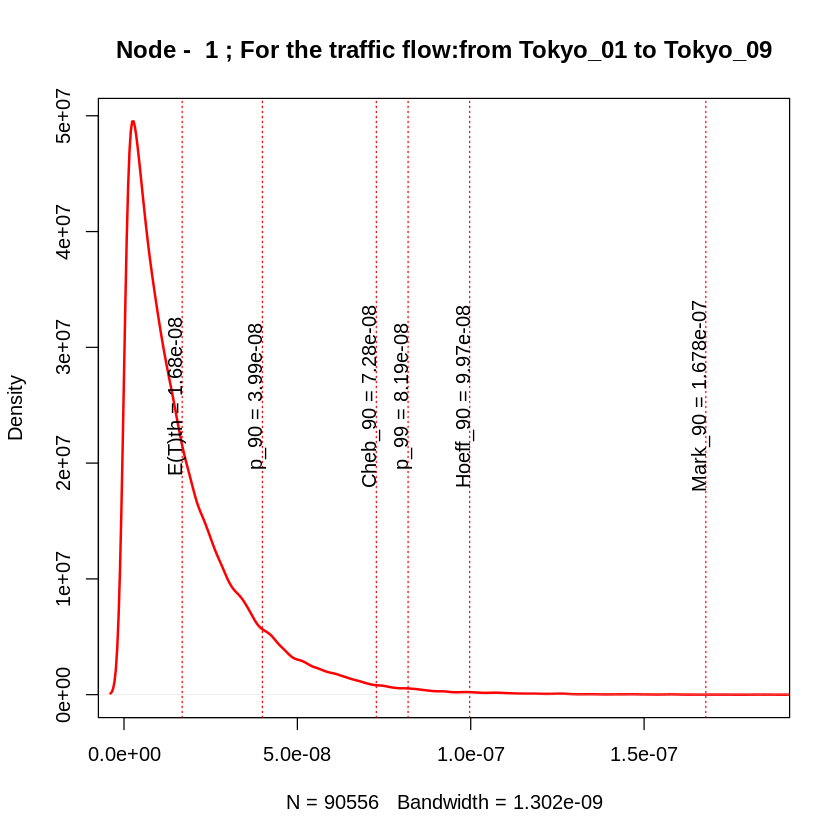

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_03->Tokyo_09
[1] "variance= 8.33153123142706e-16"
[1] "sigma2= 2.88643919586522e-08"
[1] "igraph E(T) = 1.00391462775419e-05"
[1] "simmer E(T) = 1.00394878187253e-05"


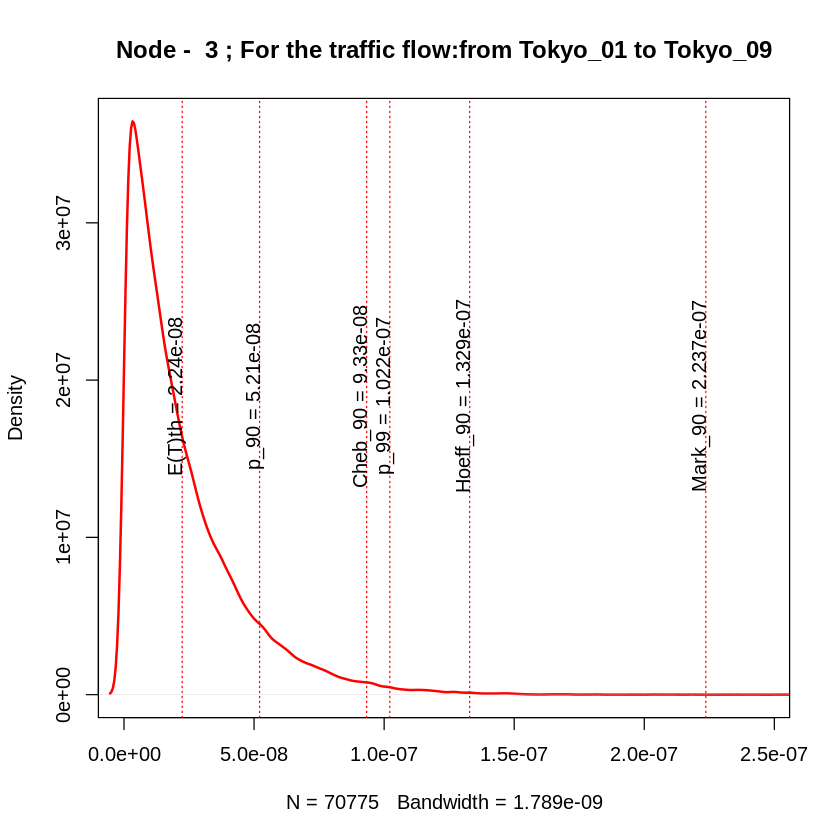

[1] 33
[1] "node_4"
[1] 159611404
[1] 0.5073199
[1] 42223525
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_13
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_13->Tokyo_10
[1] "traffic_Tokyo_04_Tokyo_10_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 1.74210890288842e-16"
[1] "sigma2= 1.31988973133683e-08"
[1] "igraph E(T) = 1.27166003287417e-08"
[1] "simmer E(T) = 1.28943713218635e-08"


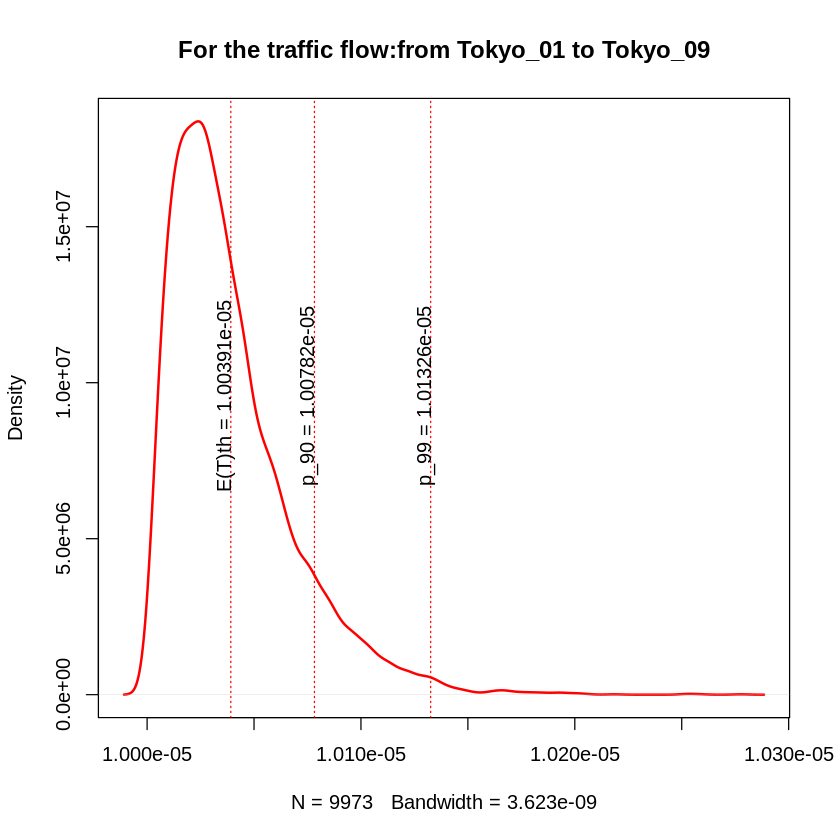

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_13
[1] 13
[1] "Node -  13 :"
[1] "variance= 3.78802849415755e-16"
[1] "sigma2= 1.94628582026319e-08"
[1] "igraph E(T) = 2.0278889329559e-08"
[1] "simmer E(T) = 1.94150556681723e-08"


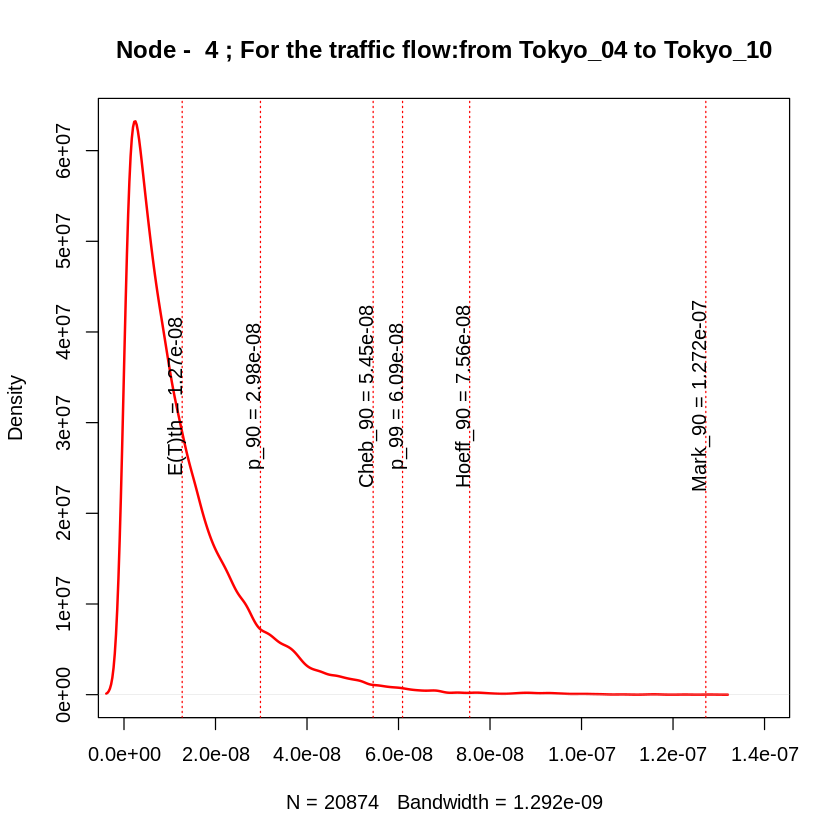

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_13->Tokyo_10
[1] "variance= 5.2394200723566e-16"
[1] "sigma2= 2.28897795366329e-08"
[1] "igraph E(T) = 8.0329954896583e-06"
[1] "simmer E(T) = 8.03218893199045e-06"


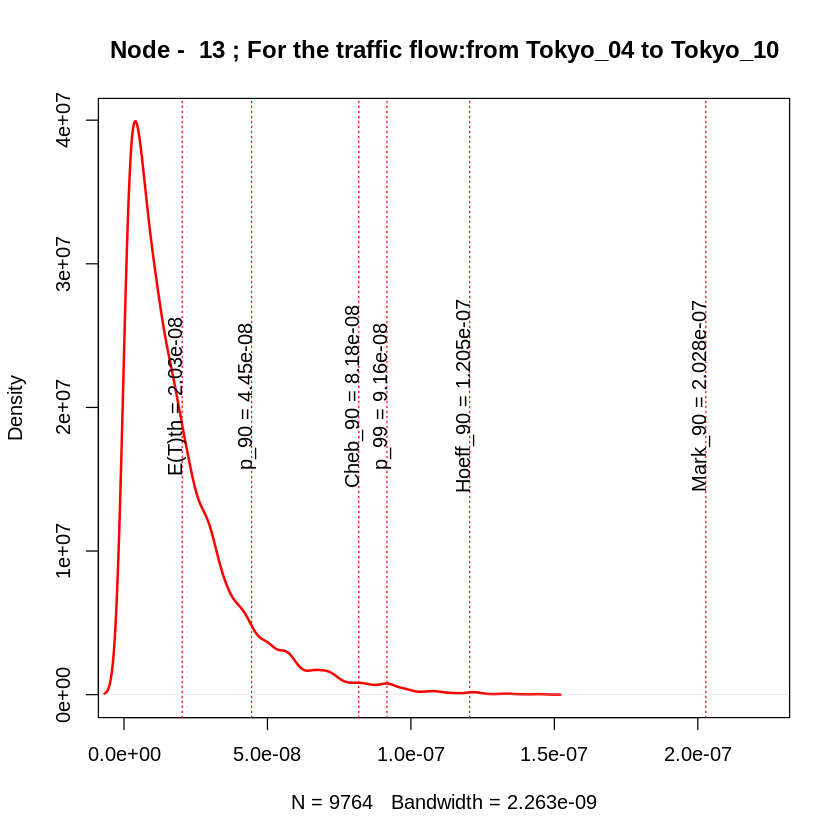

[1] 34
[1] "node_1"
[1] 113880872
[1] 0.4767033
[1] 17610533
[1] "node_3"
[1] 87430957
[1] 0.488615
[1] 6043217
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_03
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_03->Tokyo_09
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_09->Tokyo_11
[1] "traffic_Tokyo_01_Tokyo_11_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 2.99329164388789e-16"
[1] "sigma2= 1.73011318817235e-08"
[1] "igraph E(T) = 1.67803585342803e-08"
[1] "simmer E(T) = 1.70935583341161e-08"


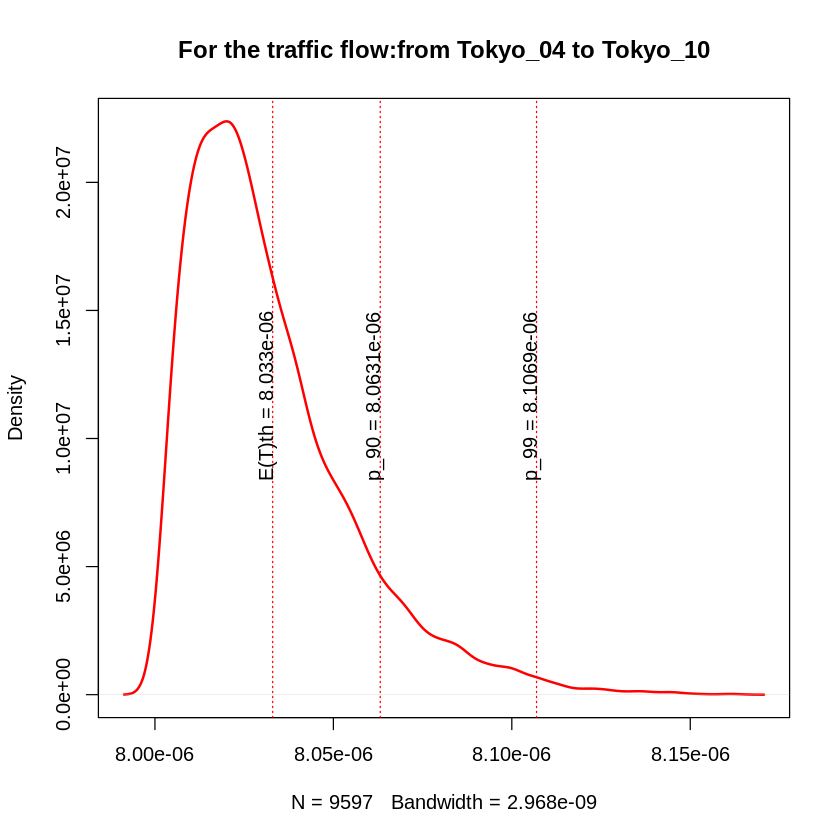

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_03
[1] 3
[1] "Node -  3 :"
[1] "variance= 5.12170425413083e-16"
[1] "sigma2= 2.26311825898048e-08"
[1] "igraph E(T) = 2.23659190076199e-08"
[1] "simmer E(T) = 2.23221094333344e-08"


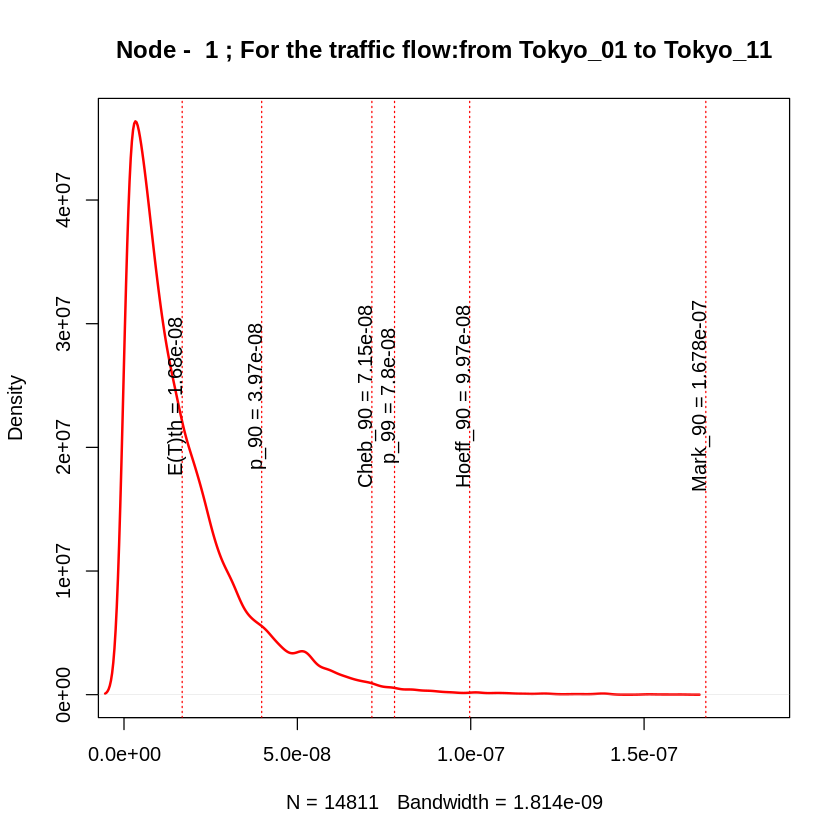

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_03->Tokyo_09
[1] 9
[1] "Node -  9 :"
[1] "variance= 5.99746669976416e-16"
[1] "sigma2= 2.44897258044351e-08"
[1] "igraph E(T) = 2.55151543376646e-08"
[1] "simmer E(T) = 2.45300604278544e-08"


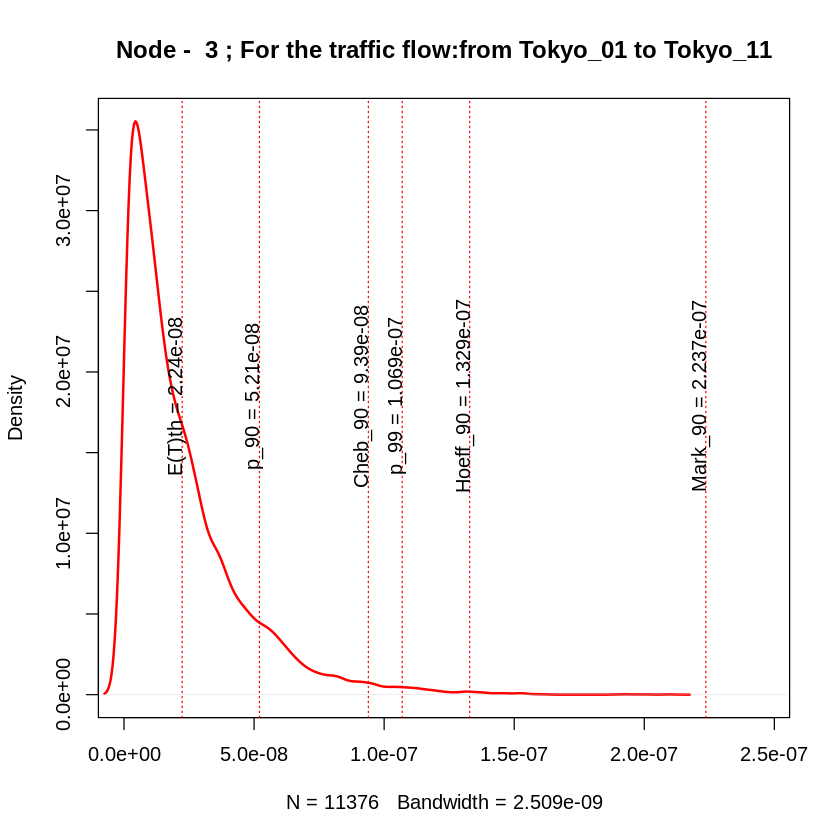

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_09->Tokyo_11
[1] "variance= 1.48462412157013e-15"
[1] "sigma2= 3.85308204113295e-08"
[1] "igraph E(T) = 1.50646614318796e-05"
[1] "simmer E(T) = 1.50639617880075e-05"


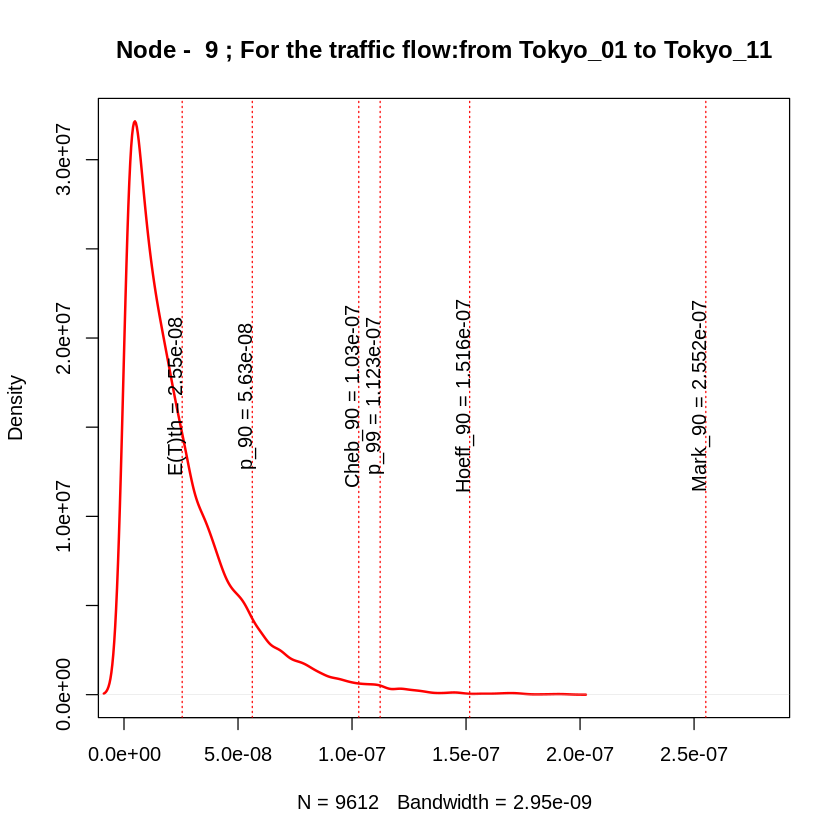

[1] 35
[1] "node_4"
[1] 159611404
[1] 0.5073199
[1] 73348069
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_13
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_13->Tokyo_12
[1] "traffic_Tokyo_04_Tokyo_12_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 1.5986454367825e-16"
[1] "sigma2= 1.26437551256836e-08"
[1] "igraph E(T) = 1.27166003287417e-08"
[1] "simmer E(T) = 1.26516920861083e-08"


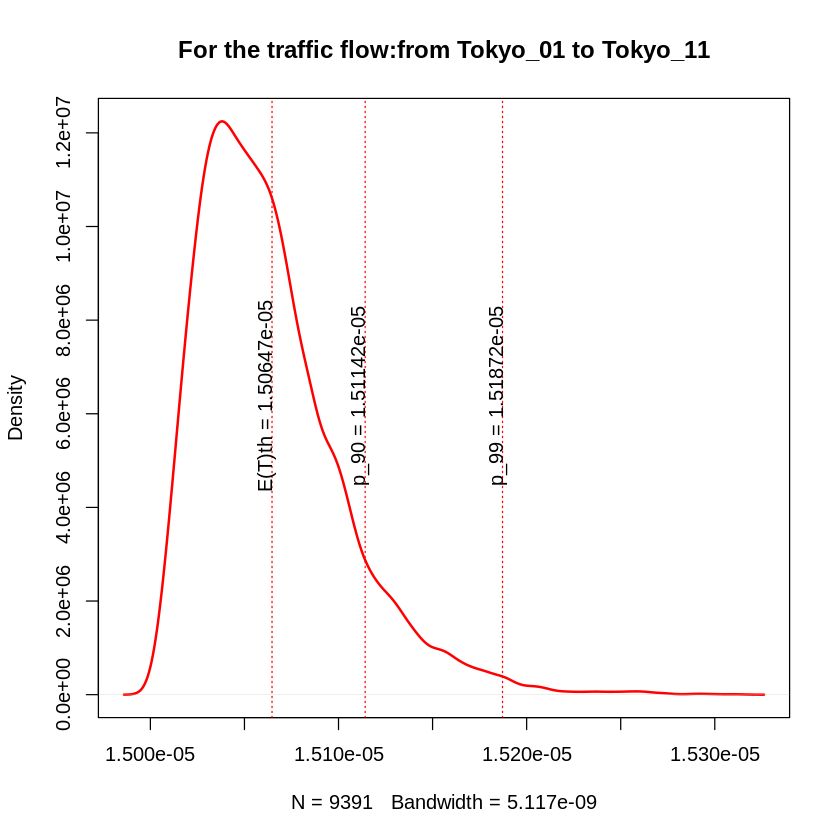

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_13
[1] 13
[1] "Node -  13 :"
[1] "variance= 4.01973860931809e-14"
[1] "sigma2= 2.00492857960529e-07"
[1] "igraph E(T) = 2.06677737512584e-07"
[1] "simmer E(T) = 1.9954296655502e-07"


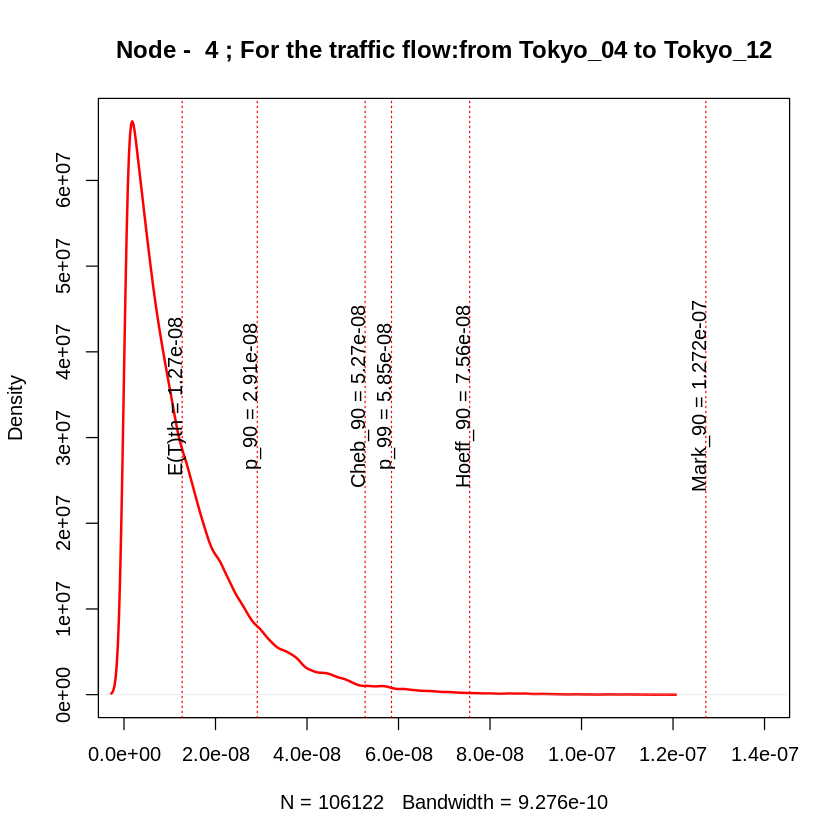

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_13->Tokyo_12
[1] "variance= 4.04382252435922e-14"
[1] "sigma2= 2.01092578787961e-07"
[1] "igraph E(T) = 8.21939433784133e-06"
[1] "simmer E(T) = 8.21243076136216e-06"


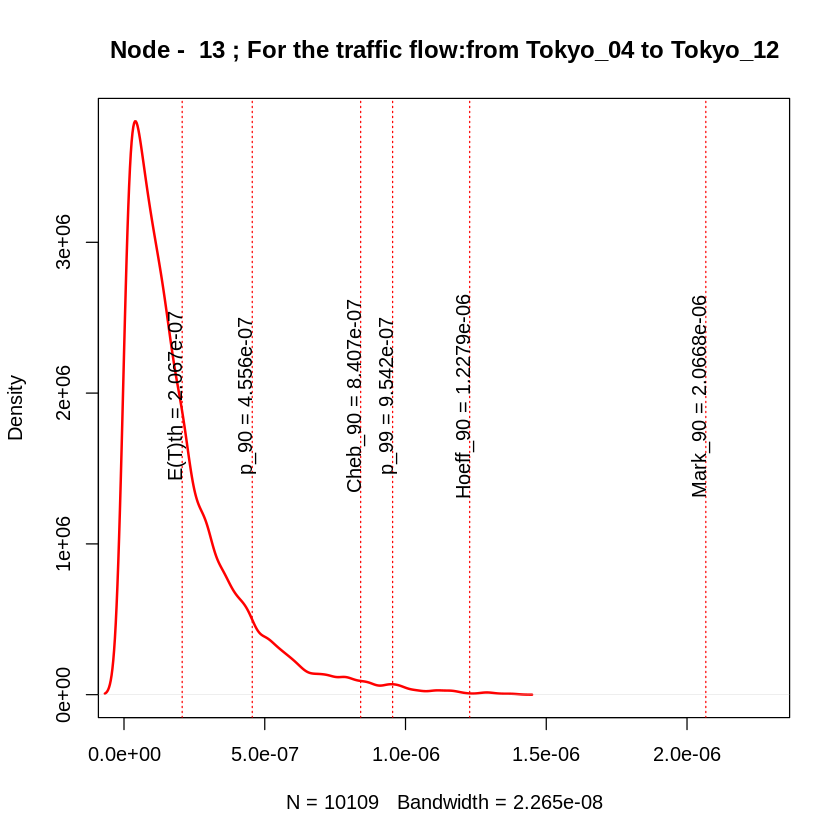

[1] 36
[1] "node_4"
[1] 159611404
[1] 0.5073199
[1] 46376474
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_13
[1] "traffic_Tokyo_04_Tokyo_13_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 1.74987091369148e-16"
[1] "sigma2= 1.32282686459396e-08"
[1] "igraph E(T) = 1.27166003287417e-08"
[1] "simmer E(T) = 1.27961082309199e-08"


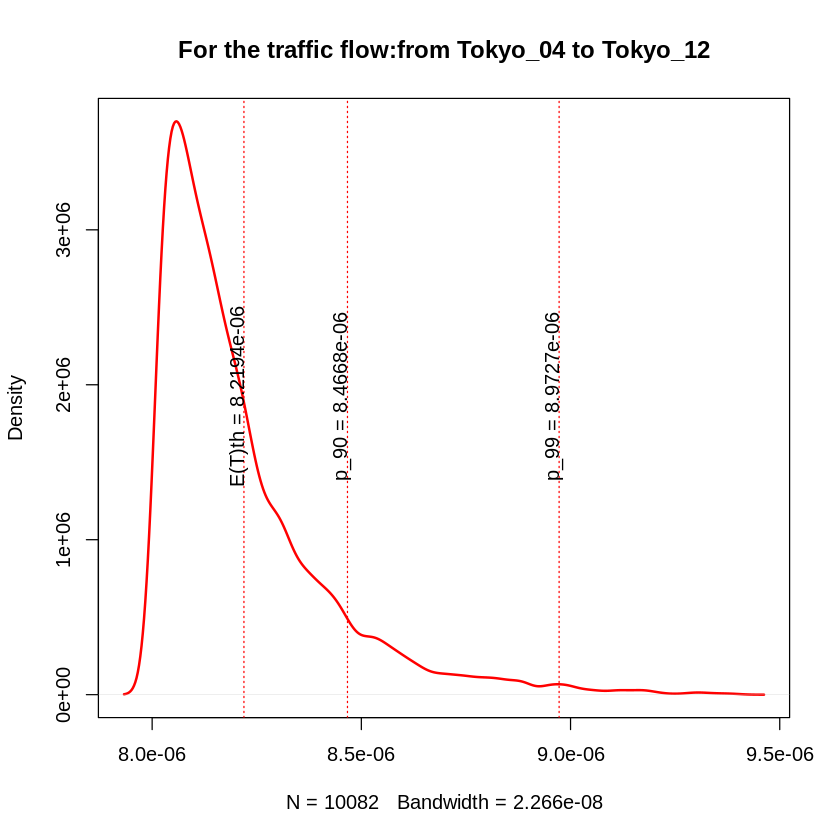

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_13
[1] "variance= 1.71367629618244e-16"
[1] "sigma2= 1.30907459534682e-08"
[1] "igraph E(T) = 4.01271660032874e-06"
[1] "simmer E(T) = 4.01279578615938e-06"


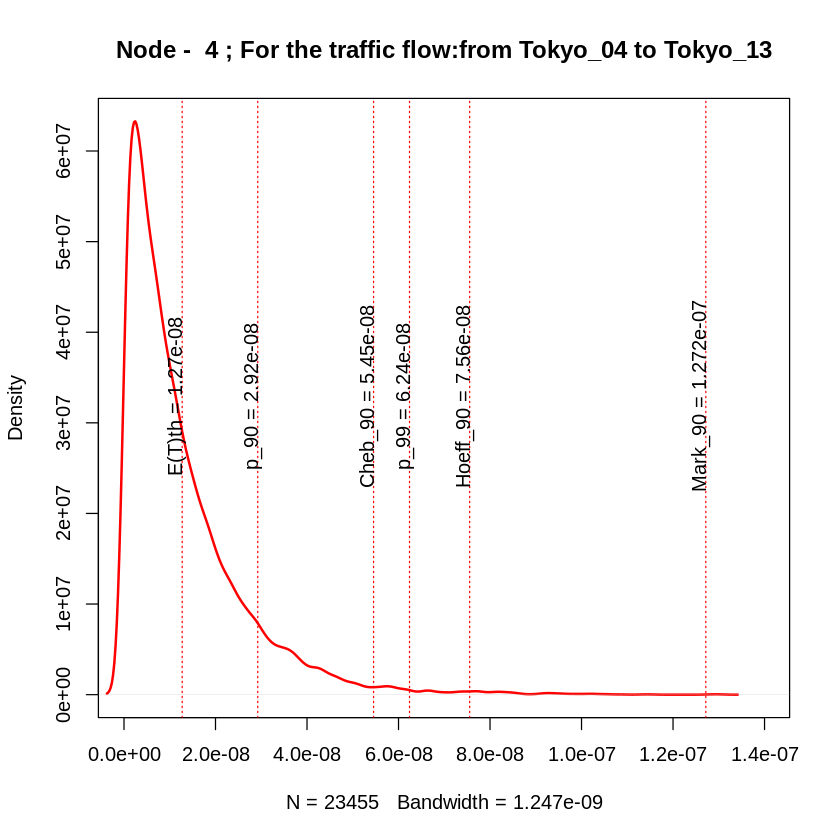

[1] 37
[1] "node_4"
[1] 197599713
[1] 0.4557914
[1] 50656381
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_14
[1] "traffic_Tokyo_04_Tokyo_14_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 1.00475163541897e-16"
[1] "sigma2= 1.00237300213991e-08"
[1] "igraph E(T) = 9.29925801179127e-09"
[1] "simmer E(T) = 9.67397067959976e-09"


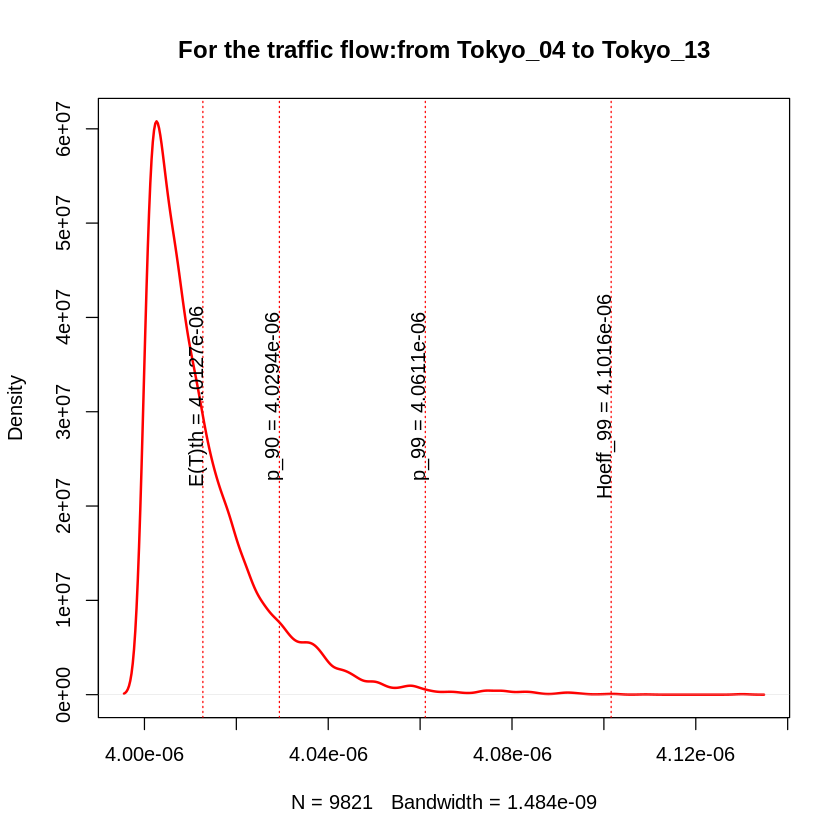

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_14
[1] "variance= 1.03815087148785e-16"
[1] "sigma2= 1.01889688952703e-08"
[1] "igraph E(T) = 3.00929925801179e-06"
[1] "simmer E(T) = 3.00976655774525e-06"


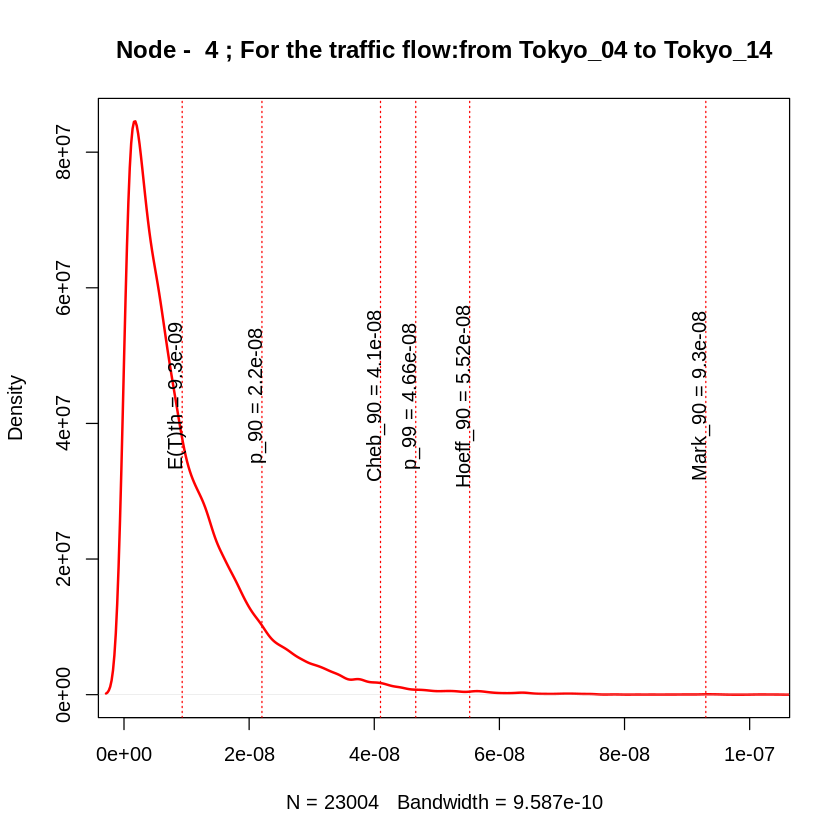

[1] 38
[1] "node_4"
[1] 197599713
[1] 0.4557914
[1] 77368417
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_14
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_14->Tokyo_15
[1] "traffic_Tokyo_04_Tokyo_15_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 9.55916448130084e-17"
[1] "sigma2= 9.77709797501326e-09"
[1] "igraph E(T) = 9.29925801179127e-09"
[1] "simmer E(T) = 9.49244062299124e-09"


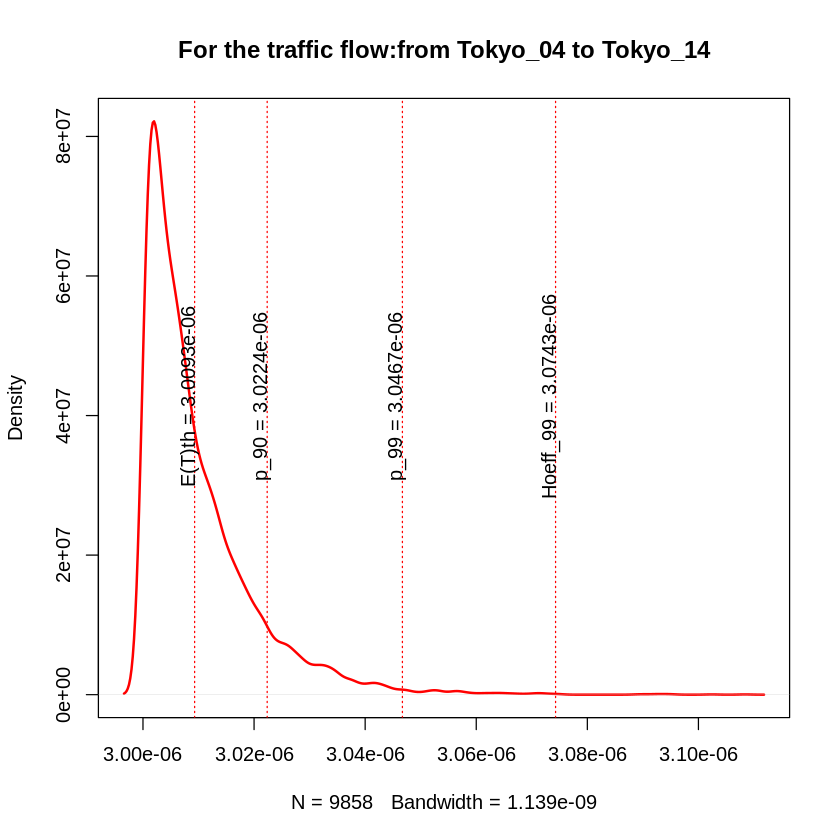

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_14
[1] 14
[1] "Node -  14 :"
[1] "variance= 6.14597439967183e-15"
[1] "sigma2= 7.83962652150715e-08"
[1] "igraph E(T) = 7.52086870351888e-08"
[1] "simmer E(T) = 7.45407871446665e-08"


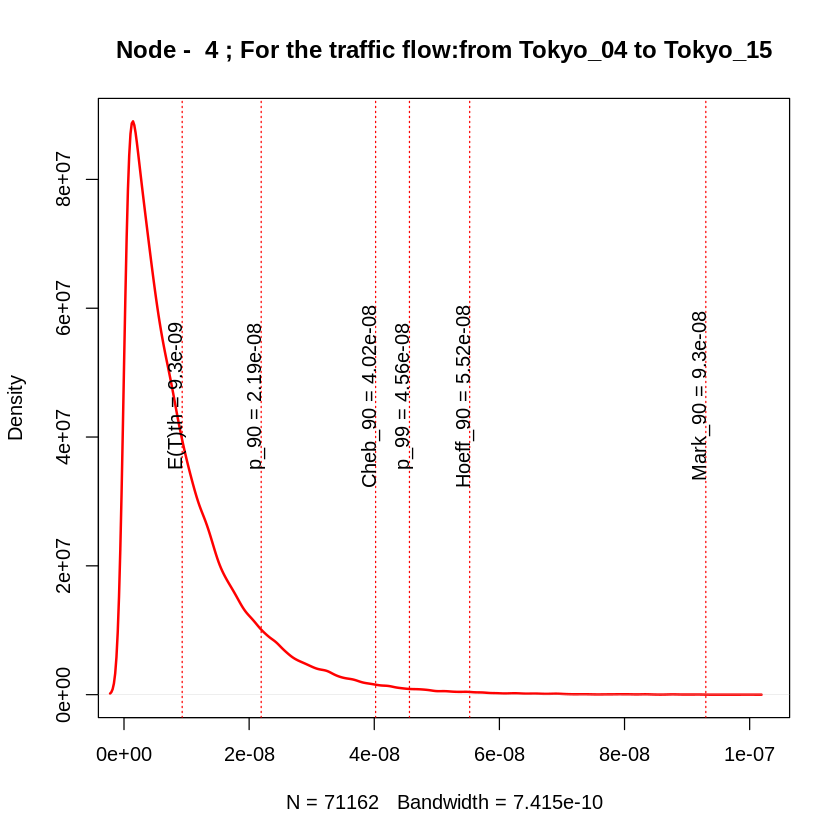

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_14->Tokyo_15
[1] "variance= 6.24965161058287e-15"
[1] "sigma2= 7.90547380653612e-08"
[1] "igraph E(T) = 6.08450794504698e-06"
[1] "simmer E(T) = 6.0838847156608e-06"


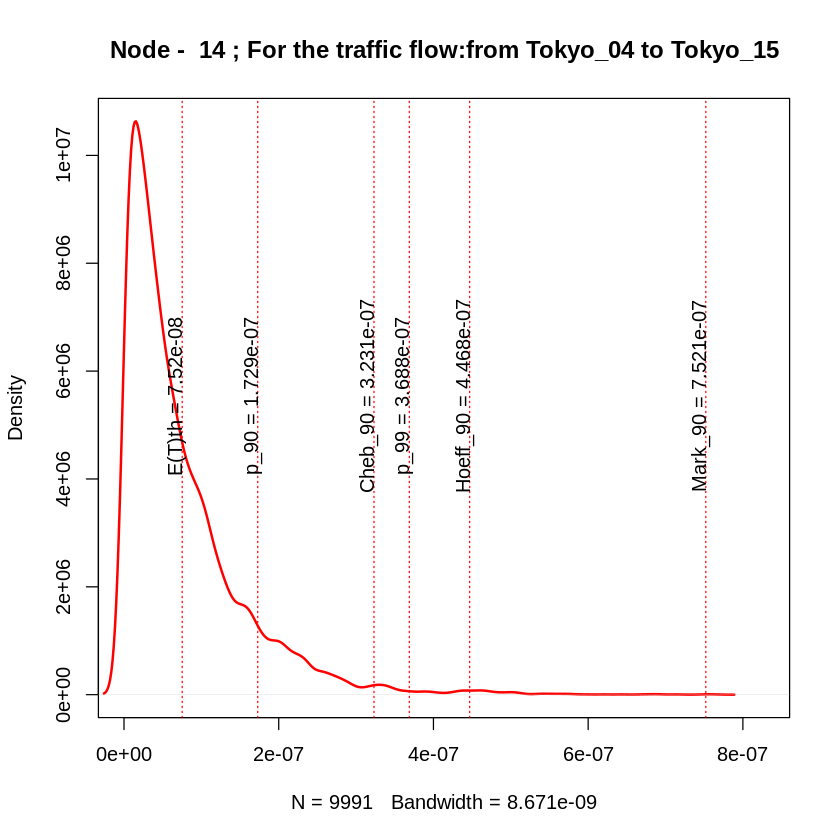

[1] 39
[1] "node_4"
[1] 214044149
[1] 0.4487968
[1] 70210788
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_16
[1] "traffic_Tokyo_04_Tokyo_16_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 7.06277663880726e-17"
[1] "sigma2= 8.40403274553786e-09"
[1] "igraph E(T) = 8.47588206861613e-09"
[1] "simmer E(T) = 8.37248508466981e-09"


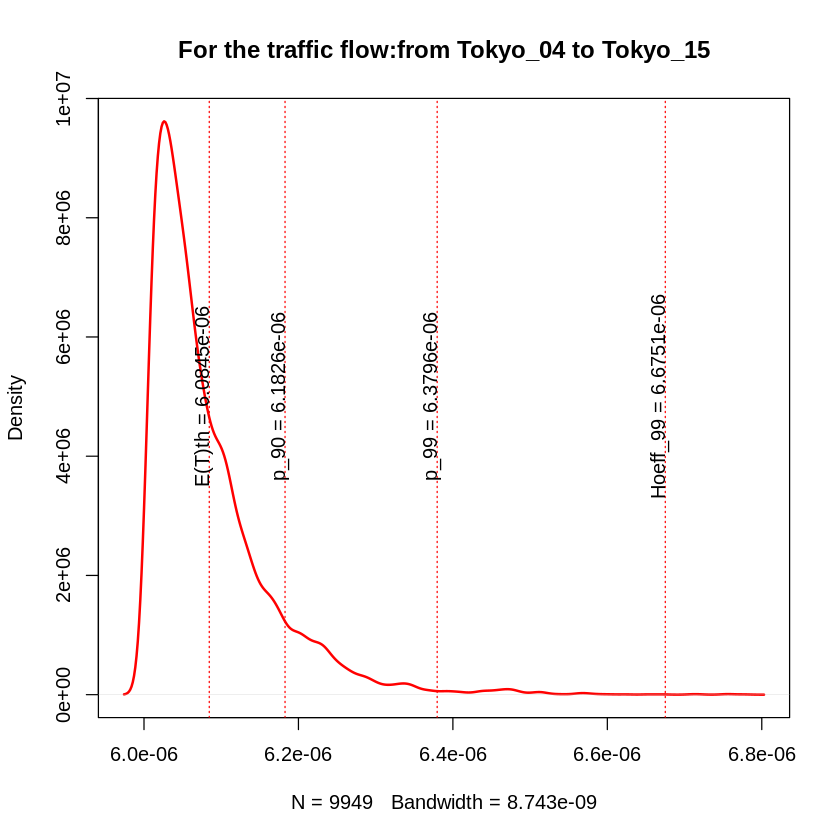

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_16
[1] "variance= 6.88018731731093e-17"
[1] "sigma2= 8.29468945609836e-09"
[1] "igraph E(T) = 3.00847588206862e-06"
[1] "simmer E(T) = 3.00831084320314e-06"


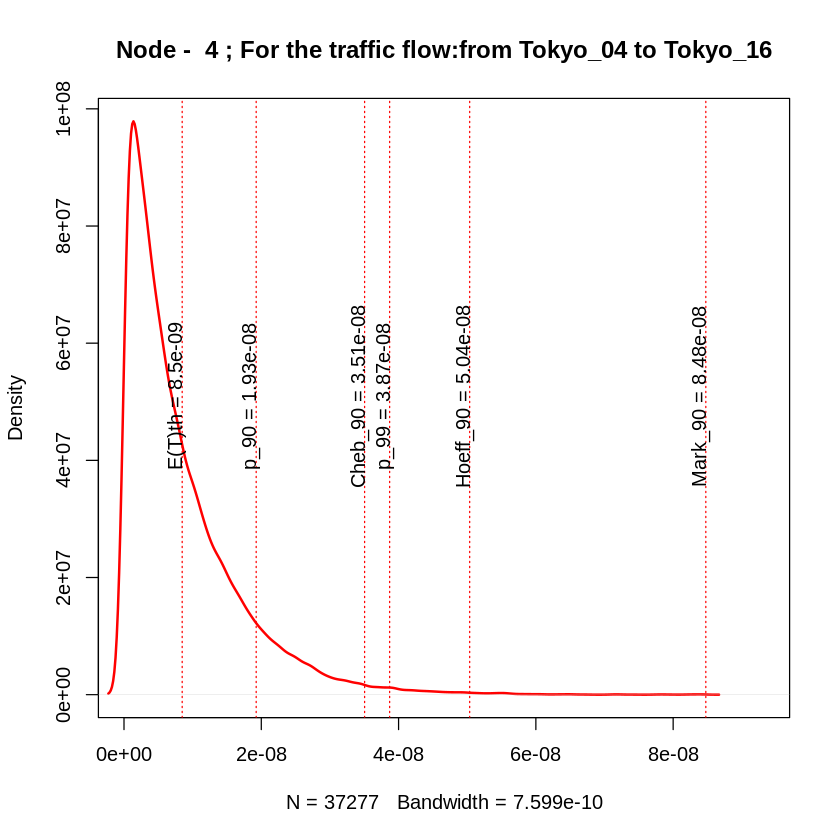

[1] 40
[1] "node_4"
[1] 214044149
[1] 0.4487968
[1] 70106400
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_16
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_16->Tokyo_17
[1] "traffic_Tokyo_04_Tokyo_17_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 8.01047616287009e-17"
[1] "sigma2= 8.9501263470803e-09"
[1] "igraph E(T) = 8.47588206861613e-09"
[1] "simmer E(T) = 8.88101482119759e-09"


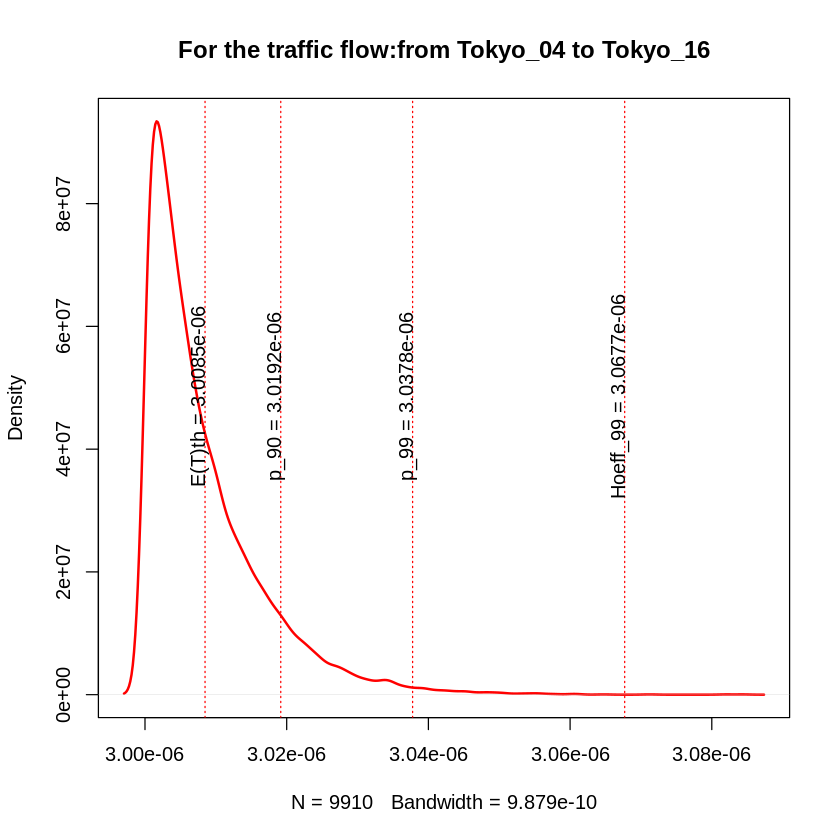

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_16
[1] 16
[1] "Node -  16 :"
[1] "variance= 6.10259684083902e-15"
[1] "sigma2= 7.81191195600604e-08"
[1] "igraph E(T) = 7.39639043821475e-08"
[1] "simmer E(T) = 7.88328333862334e-08"


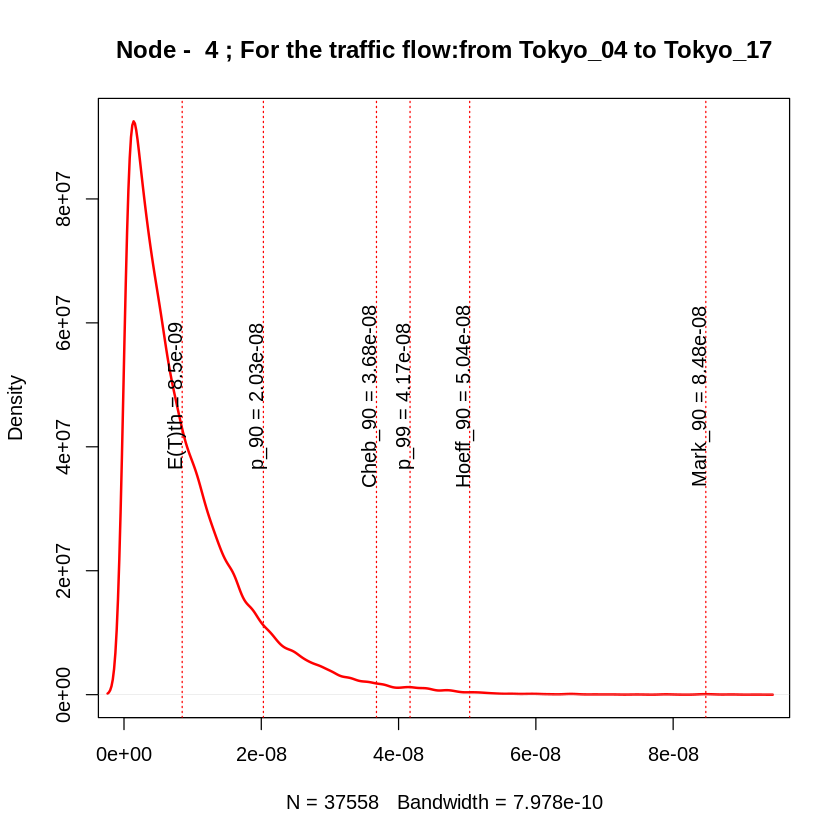

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_16->Tokyo_17
[1] "variance= 6.20277169718719e-15"
[1] "sigma2= 7.87576770682528e-08"
[1] "igraph E(T) = 5.08243978645076e-06"
[1] "simmer E(T) = 5.08779062172573e-06"


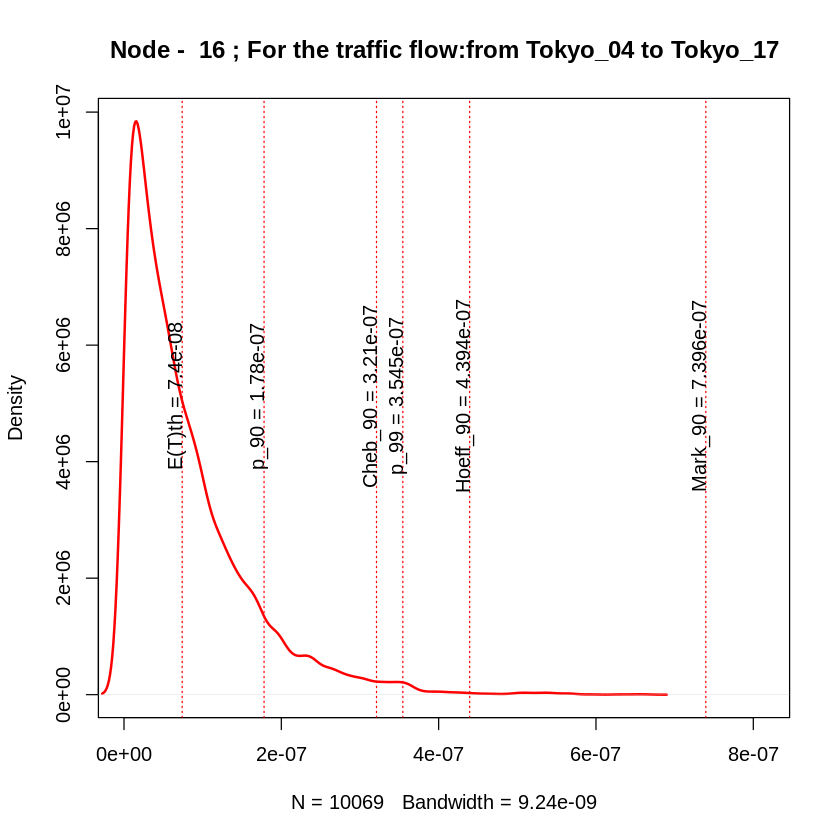

[1] 41
[1] "node_5"
[1] 136337502
[1] 0.4082409
[1] 11567316
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_05->Tokyo_18
[1] "traffic_Tokyo_05_Tokyo_18_"
[1] 5
[1] "Node -  5 :"
[1] "variance= 1.68207455634229e-16"
[1] "sigma2= 1.29694817026059e-08"
[1] "igraph E(T) = 1.23948049757248e-08"
[1] "simmer E(T) = 1.26772996361866e-08"


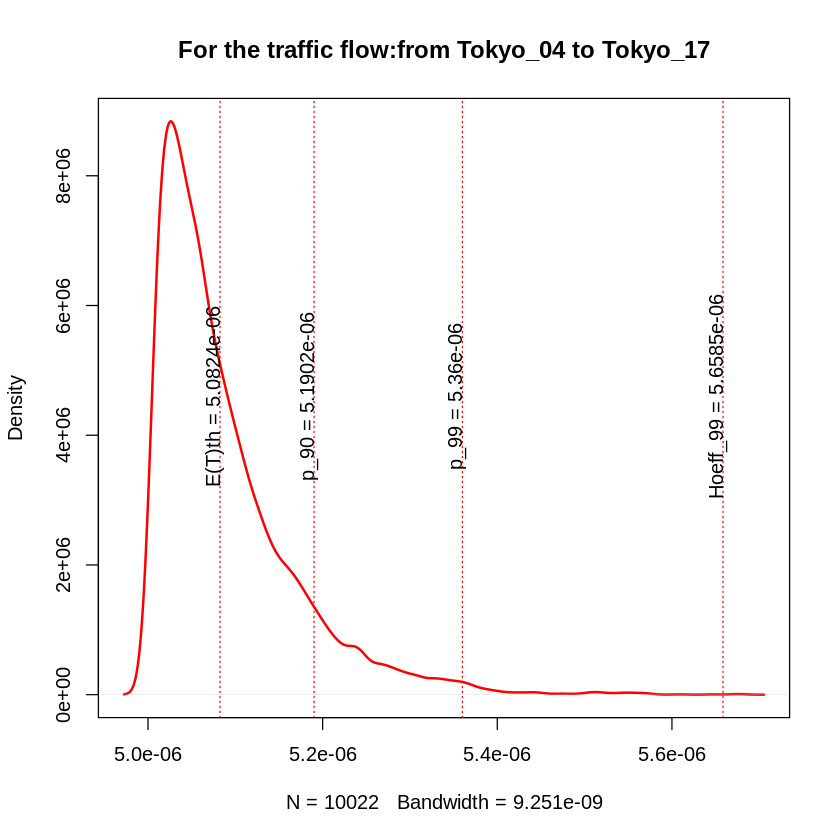

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_05->Tokyo_18
[1] "variance= 1.69949517664153e-16"
[1] "sigma2= 1.3036468757457e-08"
[1] "igraph E(T) = 3.01239480497572e-06"
[1] "simmer E(T) = 3.01275187629145e-06"


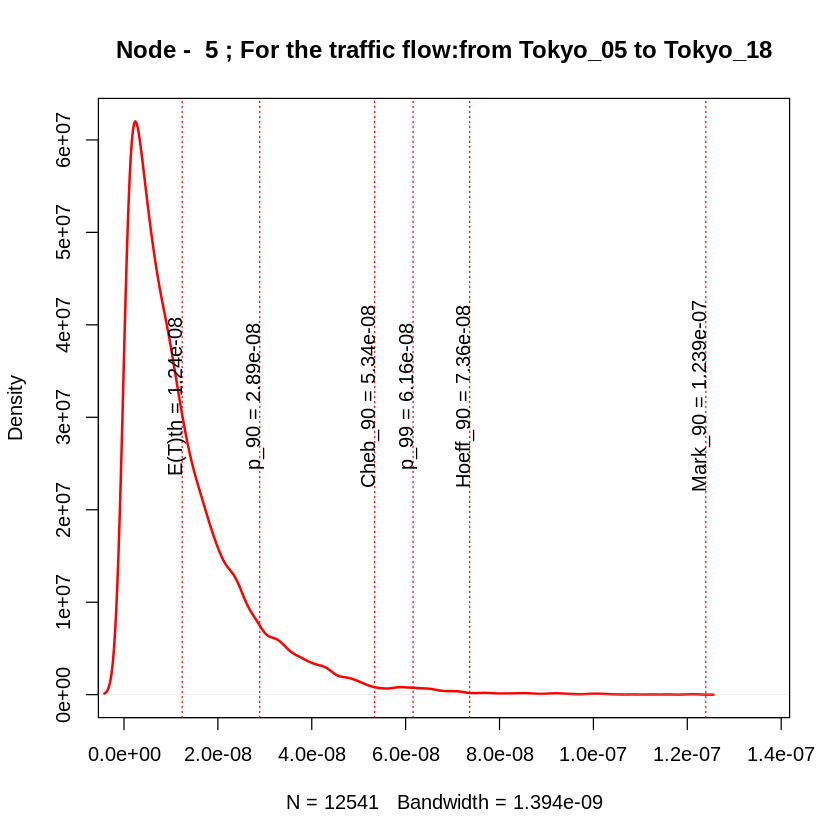

[1] 42
[1] "node_4"
[1] 214044149
[1] 0.4487968
[1] 51807470
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_16
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_16->Tokyo_19
[1] "traffic_Tokyo_04_Tokyo_19_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 7.97728623582561e-17"
[1] "sigma2= 8.93156550433663e-09"
[1] "igraph E(T) = 8.47588206861613e-09"
[1] "simmer E(T) = 8.65618678545287e-09"


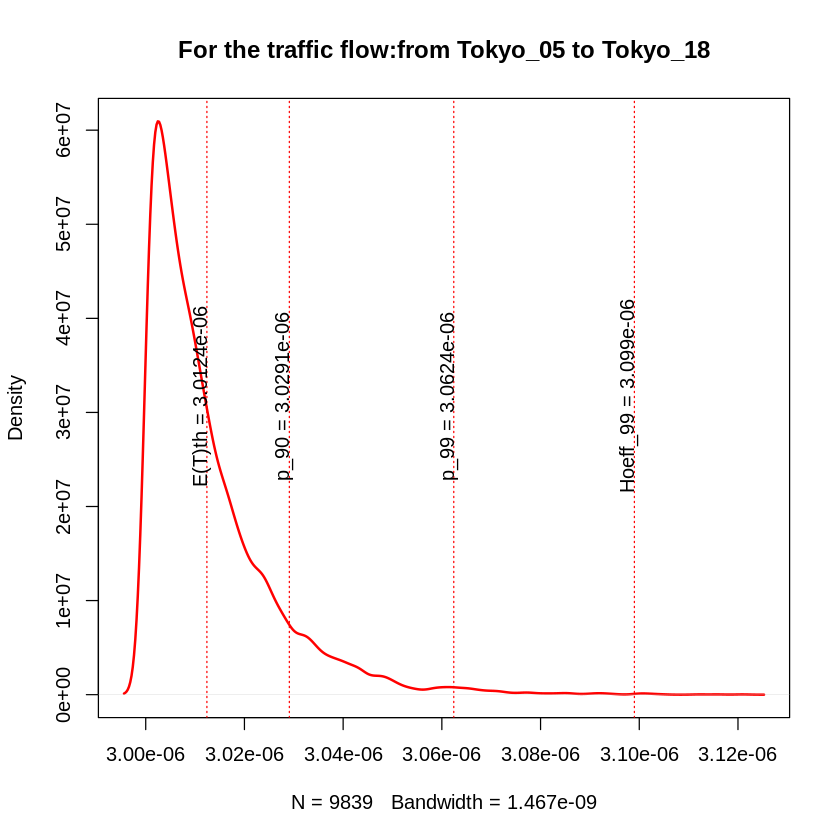

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_16
[1] 16
[1] "Node -  16 :"
[1] "variance= 5.6405126205076e-16"
[1] "sigma2= 2.37497634104165e-08"
[1] "igraph E(T) = 2.24451195463521e-08"
[1] "simmer E(T) = 2.29301495178355e-08"


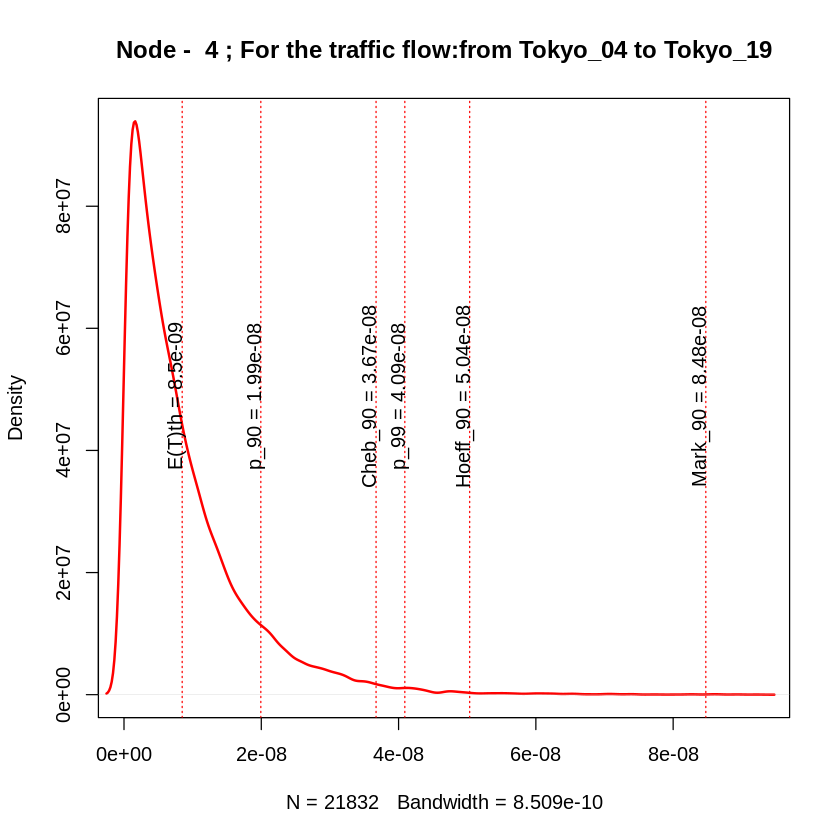

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_16->Tokyo_19
[1] "variance= 6.69601346261558e-16"
[1] "sigma2= 2.58766563964813e-08"
[1] "igraph E(T) = 5.03092100161497e-06"
[1] "simmer E(T) = 5.03169567391838e-06"


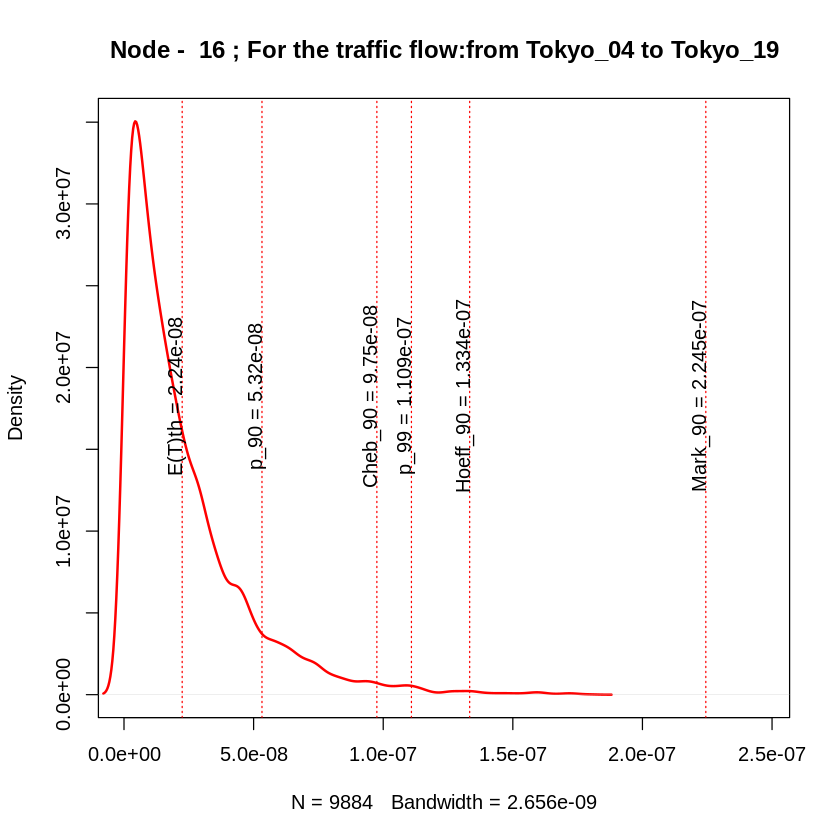

[1] 43
[1] "node_4"
[1] 197599713
[1] 0.4557914
[1] 52103706
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_14
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_14->Tokyo_20
[1] "traffic_Tokyo_04_Tokyo_20_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 8.94235040144884e-17"
[1] "sigma2= 9.45640016150376e-09"
[1] "igraph E(T) = 9.29925801179127e-09"
[1] "simmer E(T) = 9.4486140805078e-09"


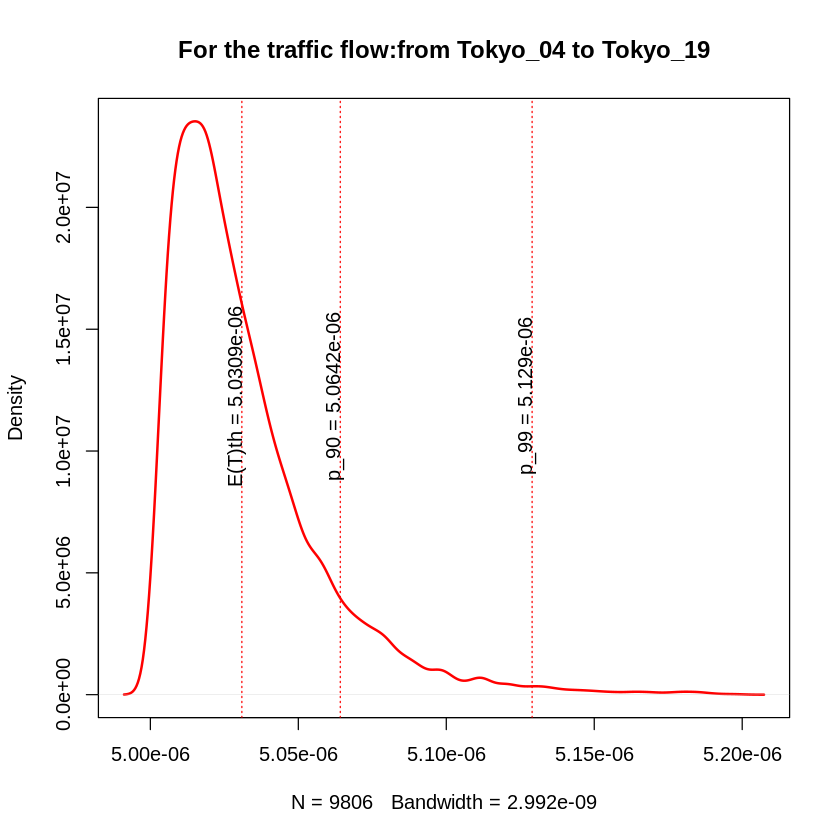

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_04->Tokyo_14
[1] 14
[1] "Node -  14 :"
[1] "variance= 4.38605655919813e-16"
[1] "sigma2= 2.09429142174582e-08"
[1] "igraph E(T) = 2.25455025717079e-08"
[1] "simmer E(T) = 2.12877471633494e-08"


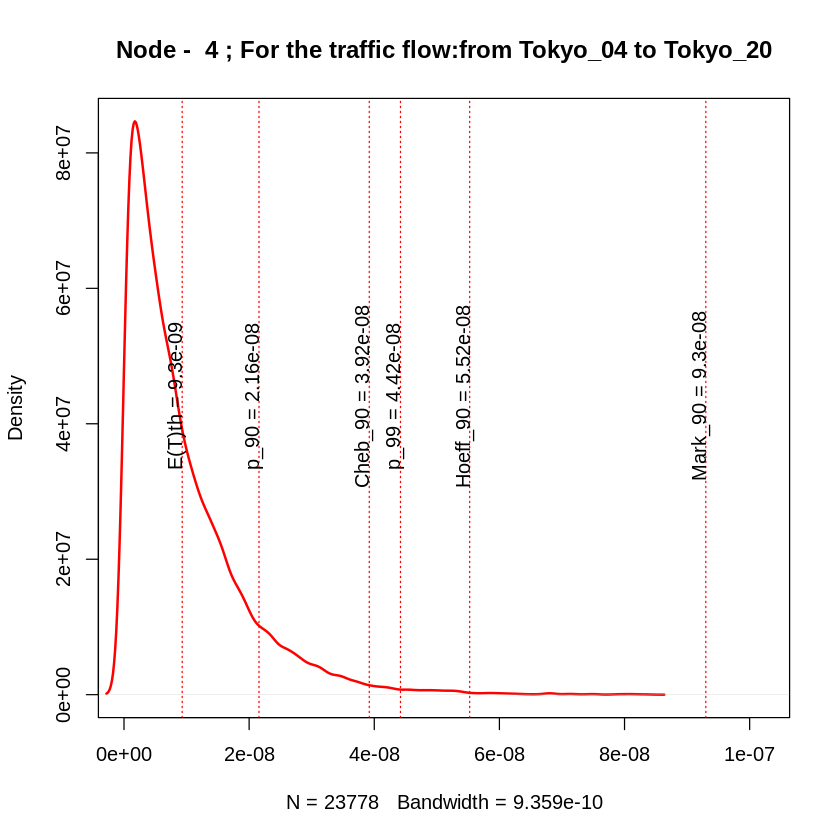

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_14->Tokyo_20
[1] "variance= 5.30805187796222e-16"
[1] "sigma2= 2.30392097910545e-08"
[1] "igraph E(T) = 6.0318447605835e-06"
[1] "simmer E(T) = 6.03070359518012e-06"


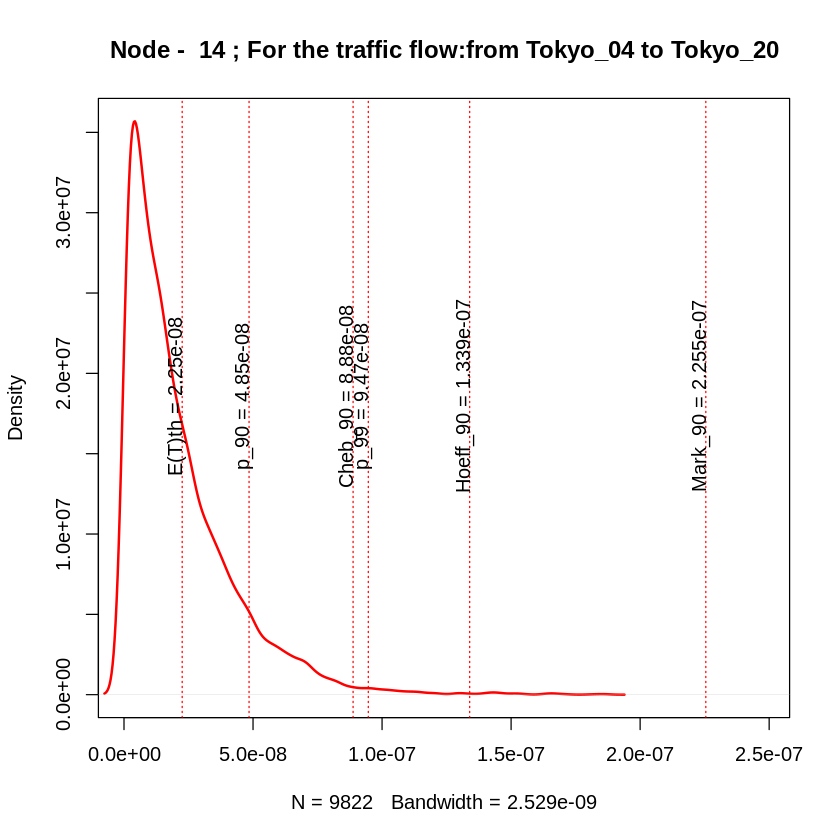

[1] 44
[1] "node_5"
[1] 136337502
[1] 0.4082409
[1] 44091224
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_05->Tokyo_18
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_18->Tokyo_21
[1] "traffic_Tokyo_05_Tokyo_21_"
[1] 5
[1] "Node -  5 :"
[1] "variance= 1.65627357932345e-16"
[1] "sigma2= 1.28696292849617e-08"
[1] "igraph E(T) = 1.23948049757248e-08"
[1] "simmer E(T) = 1.2667120357365e-08"


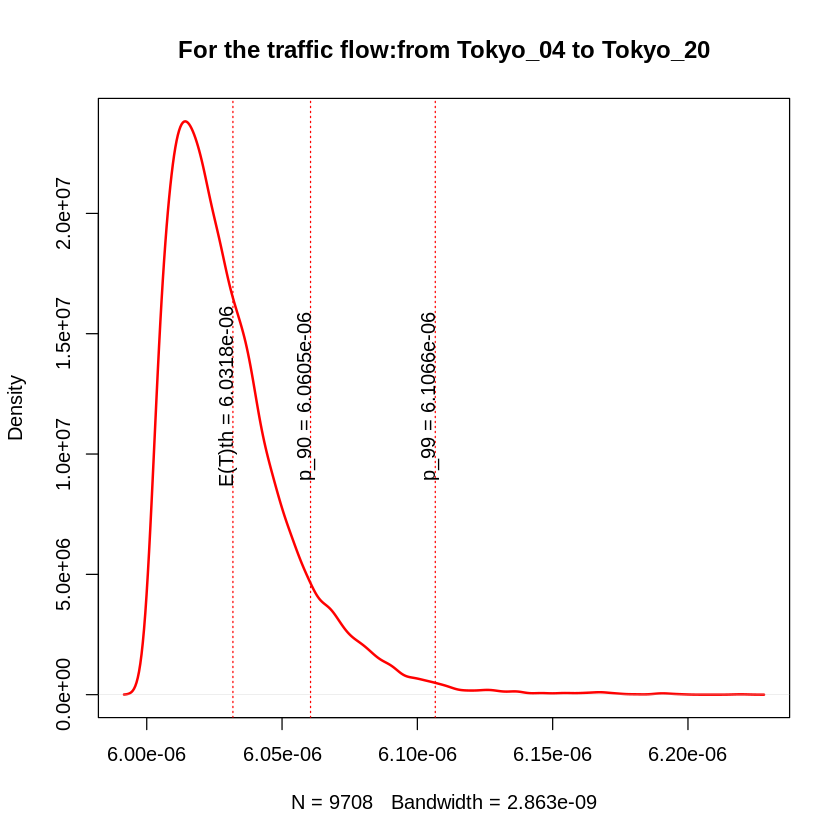

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_05->Tokyo_18
[1] 18
[1] "Node -  18 :"
[1] "variance= 3.54976327425608e-15"
[1] "sigma2= 5.9579889847633e-08"
[1] "igraph E(T) = 5.86491123889505e-08"
[1] "simmer E(T) = 5.93708660044588e-08"


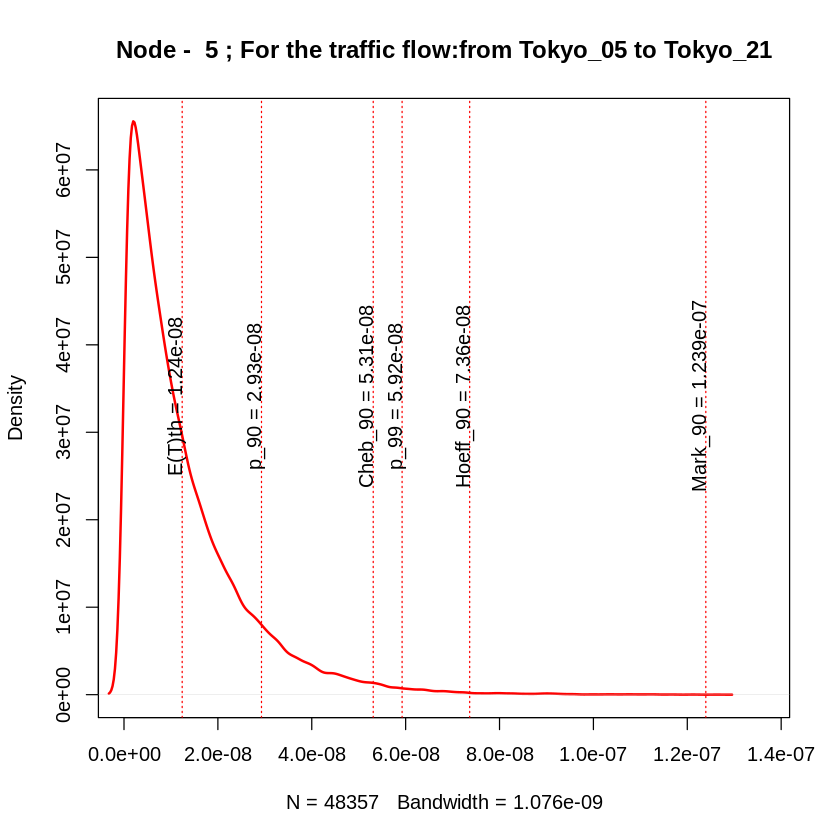

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_18->Tokyo_21
[1] "variance= 3.75930200147634e-15"
[1] "sigma2= 6.1313147052458e-08"
[1] "igraph E(T) = 6.07104391736467e-06"
[1] "simmer E(T) = 6.07206396796305e-06"


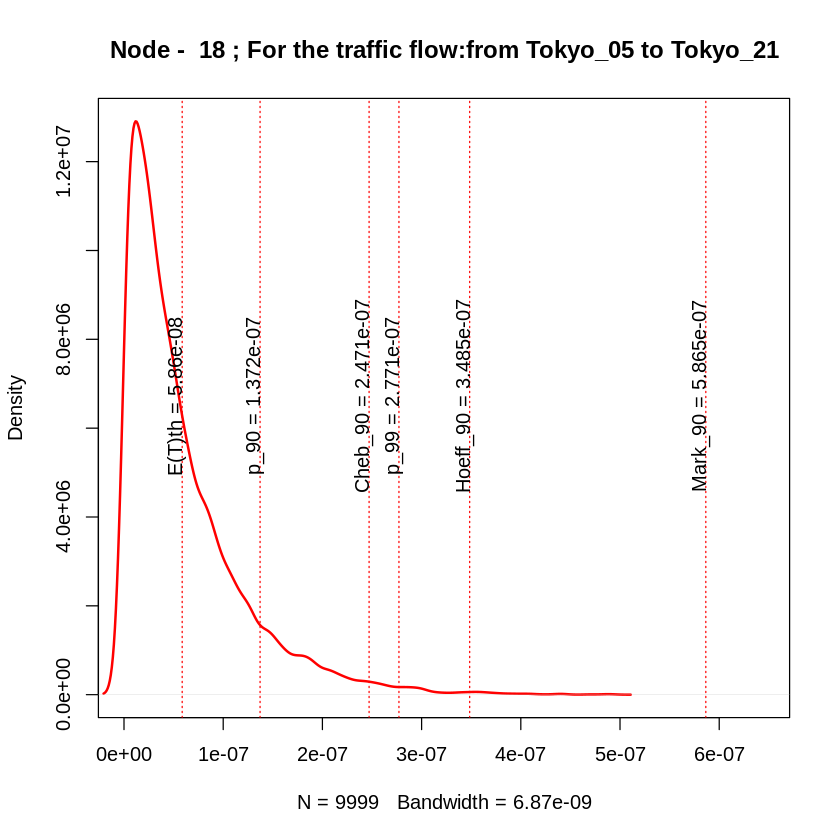

[1] 45
[1] "node_1"
[1] 214710133
[1] 0.4925013
[1] 61650974
[1] "node_6"
[1] 139109649
[1] 0.4749225
[1] 21972258
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_06
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_07
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_07->Tokyo_22
[1] "traffic_Tokyo_01_Tokyo_22_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 8.27135284186788e-17"
[1] "sigma2= 9.09469781898656e-09"
[1] "igraph E(T) = 9.17724912671743e-09"
[1] "simmer E(T) = 9.12220459837086e-09"


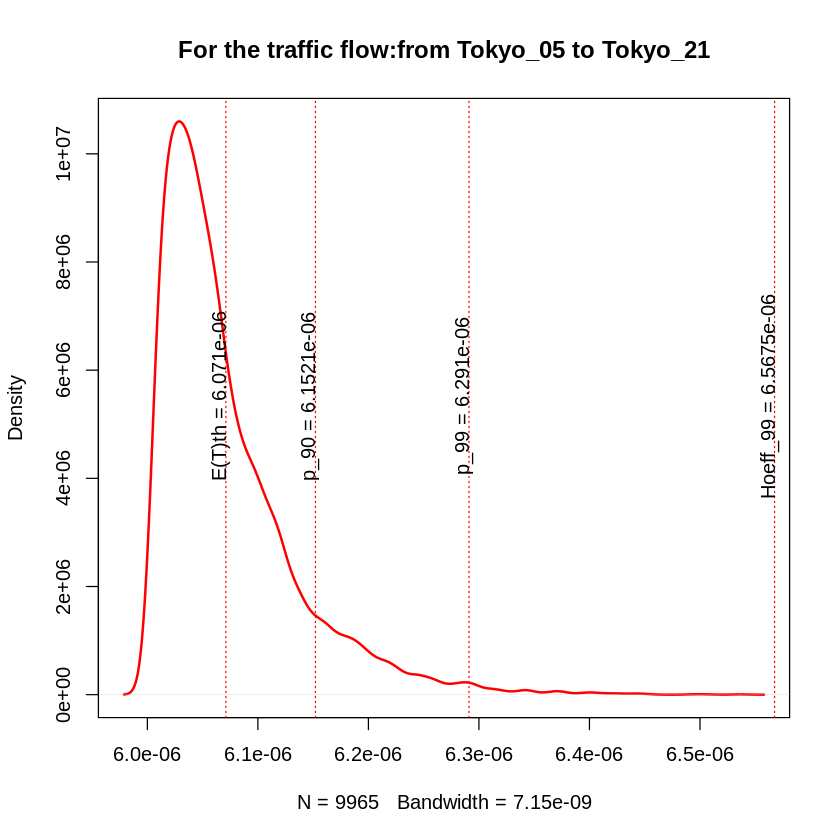

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_06
[1] 6
[1] "Node -  6 :"
[1] "variance= 1.73587859709053e-16"
[1] "sigma2= 1.31752745591526e-08"
[1] "igraph E(T) = 1.36905009844813e-08"
[1] "simmer E(T) = 1.31549275441629e-08"


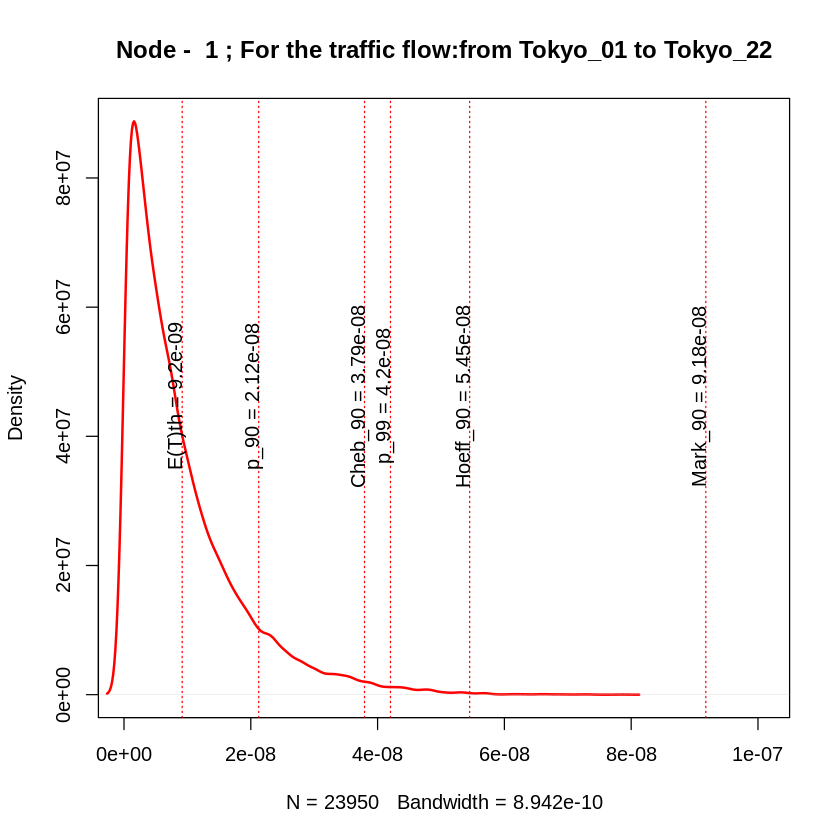

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_06->Tokyo_07
[1] 7
[1] "Node -  7 :"
[1] "variance= 4.61767835641625e-16"
[1] "sigma2= 2.14887839498103e-08"
[1] "igraph E(T) = 2.17126878424888e-08"
[1] "simmer E(T) = 2.18540536153743e-08"


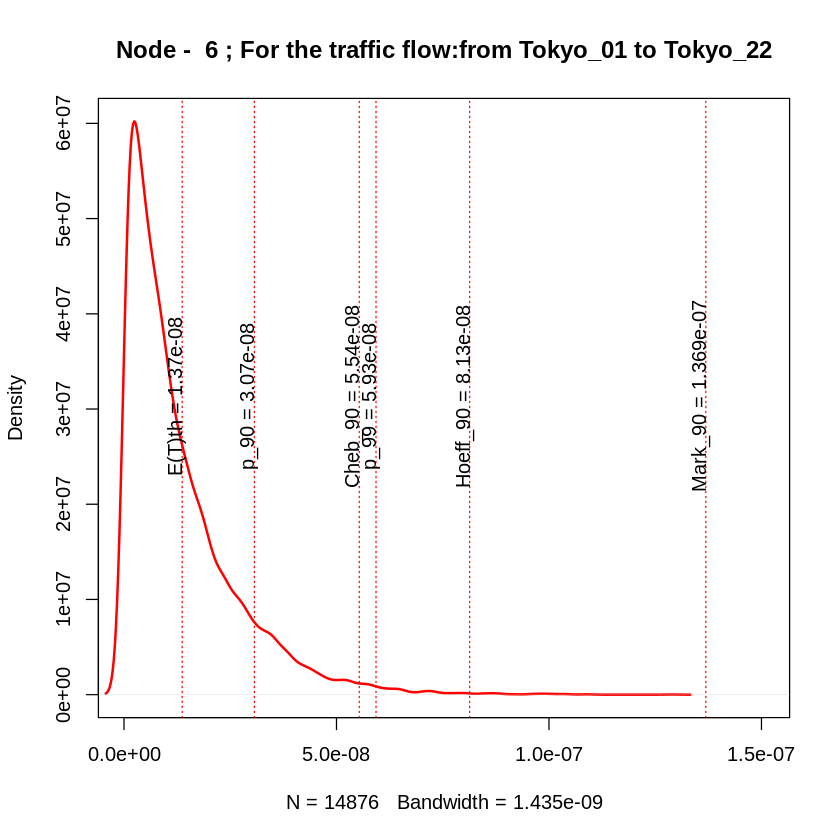

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_07->Tokyo_22
[1] "variance= 7.12546311427868e-16"
[1] "sigma2= 2.66935631085074e-08"
[1] "igraph E(T) = 1.20445804379537e-05"
[1] "simmer E(T) = 1.20439467559104e-05"


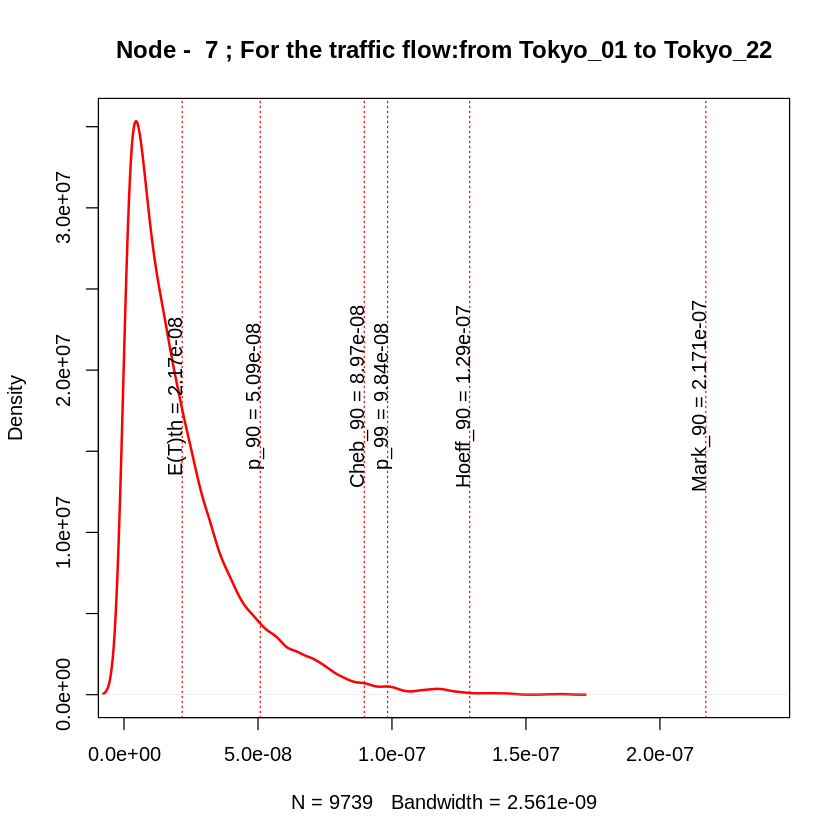

[1] 46
[1] "node_1"
[1] 165147444
[1] 0.4834118
[1] 67138396
[1] "node_2"
[1] 112529308
[1] 0.4352691
[1] 36284696
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_02
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_02->Tokyo_08
+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_08->Tokyo_23
[1] "traffic_Tokyo_01_Tokyo_23_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.37329491707618e-16"
[1] "sigma2= 1.17187666461799e-08"
[1] "igraph E(T) = 1.1721513636851e-08"
[1] "simmer E(T) = 1.17389572377119e-08"


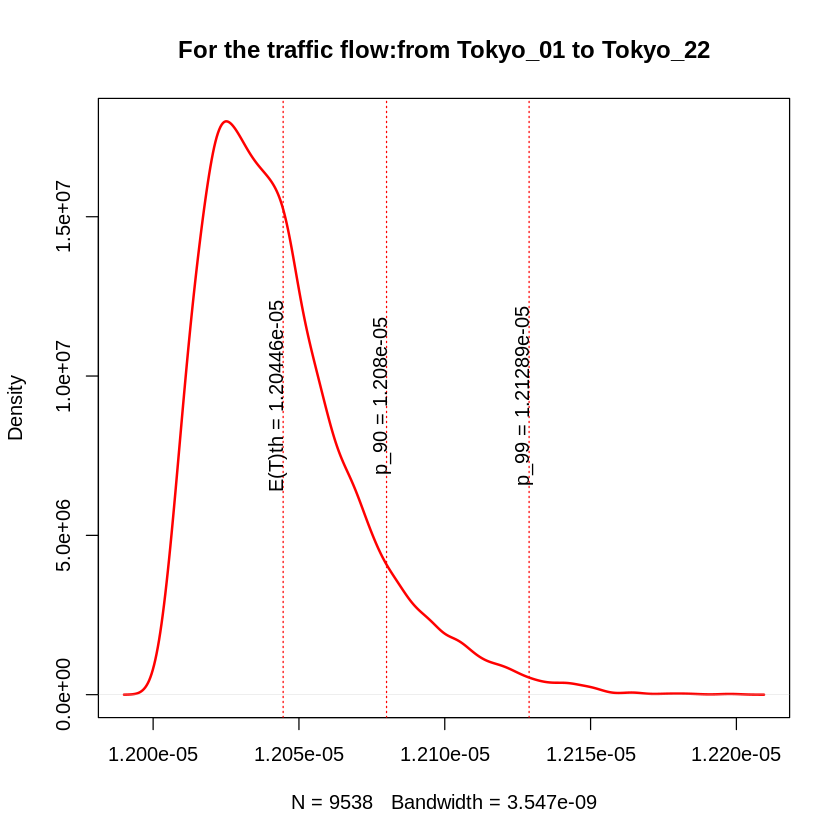

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_01->Tokyo_02
[1] 2
[1] "Node -  2 :"
[1] "variance= 2.66615804230462e-16"
[1] "sigma2= 1.63283742065909e-08"
[1] "igraph E(T) = 1.57359439796034e-08"
[1] "simmer E(T) = 1.58684890770952e-08"


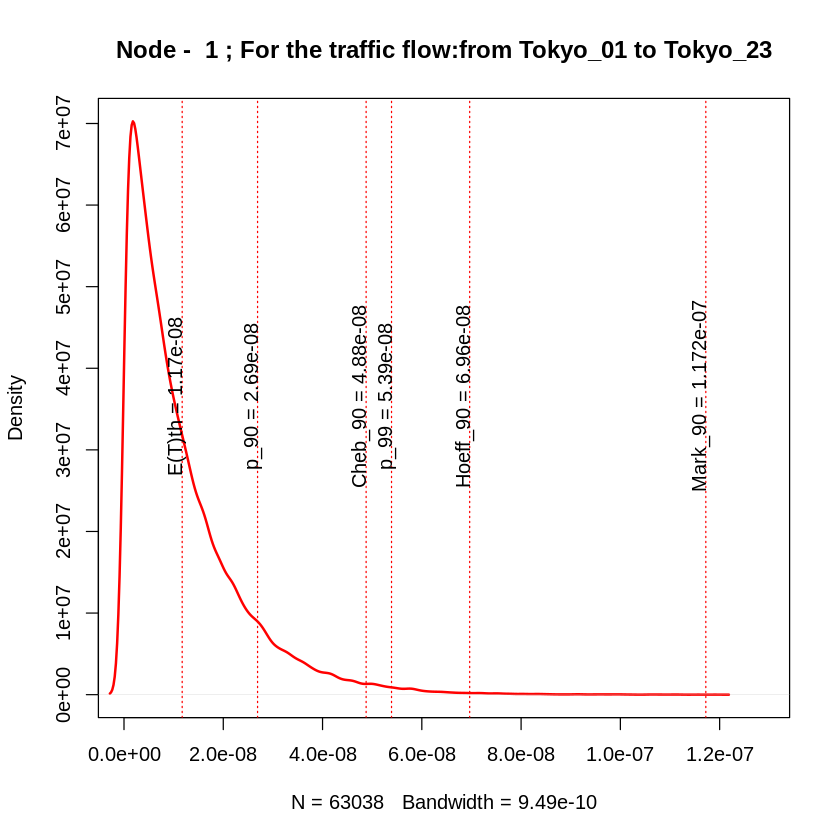

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_02->Tokyo_08
[1] 8
[1] "Node -  8 :"
[1] "variance= 1.92160802877211e-14"
[1] "sigma2= 1.38622077201725e-07"
[1] "igraph E(T) = 1.3951116094309e-07"
[1] "simmer E(T) = 1.36691583919205e-07"


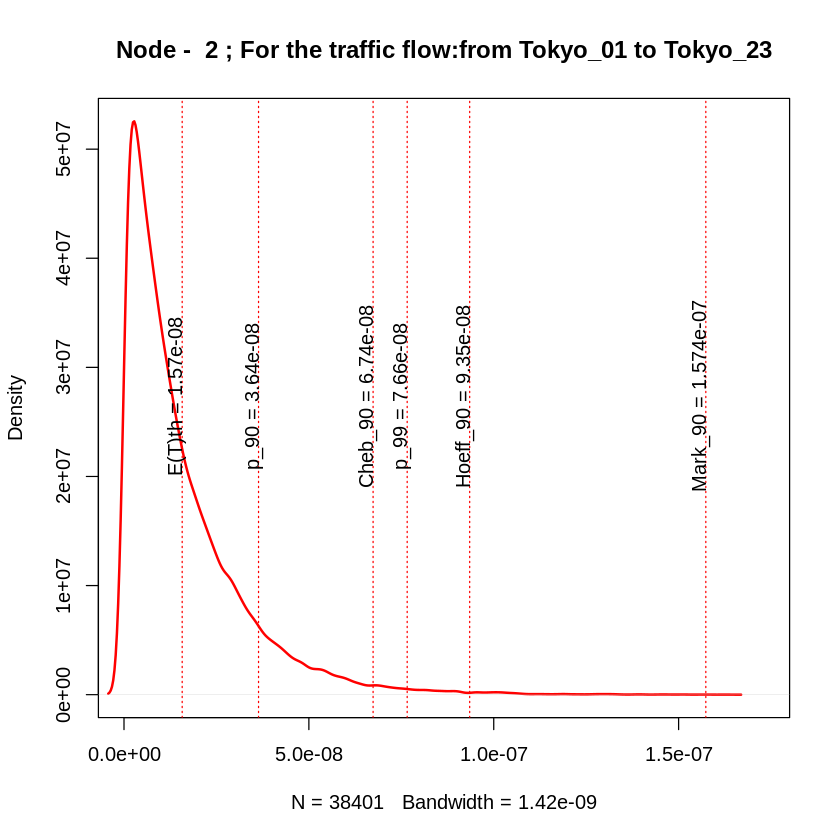

+ 1/86 edge from ac832c8 (vertex names):
[1] Tokyo_08->Tokyo_23
[1] "variance= 1.97840799267751e-14"
[1] "sigma2= 1.40655891902099e-07"
[1] "igraph E(T) = 1.51669686185595e-05"
[1] "simmer E(T) = 1.51648692227517e-05"


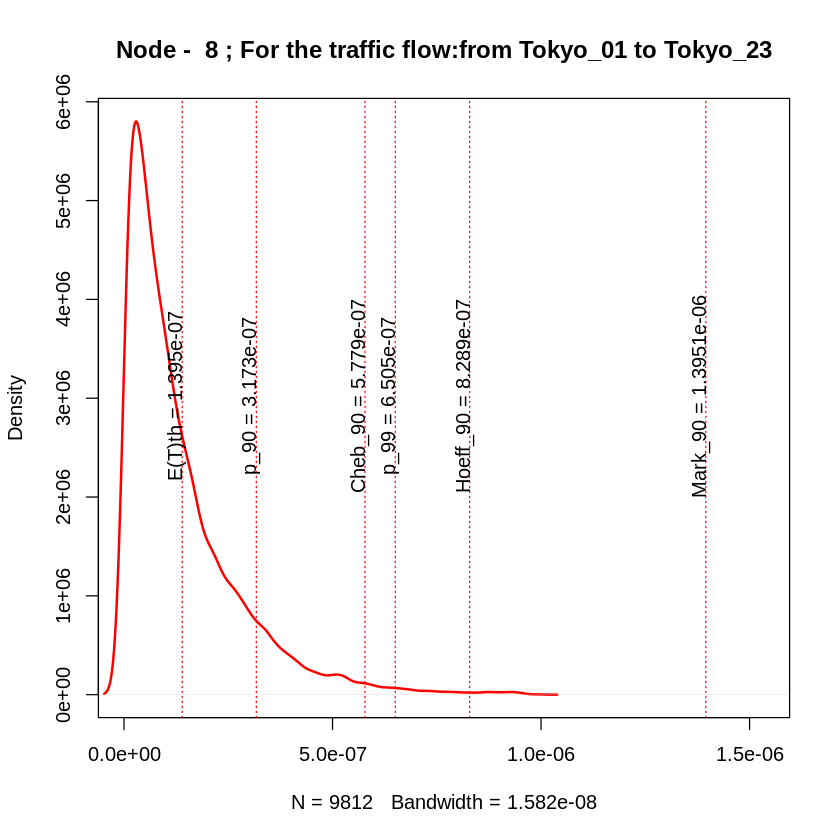

[1] "igraph E(T) = 1.0240292263755e-08"
[1] "simmer E(T) = 1.0155589523348e-08"


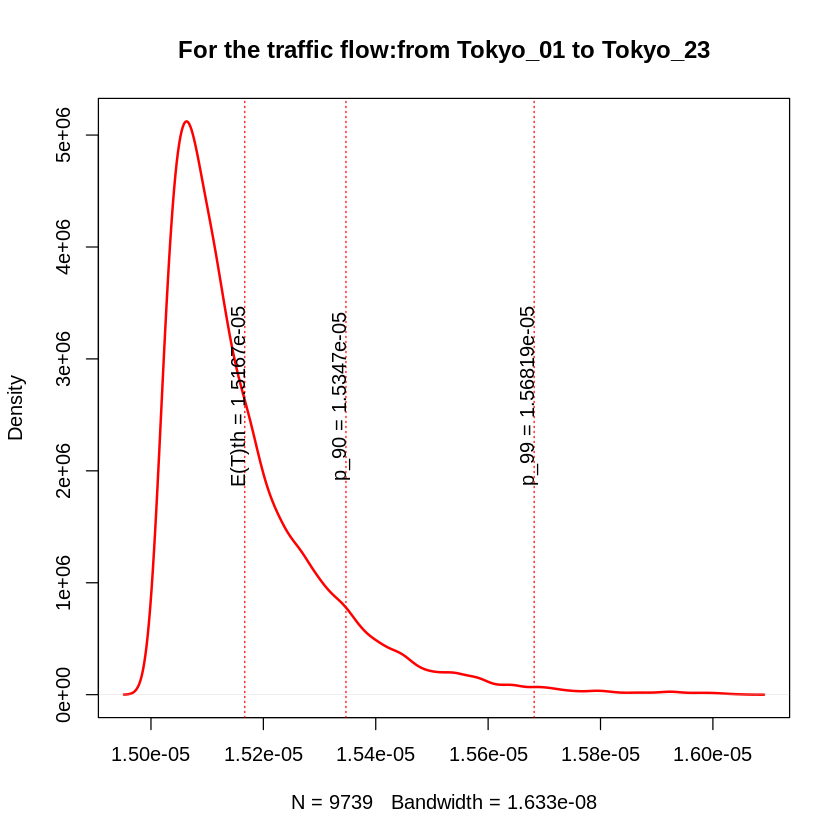

In [71]:
c(traffic_file$Delay_sim_s, traffic_file$Delay_th_s, traffic_file$D99_sim_s, traffic_file$Hoeff_99th_s, g) := simulation_simmer(g, traffic_file)

print(paste("igraph E(T) =", mean(E(g)$Queue_Delay)))
print(paste("simmer E(T) =", mean(E(g)$Queue_Delay_sim)))

#Output table of traffic flows with delays: theoretic, simulated average packet delay and D.99

In [72]:
traffic_file

sourceID,destinationID,trafficGbps,service,traffic_ps,Delay_sim_s,Delay_th_s,D99_sim_s,Hoeff_99th_s
<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Tokyo_01,Tokyo_01,0.000,CWB,0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Tokyo_02,Tokyo_01,2263.752,CWB,277683298,5.002260e-06,5.002074e-06,5.012758e-06,5.016569e-06
Tokyo_03,Tokyo_01,848.700,CWB,104105845,5.002466e-06,5.002485e-06,5.011689e-06,5.019851e-06
Tokyo_04,Tokyo_04,5375.376,CWB,659370875,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Tokyo_05,Tokyo_05,1371.375,CWB,168219811,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
Tokyo_06,Tokyo_01,2911.248,CWB,357108441,4.000703e-06,4.000685e-06,4.003138e-06,4.005474e-06
Tokyo_07,Tokyo_01,1612.116,CWB,197750323,8.001725e-06,8.001729e-06,8.005700e-06,8.010452e-06
Tokyo_08,Tokyo_01,2662.227,CWB,326562262,1.000477e-05,1.000470e-05,1.001655e-05,1.002809e-05
Tokyo_09,Tokyo_01,443.394,CWB,54388956,1.000478e-05,1.000471e-05,1.001636e-05,1.002802e-05


#Calculation of delays for different capacities

In [73]:
c(g_c10_dg_l05, data_av_c10_dg_l05, data_99_c10_dg_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 10, calc_dist = 0, distance = 5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)


In [74]:
c(g_c10_dg_l05, data_av_c10_dg_l05, data_99_c10_dg_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 10, calc_dist = 0, distance = 5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)
c(g_c40_dg_l05, data_av_c40_dg_l05, data_99_c40_dg_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 40, calc_dist = 0,  distance = 5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)
c(g_c100_dg_l05, data_av_c100_dg_l05, data_99_c100_dg_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 0,  distance = 5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)
c(g_c400_dg_l05, data_av_c400_dg_l05, data_99_c400_dg_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 400, calc_dist = 0,  distance = 5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)


#Calculation of delays for different distances

In [75]:
c(g_c100_d05g_l05, data_av_c100_d05g_l05, data_99_c100_d05g_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 1, distance = 0.5, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)
c(g_c100_d2g_l05, data_av_c100_d2g_l05, data_99_c100_d2g_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 1, distance = 2, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)
c(g_c100_d4g_l05, data_av_c100_d4g_l05, data_99_c100_d4g_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 1, distance = 4, Load_local = 0.5, Load_regional = 0.6, Load_national = 0.5, prefix_base, national_nodes, regional_nodes, N)


#Boxplots

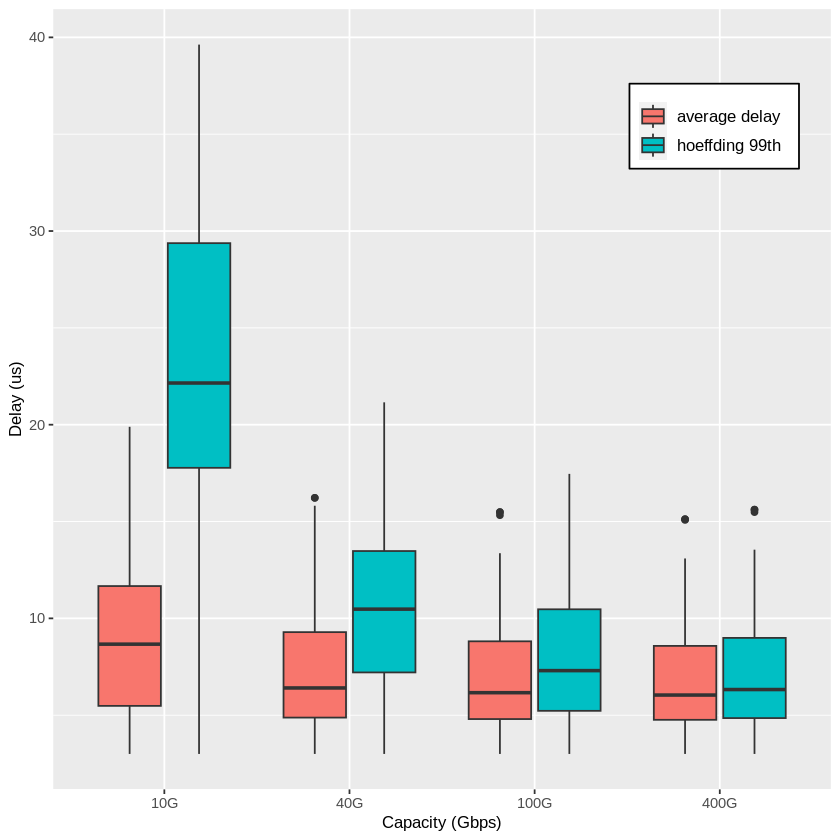

In [76]:
df_plot_capacity <- data.frame(capacity = c(rep("10G", length(data_99_c10_dg_l05)),
                                            rep("40G", length(data_99_c40_dg_l05)),
                                            rep("100G", length(data_99_c100_dg_l05)),
                                            rep("400G", length(data_99_c400_dg_l05)),
                                            rep("10G", length(data_av_c10_dg_l05)),
                                            rep("40G", length(data_av_c40_dg_l05)),
                                            rep("100G", length(data_av_c100_dg_l05)),
                                            rep("400G", length(data_av_c400_dg_l05))),
                               value = c(data_99_c10_dg_l05,
                                         data_99_c40_dg_l05,
                                         data_99_c100_dg_l05,
                                         data_99_c400_dg_l05,
                                         data_av_c10_dg_l05,
                                         data_av_c40_dg_l05,
                                         data_av_c100_dg_l05,
                                         data_av_c400_dg_l05),
                               type_of_calc = c(rep("hoeffding 99th",length(data_99_c10_dg_l05)*4),
                                                rep("average delay",length(data_99_c10_dg_l05)*4)))



# grouped boxplot
ggplot(df_plot_capacity, aes(x=fct_reorder(capacity,value, .desc = TRUE), y=value*1000000, fill=type_of_calc)) +
geom_boxplot()+
theme(legend.title = element_blank(), legend.position = c(0.85, 0.85), axis.title.y = element_text(size = 10), axis.title.x = element_text(size = 10),
  legend.text = element_text(size = 10), legend.background = element_rect(colour = "black")
  ) +
ylab("Delay (us)") +
xlab("Capacity (Gbps)")


[1] "0.5x diam 2.6 km av link dist 0.388 km"

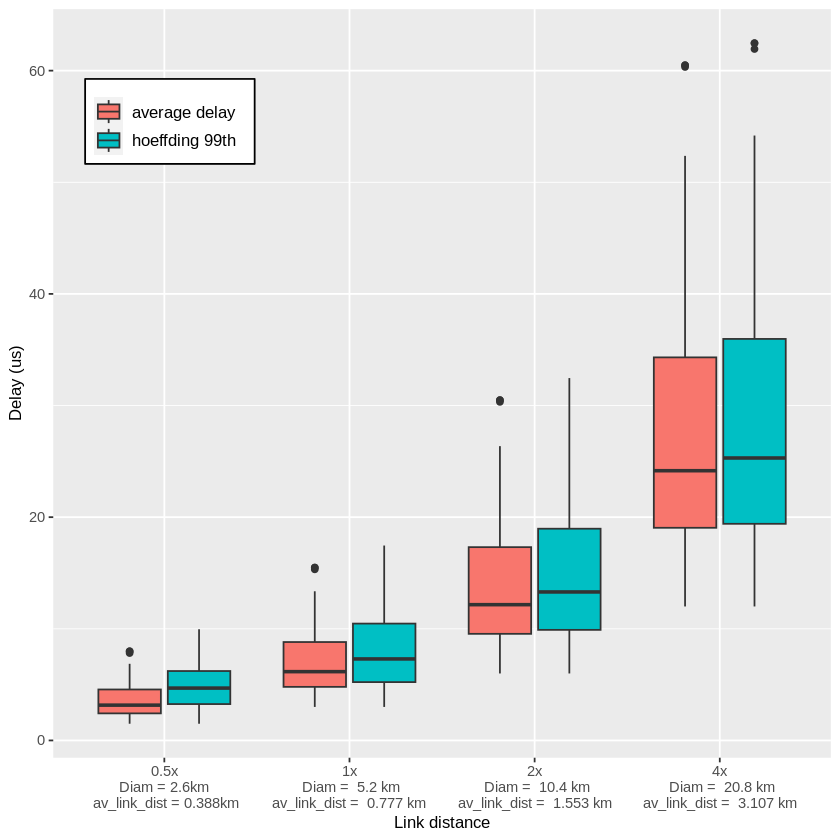

In [77]:
diam_km <-  round(diameter(g_c100_d05g_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_d05g_l05)$Distance), digits = 3)
av_link_km <- round(mean(E(g_c100_d05g_l05)$Distance), digits = 3)
name_05 <- paste0("0.5x\n", "Diam = ", diam_km, "km\n av_link_dist", " = ", av_link_km, "km")
name_1 <- paste("1x\n", "Diam = ", round(diameter(g_c100_dg_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_dg_l05)$Distance), digits = 3), "km\nav_link_dist = ", round(mean(E(g_c100_dg_l05)$Distance), digits = 3), "km")
name_2 <- paste("2x\n", "Diam = ", round(diameter(g_c100_d2g_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_d2g_l05)$Distance), digits = 3), "km\nav_link_dist = ", round(mean(E(g_c100_d2g_l05)$Distance), digits = 3), "km")
name_4 <- paste("4x\n", "Diam = ", round(diameter(g_c100_d4g_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_d4g_l05)$Distance), digits = 3), "km\nav_link_dist = ", round(mean(E(g_c100_d4g_l05)$Distance), digits = 3), "km")

####distanceVSdelay
distance = c(rep(name_05, length(data_99_c100_d05g_l05)),
             rep(name_1, length(data_99_c100_dg_l05)),
             rep(name_2, length(data_99_c100_d2g_l05)),
             rep(name_4, length(data_99_c100_d4g_l05)),
             rep(name_05, length(data_av_c100_d05g_l05)),
             rep(name_1, length(data_av_c100_dg_l05)),
             rep(name_2, length(data_av_c100_d2g_l05)),
             rep(name_4, length(data_av_c100_d4g_l05)))

type_of_calc = c(rep("hoeffding 99th",length(distance)/2),
                 rep("average delay",length(distance)/2))

paste("0.5x", "diam", diam_km, "km av link dist", av_link_km, "km")
value = c(data_99_c100_d05g_l05,
          data_99_c100_dg_l05,
          data_99_c100_d2g_l05,
          data_99_c100_d4g_l05,
          data_av_c100_d05g_l05,
          data_av_c100_dg_l05,
          data_av_c100_d2g_l05,
          data_av_c100_d4g_l05)

df_plot_dist <- data.frame(distance, value, type_of_calc)


# grouped df_plot_dist
ggplot(df_plot_dist, aes(x=distance, y=value*1000000, fill=type_of_calc)) +
  geom_boxplot()+
  theme(
    legend.title = element_blank(), legend.position = c(0.15, 0.85), axis.title.y = element_text(size = 10), axis.title.x = element_text(size = 10),
    legend.text = element_text(size = 10), legend.background = element_rect(colour = "black")
  ) +
  ylab("Delay (us)") +
  xlab("Link distance")


#Creating the report file

In [78]:
update_file <- function(links_info_df, traffic_file, file_name = "Milano_topology_result.xlsx", file_old_name)
{
    wb <- createWorkbook()
    addWorksheet(wb, sheetName = "Nodes")
    writeData(wb, sheet = 1, read_excel(file_old_name, sheet = 1))
    addWorksheet(wb, sheetName = "Links")
    writeData(wb, sheet = 2, links_info_df)
    addWorksheet(wb, sheetName = "Services")
    writeData(wb, sheet = 3, traffic_file)
    saveWorkbook(wb, file_name, overwrite = TRUE)
}

In [79]:
update_file(links_info_df,traffic_file, file_name = "/content/traffic-latency-simulator/input_files/Metro_topology_full_Tokyo.xlsx", file_old_name = "Metro_topology_full_Tokyo.xlsx")


ERROR: ignored